# May 8th, 2021

**Motivation**: Recap, summary figures. </br>

In [1]:
# HIDE CODE


import re
import os
import sys
import collections
import numpy as np
import pandas as pd
import nibabel as nib
from pathlib import Path
from os.path import join as pjoin
from scipy import stats as sp_stats
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')


# GitHub
git_path = pjoin(os.environ['HOME'], 'Dropbox/git/Ca-fMRI/')
sys.path.insert(0, git_path)
from simulation.simulation import *
from utils.plotting import *
from utils.processing import *
from model.configuration import Config

In [2]:
# HIDE CODE


def filter_islands(partition, atlas, node_labels, min_com_size: int = 3):
    coms_ctr = collections.Counter(partition.values())
    
    good_com_idxs = zip(*filter(lambda x: x[1] > min_com_size, coms_ctr.most_common()))
    good_com_idxs = sorted(tuple(good_com_idxs)[0])
    bad_com_idxs = [item for item in set(partition.values()) if item not in good_com_idxs]

    comm_dict = collections.defaultdict(list)
    for k, v in partition.items():
        comm_dict[v].append(k)
    comm_dict = dict(sorted(comm_dict.items()))

    comm_mat = np.ones(atlas.shape) * -1
    for node, com_idx in partition.items():
        region_id = node_labels[node]
        if com_idx in good_com_idxs:
            comm_mat[atlas == region_id] = good_com_idxs.index(com_idx)
        else:
            comm_mat[atlas == region_id] = np.nan
    
    output = {
        'good_com_idxs': good_com_idxs,
        'bad_com_idxs': bad_com_idxs,
        'comm_dict': comm_dict,
        'comm_mat': comm_mat,
    }
    return output


def plot_louvain_communities(
    pearson: dict,
    spearman: dict,
    atlas: np.ndarray,
    contour: np.ndarray,
    modularities: dict,
    selected_idxs: list,
    percentile: int = 20,
    min_com_size: int = 3,
    figsize=(12, 4.5),
    colorbar=False, ):

    x0, y0 = tuple(zip(*modularities.items()))
    best_idx = np.argmax(y0)
    best_res = x0[best_idx]
    
    sns.set_style('white')
    plot_idxs = sorted(selected_idxs + [best_idx])
    fig, axes = plt.subplots(2, len(plot_idxs), figsize=figsize)

    for ii, idx in enumerate(plot_idxs):
        # pearson
        g = nx.from_numpy_matrix(pearson[percentile])
        coms = cdlib_algorithms.louvain(
            g_original=g,
            weight='weight',
            resolution=x0[idx],
            randomize=False,
        )
        partition = convert('community', 'partition', community=coms.communities)
        output = filter_islands(partition, atlas, node_labels, min_com_size=min_com_size)
        q = nx_comm.modularity(g, communities=coms.communities)

        data2plot = np.ma.masked_where(contour, output['comm_mat'])
        im = axes[0, ii].imshow(data2plot, cmap='Spectral_r', interpolation='none')
        if colorbar:
            plt.colorbar(im, ax=axes[0, ii], shrink=0.7)
        msg = 'Q = {:.3f},  # com = {:d}'
        msg = msg.format(q, len(np.unique(output['comm_mat'][output['comm_mat']>-1])))
        axes[0, ii].set_title(msg, y=1.03)
        
        # spearman
        g = nx.from_numpy_matrix(spearman[percentile])
        coms = cdlib_algorithms.louvain(
            g_original=g,
            weight='weight',
            resolution=x0[idx],
            randomize=False,
        )
        partition = convert('community', 'partition', community=coms.communities)
        output = filter_islands(partition, atlas, node_labels, min_com_size=min_com_size)
        q = nx_comm.modularity(g, communities=coms.communities)
    
        data2plot = np.ma.masked_where(contour, output['comm_mat'])
        im = axes[1, ii].imshow(data2plot, cmap='RdYlBu_r', interpolation='none')
        if colorbar:
            plt.colorbar(im, ax=axes[1, ii], shrink=0.7)
        msg = 'res = {:.3f}\n\nQ = {:.3f},  # com = {:d}'
        msg = msg.format(x0[idx], q, len(np.unique(output['comm_mat'][output['comm_mat']>-1])))
        axes[1, ii].set_title(msg, y=1.03)
        

        if ii == 0:
            msg1 = 'pearson\n(th = {:.2f})\n'
            msg1 = msg1.format(np.min(pearson[percentile][pearson[percentile] > 0]))
            msg2 = 'spearman\n(th = {:.2f})\n'
            msg2 = msg2.format(np.min(spearman[percentile][spearman[percentile] > 0]))
            axes[0, ii].set_ylabel(msg1, fontsize=12)
            axes[1, ii].set_ylabel(msg2, fontsize=12)
            
        for j in range(2):
            axes[j, ii].set_xticks([])
            axes[j, ii].set_yticks([])

    fig.tight_layout()
    plt.show()
    
    return fig, axes



def plot_leiden_communities(
    pearson: dict,
    spearman: dict,
    atlas: np.ndarray,
    contour: np.ndarray,
    figsize=None,
    colorbar=False,):
    
    percentiles = list(spearman.keys())
    
    sns.set_style('white')
    figsize = (5.2, 2*len(percentiles)) if figsize is None else figsize
    fig, axes = plt.subplots(len(percentiles), 2, figsize=figsize)

    for ii, perc in enumerate(sorted(percentiles, reverse=True)):
        # pearson
        g = nx.from_numpy_matrix(pearson[perc])
        coms = cdlib_algorithms.leiden(g, weights='weight')
        partition = convert('community', 'partition', community=coms.communities)
        output = filter_islands(partition, atlas, node_labels, min_com_size=3)
        q = nx_comm.modularity(g, communities=coms.communities)

        data2plot = np.ma.masked_where(contour, output['comm_mat'])
        im = axes[ii, 0].imshow(data2plot, cmap='Spectral_r', interpolation='none')
        if colorbar:
            plt.colorbar(im, ax=axes[ii, 0], shrink=0.9)
        if ii == 0:
            msg = 'Pearson\n\n'
        else:
            msg = ''
        msg += 'Q = {:.3f},  # com = {:d}'
        msg = msg.format(q, len(np.unique(output['comm_mat'][output['comm_mat']>-1])))
        axes[ii, 0].set_title(msg, fontsize=12, y=1.03)
        
        # spearman
        g = nx.from_numpy_matrix(spearman[perc])
        coms = cdlib_algorithms.leiden(g, weights='weight')
        partition = convert('community', 'partition', community=coms.communities)
        output = filter_islands(partition, atlas, node_labels, min_com_size=3)
        q = nx_comm.modularity(g, communities=coms.communities)
        
        data2plot = np.ma.masked_where(contour, output['comm_mat'])
        im = axes[ii, 1].imshow(data2plot, cmap='RdYlBu_r', interpolation='none')
        if colorbar:
            plt.colorbar(im, ax=axes[ii, 1], shrink=0.9)
        if ii == 0:
            msg = 'Spearman\n\n'
        else:
            msg = ''
        msg += 'Q = {:.3f},  # com = {:d}'
        msg = msg.format(q, len(np.unique(output['comm_mat'][output['comm_mat']>-1])))
        axes[ii, 1].set_title(msg, fontsize=12, y=1.03)
        axes[ii, 1].set_ylabel('Using {:d} {:s} \n'.format(perc, '%'), fontsize=12)
        
        for j in range(2):
            axes[ii, j].set_xticks([])
            axes[ii, j].set_yticks([])

    fig.tight_layout()
    plt.show()
    
    return fig, axes



from skimage.feature import canny
import functools


def organize_atlas(organized_data: dict, include: List = None, config: Config = None):
    config = Config() if config is None else config
    regions = np.unique(organized_data['atlas'])
    regions = {i: config.region_labels[i] for i in regions if i > 0}
    
    include = [i for i in regions if i < 24] if include is None else include
    exclude = [item for item in regions if item not in include]
    mapping = {i+1: regions[item].split('(')[0].strip() for i, item in enumerate(include)}

    atlas = organized_data['atlas'].copy().astype(float)
    cond = functools.reduce(np.logical_or, [atlas == r for r in exclude])
    x = np.ma.masked_where(cond, atlas)

    for i, true_i in zip(mapping, include):
        x[x == true_i] = i

    mapping[0] = 'background'
    mapping = dict(sorted(mapping.items()))

    contour = atlas.copy()
    for i, true_i in enumerate(regions):
        contour[contour == true_i] = i
    contour = canny(contour, sigma=1e-10)
    y = np.ma.masked_where(contour, x)

    output = {
        'regions': regions,
        'mapping': mapping,
        'atlas_limited': x,
        'contour': contour,
        'atlas_masked': y,
    }
    return output

## Allen atlas visualization

In [3]:
config = Config()

num_regions = 256
subject = 6
session = 1
run = 1

load = load_organized_data(
    folder='atlas-{:d}_unfiltered_unnormalized'.format(num_regions),
    config=config,
    subject=subject,
    session=session,
    run=run,
)

In [4]:
atls_org = organize_atlas(load)

In [5]:
atls_org['regions']

{2: 'R-Primary motor area (MOp,985)',
 3: 'R-Secondary motor area (MOs,993)',
 4: 'R-Primary somatosensory area, nose (SSp-n,353)',
 5: 'R-Primary somatosensory area, barrel field (SSp-bfd,329)',
 6: 'R-Primary somatosensory area, lower limb (SSp-ll,337)',
 7: 'R-Primary somatosensory area, mouth (SSp-m,345)',
 8: 'R-Primary somatosensory area, upper limb (SSp-ul,369)',
 9: 'R-Primary somatosensory area, trunk (SSp-tr,361)',
 10: 'R-Primary somatosensory area, unassigned (SSp-un,182305689)',
 11: 'R-Supplemental somatosensory area (SSs,378)',
 14: 'R-Dorsal auditory area (AUDd,1011)',
 15: 'R-Primary auditory area (AUDp,1002)',
 16: 'R-Posterior auditory area (AUDpo,1027)',
 18: 'R-Anterolateral visual area (VISal,402)',
 19: 'R-Anteromedial visual area (VISam,394)',
 20: 'R-Lateral visual area (VISl,409)',
 21: 'R-Primary visual area (VISp,385)',
 22: 'R-Posterolateral visual area (VISpl,425)',
 23: 'R-posteromedial visual area (VISpm,533)',
 24: 'R-Anterior area (VISa,312782546)',
 2

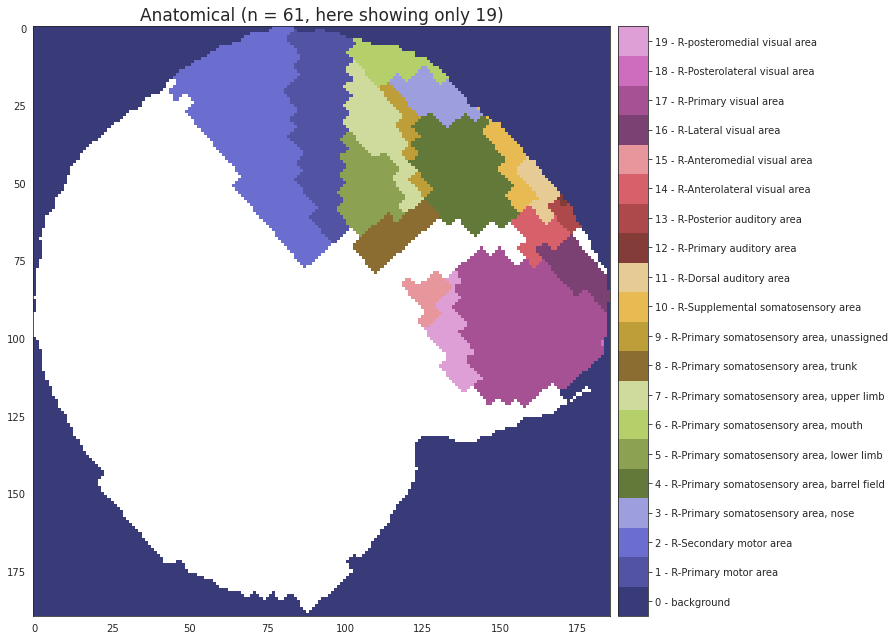

In [6]:
fig, ax = plt.subplots(figsize=(13.5, 9))
vmin = min(atls_org['mapping']) - 0.5
vmax = len(atls_org['mapping']) - 0.5
cax = ax.imshow(atls_org['atlas_limited'], cmap='tab20b', interpolation='none', vmin=vmin, vmax=vmax)

msg = 'Anatomical (n = {:d}, here showing only {:d})'
msg = msg.format(len(atls_org['regions']), len(atls_org['mapping']) - 1)
plt.title(msg, fontsize=17)

cbar = fig.colorbar(cax, ticks=[item for item in atls_org['mapping']], pad=0.01)
tick_labels = ['{:d} - {:s}'.format(k, v) for k, v in atls_org['mapping'].items()]
cbar.ax.set_yticklabels(tick_labels)

fig.tight_layout()
plt.show()

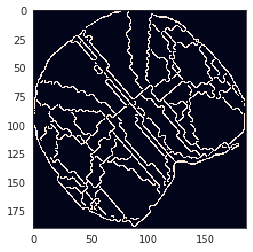

In [7]:
plt.imshow(atls_org['contour'], interpolation='none')

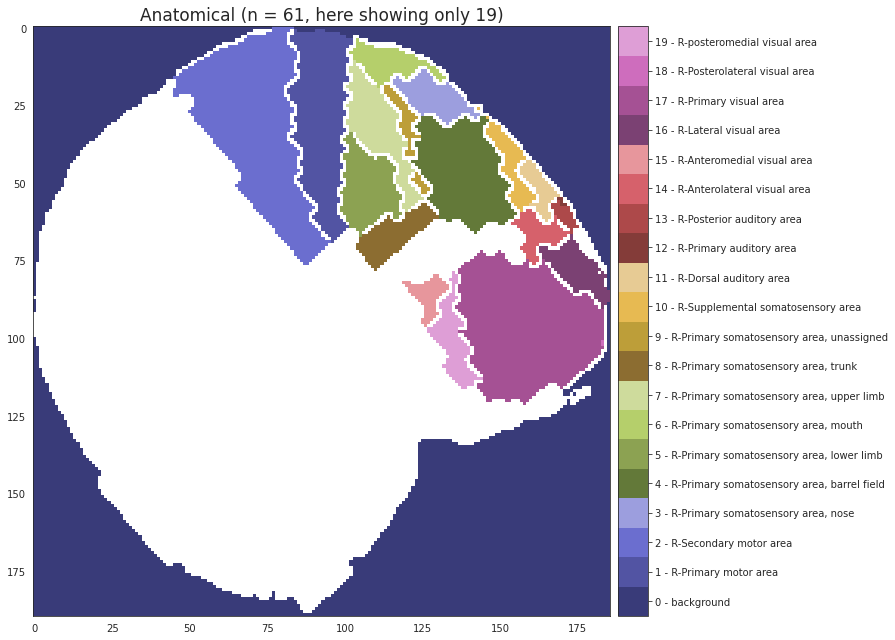

In [8]:
fig, ax = plt.subplots(figsize=(13.5, 9))
vmin = min(atls_org['mapping']) - 0.5
vmax = len(atls_org['mapping']) - 0.5
cax = ax.imshow(atls_org['atlas_masked'], cmap='tab20b', interpolation='none', vmin=vmin, vmax=vmax)

msg = 'Anatomical (n = {:d}, here showing only {:d})'
msg = msg.format(len(atls_org['regions']), len(atls_org['mapping']) - 1)
plt.title(msg, fontsize=17)

cbar = fig.colorbar(cax, ticks=[item for item in atls_org['mapping']], pad=0.01)
tick_labels = ['{:d} - {:s}'.format(k, v) for k, v in atls_org['mapping'].items()]
cbar.ax.set_yticklabels(tick_labels)

fig.tight_layout()
plt.show()

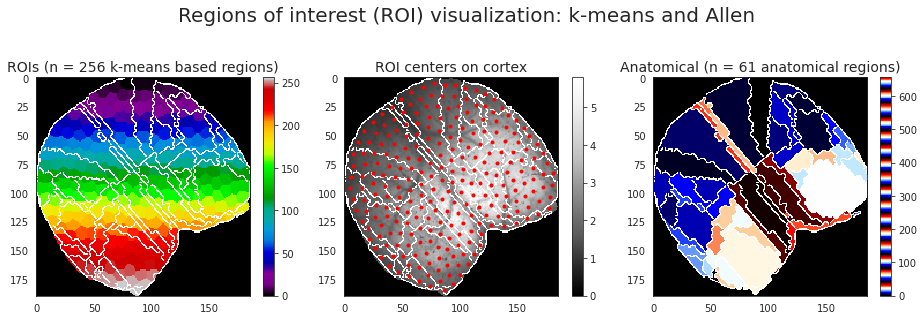

In [9]:
sns.set_style('white')
plt.figure(figsize=(13, 4.5))
plt.subplot(131)
plt.imshow(np.ma.masked_where(atls_org['contour'], load['atlas_kmeans']),
           cmap='nipy_spectral', interpolation='none')
plt.colorbar(shrink=0.8)
plt.title('ROIs (n = {:d} k-means based regions)'.format(num_regions), fontsize=14)

plt.subplot(132)
plt.imshow(np.ma.masked_where(atls_org['contour'], load['ref']), cmap='Greys_r', interpolation='none')
for j, i in load['kmeans_centers']: 
    plt.plot(i, j, marker='o', color='r', markersize=3)
plt.colorbar(shrink=0.8)
plt.title('ROI centers on cortex', fontsize=14)
    
plt.subplot(133)
plt.imshow(np.ma.masked_where(atls_org['contour'], load['atlas']), cmap='flag_r', interpolation='none')
plt.colorbar(shrink=0.8)
plt.title('Anatomical (n = {:d} anatomical regions)'.format(len(atls_org['regions'])), fontsize=14)

sup = plt.suptitle('Regions of interest (ROI) visualization: k-means and Allen', fontsize=20, y=1.01)
plt.tight_layout()

# plt.savefig('kmeans_atlas_{:d}.pdf'.format(num_regions), dpi=300, bbox_inches='tight', bbox_extra_artists=[sup])
plt.show()

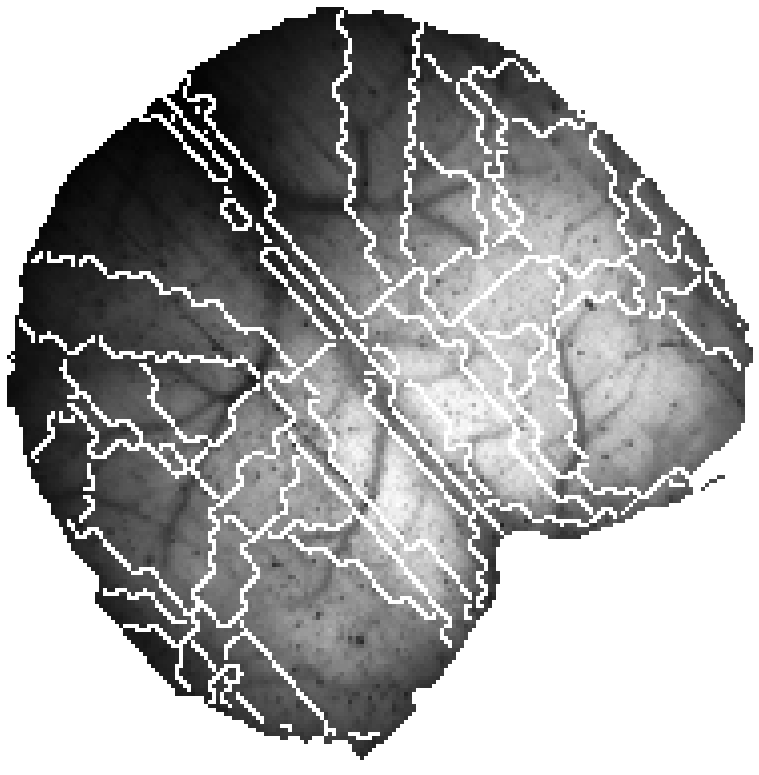

In [10]:
sns.set_style('white')
plt.figure(figsize=(18, 14))
cond = np.logical_or(atls_org['contour'], load['atlas'] == 0)
plt.imshow(np.ma.masked_where(cond, load['ref']), cmap='Greys_r', interpolation='antialiased')
plt.axis('off')
plt.show()
# plt.colorbar(aspect=40)
# plt.savefig('reference_minimal.pdf', dpi=300, bbox_inches='tight')

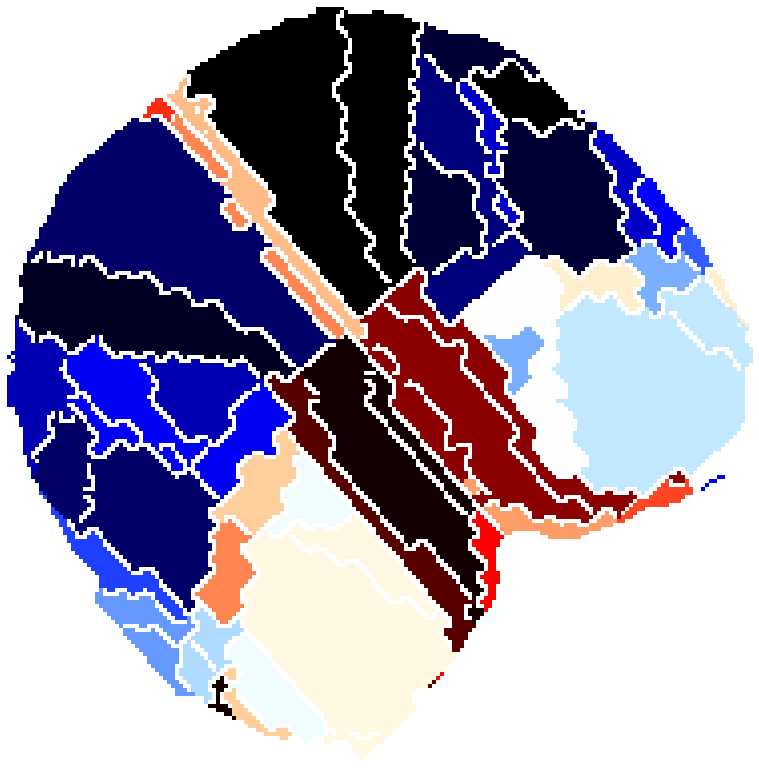

In [11]:
sns.set_style('white')
plt.figure(figsize=(18, 14))
cond = np.logical_or(atls_org['contour'], load['atlas'] == 0)
plt.imshow(np.ma.masked_where(cond, load['atlas']), cmap='flag_r', interpolation='none')
plt.axis('off')
plt.show()
# lt.colorbar(aspect=40)
# plt.savefig('atlas.pdf', dpi=300, bbox_inches='tight')

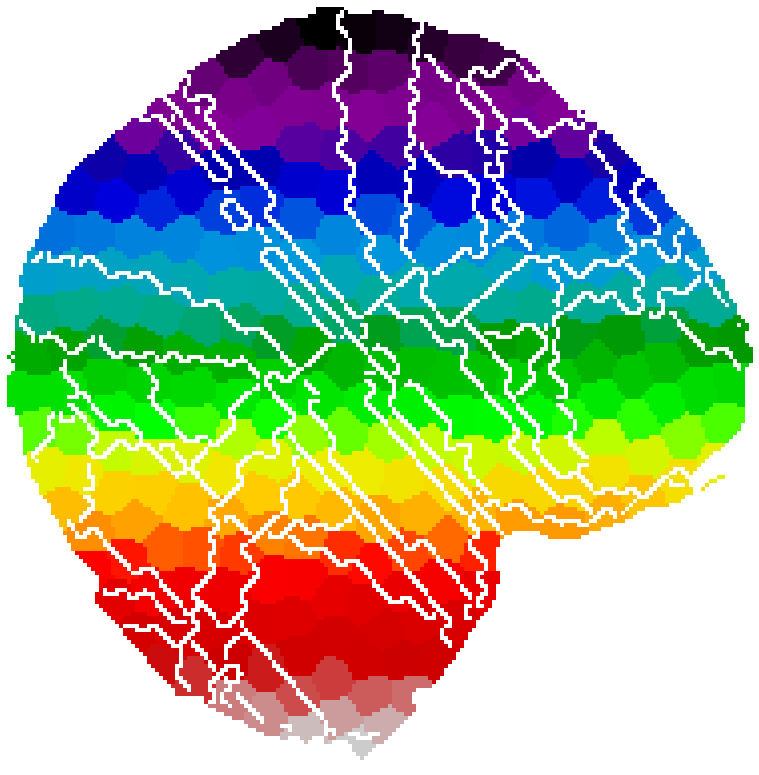

In [12]:
sns.set_style('white')
plt.figure(figsize=(18, 14))
cond = np.logical_or(atls_org['contour'], load['atlas'] == 0)
plt.imshow(np.ma.masked_where(cond, load['atlas_kmeans']),
           cmap='nipy_spectral', interpolation='none')
# plt.colorbar(aspect=40)
plt.axis('off')
plt.show()
# plt.savefig('kmeans_atlas_{:d}_2.pdf'.format(num_regions), dpi=300, bbox_inches='tight')

## Allen parcellation, community structure

In [13]:
data_all = {}
df = pd.DataFrame()
for run in [1, 3, 5, 7]:
    _load = load_organized_data(
        folder='atlas-allen_unfiltered_unnormalized',
        config=config,
        subject=subject,
        session=session,
        run=run,
    )
    data_all[run] = _load
    
    # normalize
    mean = np.mean([item.mean() for item in _load['ca'].values()])
    sd = np.mean([item.std() for item in _load['ca'].values()])
    _ca = {k: (v - mean) / sd for k, v in _load['ca'].items()}
    _df = pd.DataFrame.from_dict(_ca)
    df = pd.concat([df, _df])

node_labels = df.columns.values.tolist()
node_labels = {i: lbl for i, lbl in enumerate(node_labels)}

df.describe()

,2,3,4,5,6,7,8,9,10,11,...,525,526,528,530,538,539,540,541,655,656
count,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,...,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000
mean,-0.016470,-0.018240,-0.015282,-0.003259,0.018897,-0.016037,-0.006291,0.048155,-0.008254,-0.008132,...,-0.034107,-0.016903,-0.004136,-0.017237,0.028251,0.064408,0.062204,-0.034549,0.025482,-0.015245
std,0.629801,0.466723,0.633126,1.220131,1.269930,0.422778,0.965836,1.928495,1.074744,0.832809,...,0.504141,1.087339,0.399043,0.179432,1.688213,2.205852,1.665477,0.457557,0.849909,0.637300
min,-2.448160,-1.950162,-2.127644,-4.117877,-4.076775,-1.576220,-3.272419,-5.927036,-3.740386,-2.652617,...,-1.935170,-3.434844,-1.546170,-0.726891,-6.097915,-7.547431,-7.089397,-1.765626,-3.180276,-2.387982
25%,-0.428421,-0.314127,-0.452591,-0.845619,-0.833966,-0.302064,-0.657687,-1.265214,-0.746149,-0.587083,...,-0.369868,-0.762635,-0.247245,-0.137745,-0.986188,-1.292455,-0.975689,-0.338368,-0.521417,-0.421664
50%,-0.013142,-0.018966,-0.032826,-0.029985,-0.019495,-0.023853,-0.025799,-0.030234,-0.033669,-0.029572,...,-0.033002,-0.035239,-0.019736,-0.017527,0.096717,0.158215,0.079588,-0.030011,0.022124,-0.026428
75%,0.394903,0.269910,0.394358,0.798206,0.849160,0.258890,0.634490,1.285492,0.703723,0.531091,...,0.291316,0.696168,0.213845,0.094695,1.122999,1.448869,1.011084,0.264375,0.525521,0.365549
max,3.802673,3.315142,3.156683,6.369267,7.755381,1.860840,4.785238,10.427175,5.674547,4.721781,...,2.633923,5.843461,5.597064,1.116010,12.347784,16.508649,19.975790,2.203298,11.461152,6.242416


In [14]:
percentiles = [30, 25, 20, 18, 15, 10]
corrs = get_corrs(df, percentiles=percentiles)

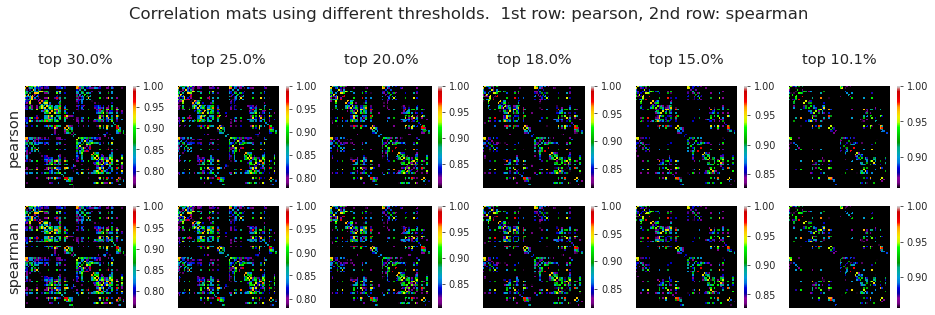

In [15]:
_ = plot_corrs(corrs['pearson'], corrs['spearman'])

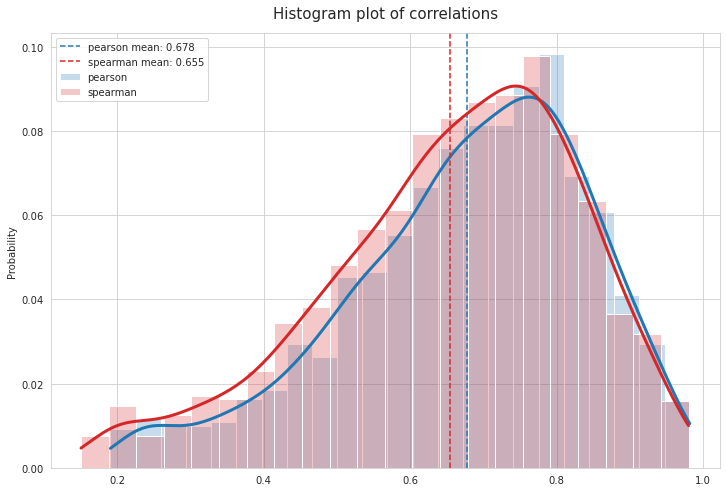

In [17]:
_ = plot_corr_hist(
    corr_list=[corrs['pearson_corr'], corrs['spearman_corr']],
    labels=['pearson', 'spearman'],
    colors=['C0', 'C3'],
)

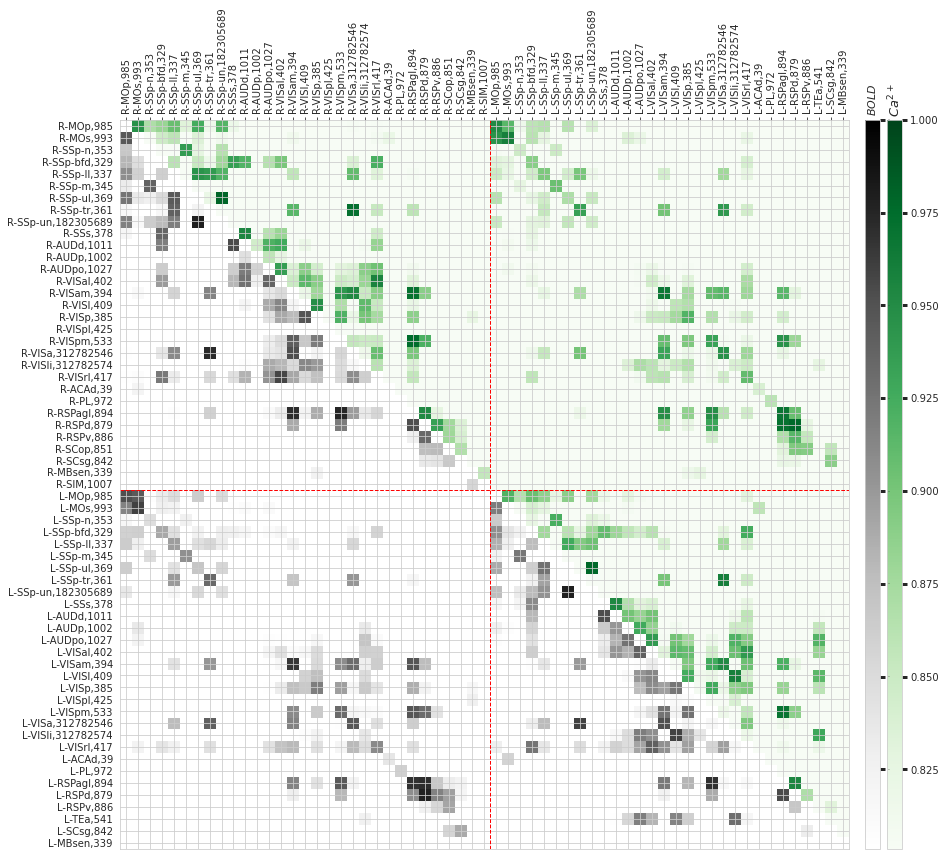

In [18]:
perc = 20
data1 = corrs['spearman'][perc].copy()
data2 = corrs['spearman'][perc].copy()

lower = np.tril_indices(len(atls_org['regions']))
upper = np.triu_indices(len(atls_org['regions']))

data1[lower] = np.nan
data2[upper] = np.nan

ticks = []
for i, (region_id, label) in enumerate(atls_org['regions'].items()):
    prefix = label[:2]
    label_short = label.split('(')[1].split(')')[0].strip()
    tick = ''.join([prefix, label_short])
    ticks.append((i, tick))
ticks, tick_labels = zip(*ticks)
boundary_idx = [i[0] != j[0] for i, j in zip(tick_labels, tick_labels[1:])].index(True)

sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(16, 12))

im1 = ax.imshow(data1, cmap='Greens', vmin=np.min(data1[data1 > 0]), vmax=1)
im2 = ax.imshow(data2, cmap='Greys', vmin=np.min(data2[data2 > 0]), vmax=1)

ax.xaxis.tick_top()
ax.set_xticks(ticks)
ax.set_xticklabels(tick_labels, fontsize=10, rotation=90)
ax.set_yticks(ticks)
ax.set_yticklabels(tick_labels, fontsize=10, rotation=0)
ax.xaxis.set_label_position('top')

cax1 = fig.colorbar(im1, aspect=50, ax=ax, pad=-0.126)
cax2 = fig.colorbar(im2, aspect=50, pad=0.015)
cax1.ax.tick_params(labelsize=10, length=5, width=3)
cax2.ax.tick_params(labelsize=0, length=5, width=3)
# cax1.ax.set_xlabel('$Ca^{2+}$', fontsize=18, rotation=-90)
# cax2.ax.set_xlabel('$BOLD$', fontsize=16, rotation=-90)
cax1.ax.set_title('$Ca^{2+}$', fontsize=13, rotation=90)
cax2.ax.set_title('$BOLD$', fontsize=11, rotation=90)

ax.axhline(boundary_idx + 0.5, color='r', ls='--', lw=1)
ax.axvline(boundary_idx + 0.5, color='r', ls='--', lw=1)

fig.tight_layout()
fig.savefig('rsFC_perc{:d}.pdf'.format(perc), dpi=600)
plt.show()

In [19]:
graphs = {perc: nx.from_numpy_matrix(a) for perc, a in corrs['spearman'].items()}

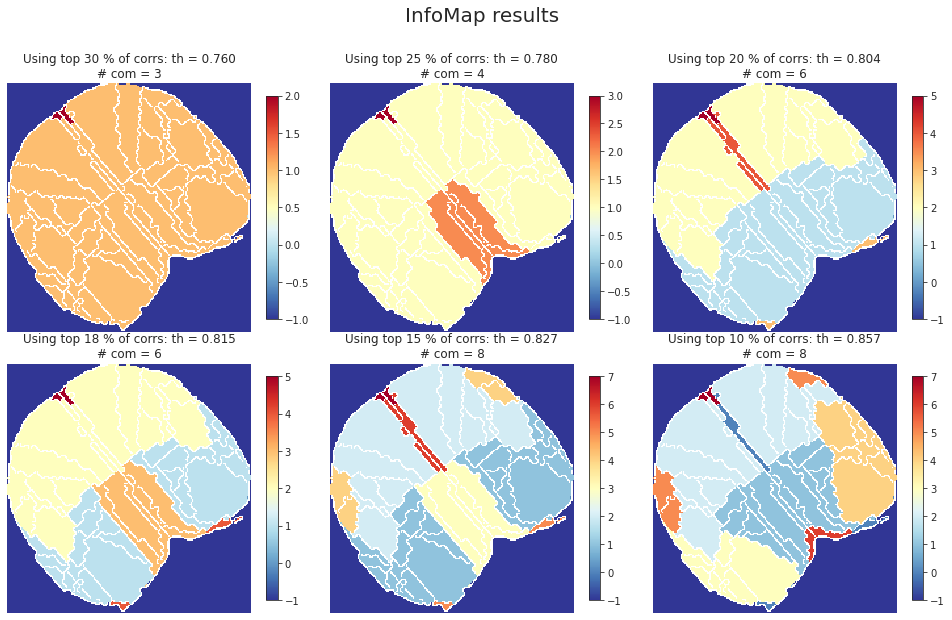

In [23]:
sns.set_style('white')
nrows, ncols = 2, len(graphs)//2
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 8.5))

for idx, (perc, g) in enumerate(graphs.items()):
    infomap_coms = cdlib_algorithms.infomap(g)
    infomap_community = infomap_coms.communities
    infomap_partition = convert('community', 'partition', community=infomap_community)
    output = filter_islands(infomap_partition, load['atlas'], node_labels, min_com_size=0)
    msg = 'Using top {:d} {:s} of corrs: th = {:.3f}\n# com = {:d}'
    msg = msg.format(
        perc, '%', np.min(corrs['spearman'][perc][corrs['spearman'][perc] > 0]),
        len(np.unique(output['comm_mat'][output['comm_mat']>-1])),
    )
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(
        np.ma.masked_where(atls_org['contour'], output['comm_mat']), cmap='RdYlBu_r', interpolation='none')
    axes[i, j].set_title(msg, fontsize=12)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], shrink=0.85)

sup = fig.suptitle('InfoMap results', fontsize=20, y=1.02)
fig.tight_layout()    
plt.show()

In [24]:
results_louvain = run_louvain(graphs[20], res=np.logspace(-1, 1, 10001))

  0%|          | 0/10001 [00:00<?, ?it/s]

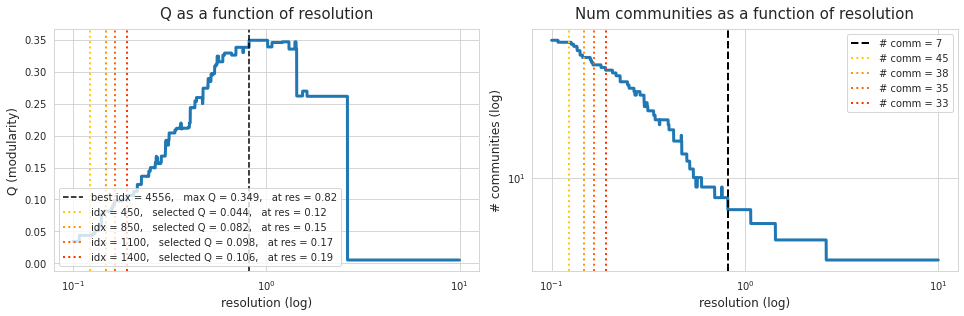

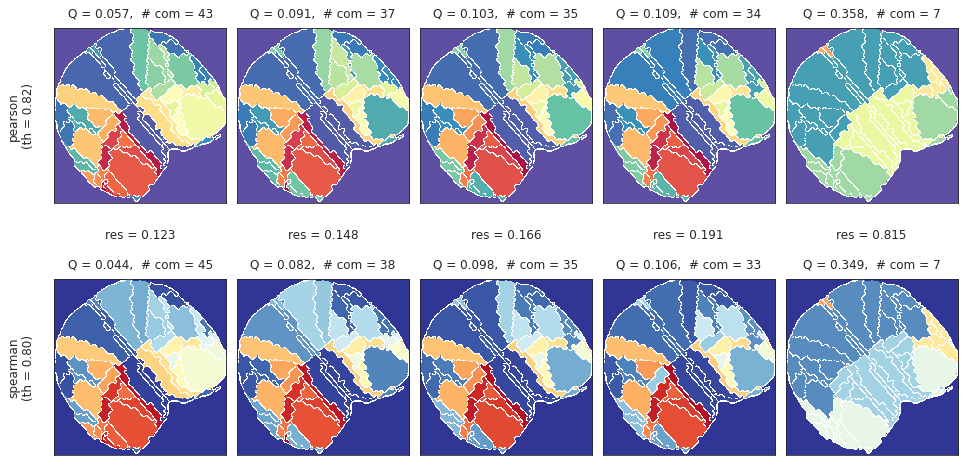

In [26]:
selected_idxs = [450, 850, 1100, 1400]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

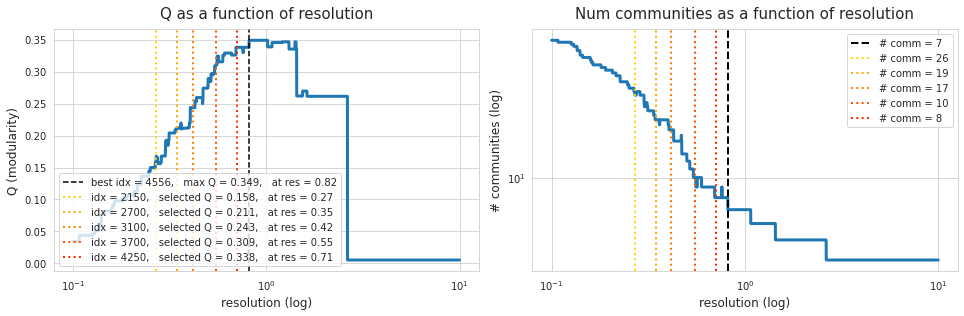

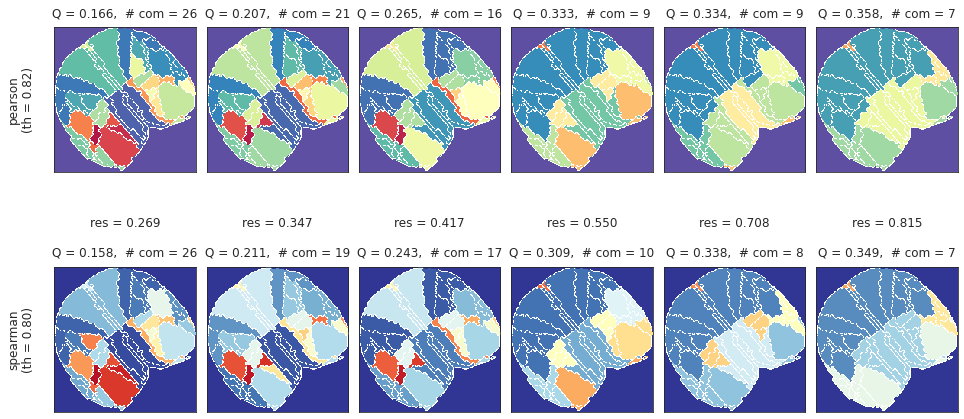

In [27]:
selected_idxs = [2150, 2700, 3100, 3700, 4250]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

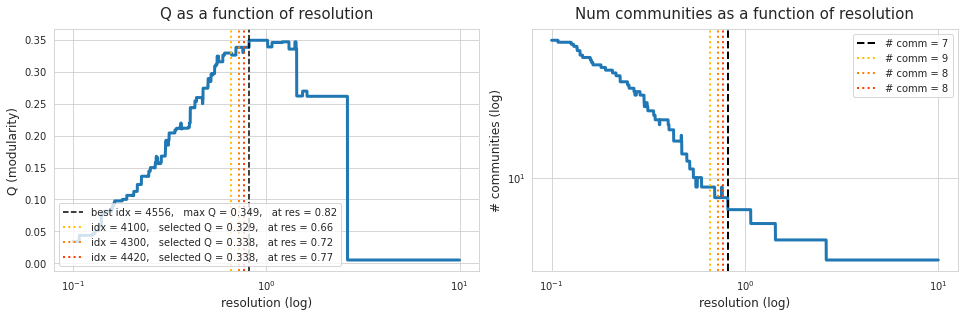

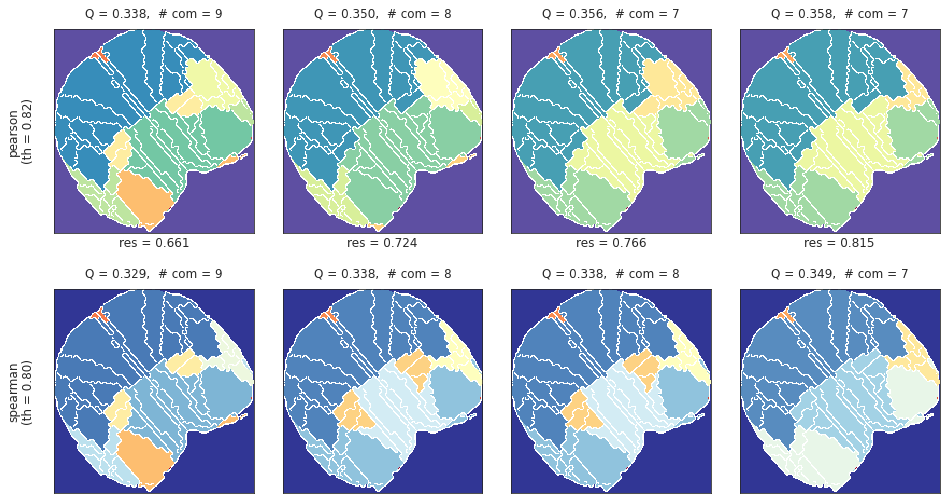

In [29]:
selected_idxs = [4100, 4300, 4420]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

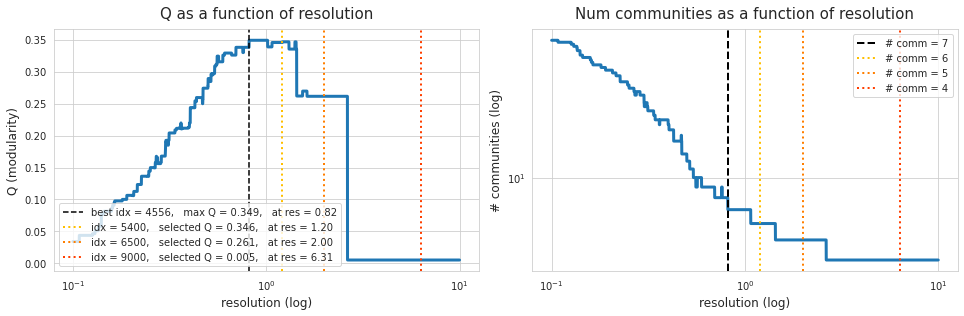

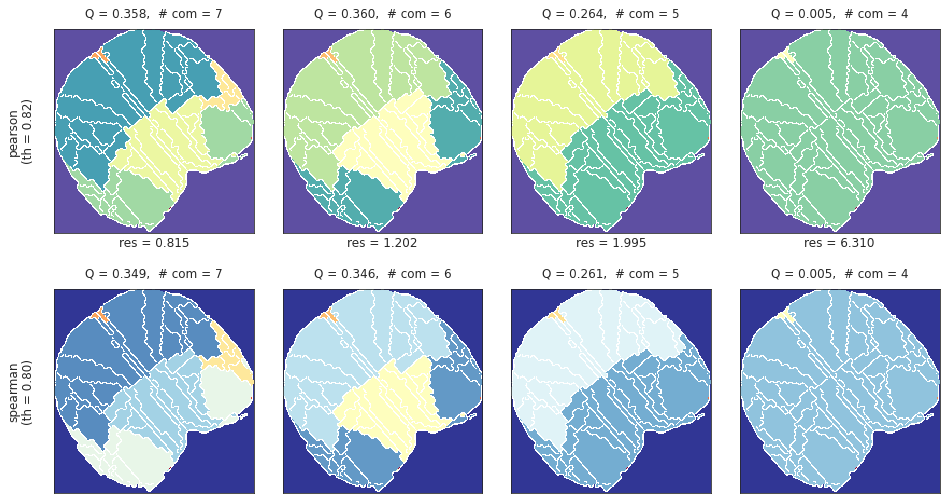

In [33]:
selected_idxs = [5400, 6500, 9000]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

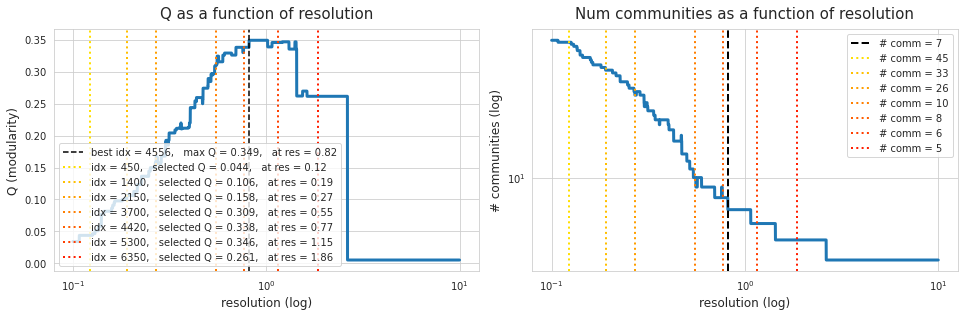

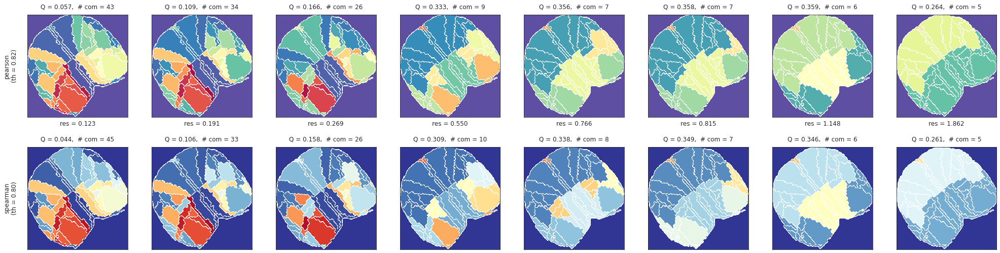

In [36]:
selected_idxs = [450, 1400, 2150, 3700, 4420, 5300, 6350]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(28, 7),
    colorbar=False, )

#### Leiden

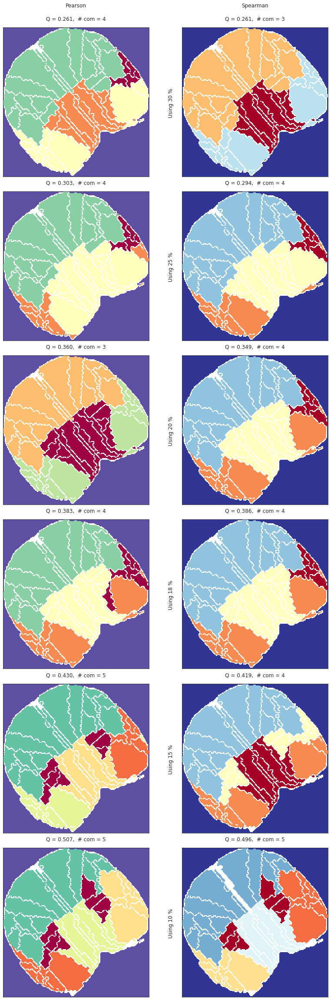

In [39]:
_ = plot_leiden_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    figsize=(12, 32),
    colorbar=False,
)

### Apply bandpass
- lowcut: 0.1
- highcut: 1 Hz

In [40]:
lowcut = 0.1
highcut = 1.000
order = 2

data_all = {}
df = pd.DataFrame()
for run in [1, 3, 5, 7]:
    _load = load_organized_data(
        folder='atlas-allen_unfiltered_unnormalized',
        config=config,
        subject=subject,
        session=session,
        run=run,
    )
    
    # bandpass
    ca_bp = {
        k: apply_bandpass(
            x=v,
            fs=config.ca_fs,
            lowcut=lowcut,
            highcut=highcut,
            order=order,
        ) for k, v in _load['ca'].items()
    }
    
    # normalize
    mean = np.mean([item.mean() for item in ca_bp.values()])
    sd = np.mean([item.std() for item in ca_bp.values()])
    ca_bp_n = {k: (v - mean) / sd for k, v in ca_bp.items()}
    data_all[run] = ca_bp_n
    
    df = pd.concat([df, pd.DataFrame.from_dict(ca_bp_n)])

node_labels = df.columns.values.tolist()
node_labels = {i: lbl for i, lbl in enumerate(node_labels)}

df.describe()

,2,3,4,5,6,7,8,9,10,11,...,525,526,528,530,538,539,540,541,655,656
count,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,...,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000
mean,0.001939,0.000822,0.002115,0.004070,0.001343,0.001071,0.001529,0.002692,0.002449,0.003392,...,-0.000083,0.000665,0.001629,0.001507,-0.004744,-0.007571,-0.007886,-0.000162,-0.001190,0.000383
std,0.622147,0.471751,0.631843,1.281212,1.267102,0.415784,0.980341,1.936099,1.061108,0.820616,...,0.516991,1.148423,0.394364,0.105748,1.668143,2.216215,1.519148,0.465219,0.891493,0.680491
min,-3.729998,-3.087954,-2.500377,-5.712194,-7.147656,-1.895035,-4.974277,-10.513264,-5.354759,-3.619599,...,-2.961744,-5.404695,-3.408447,-1.133876,-11.333323,-14.222164,-12.549268,-2.420016,-7.749894,-5.262980
25%,-0.366626,-0.273702,-0.409565,-0.807479,-0.795706,-0.259873,-0.625596,-1.206226,-0.679429,-0.496368,...,-0.300824,-0.720474,-0.215368,-0.046783,-0.956757,-1.281081,-0.862823,-0.274159,-0.477181,-0.360950
50%,0.024438,0.025537,-0.006847,-0.003766,-0.011092,-0.005326,-0.002238,-0.020031,-0.013065,0.016563,...,0.003949,-0.015347,0.009919,0.001080,0.006091,-0.054253,0.018953,0.004354,0.029436,0.013474
75%,0.391408,0.297776,0.406209,0.826421,0.791632,0.267977,0.607296,1.228485,0.641390,0.528837,...,0.328103,0.751662,0.245129,0.052708,0.950852,1.255313,0.844681,0.300157,0.514668,0.376688
max,2.636068,1.927198,2.690729,4.753473,5.298930,1.910139,3.980594,8.389150,4.813806,2.823254,...,1.803038,4.164405,2.955647,0.429885,7.446683,10.541476,10.750555,1.701171,6.359766,3.450219


In [41]:
percentiles = [30, 25, 20, 18, 15, 10]
corrs = get_corrs(df, percentiles=percentiles)

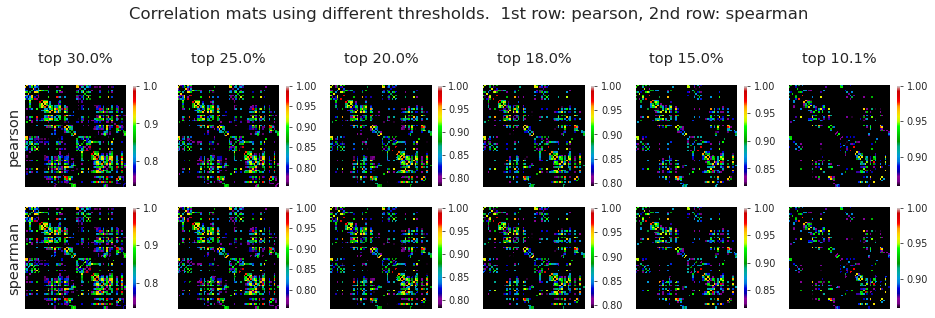

In [42]:
_ = plot_corrs(corrs['pearson'], corrs['spearman'])

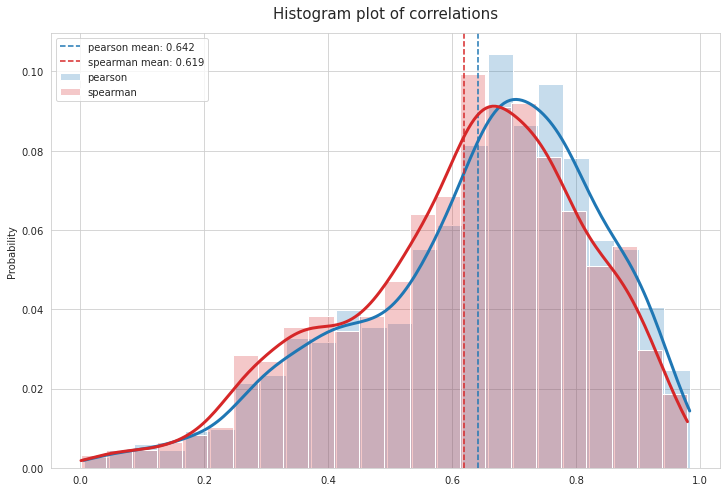

In [43]:
_ = plot_corr_hist(
    corr_list=[corrs['pearson_corr'], corrs['spearman_corr']],
    labels=['pearson', 'spearman'],
    colors=['C0', 'C3'],
)

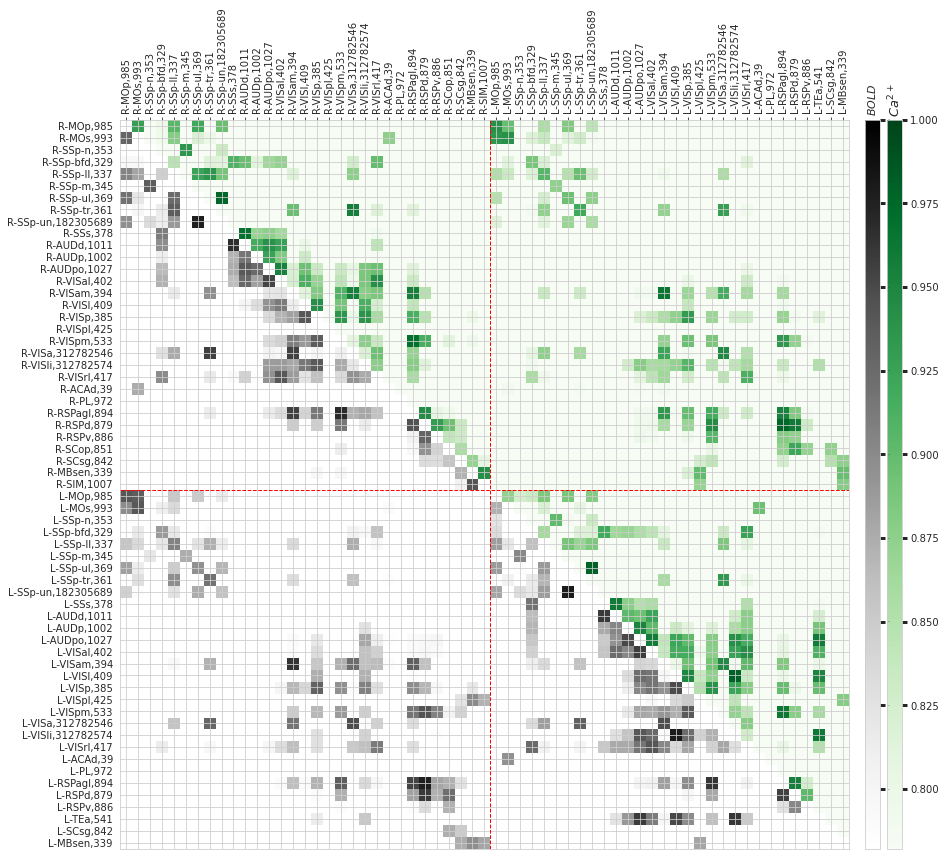

In [44]:
perc = 20
data1 = corrs['spearman'][perc].copy()
data2 = corrs['spearman'][perc].copy()

lower = np.tril_indices(len(atls_org['regions']))
upper = np.triu_indices(len(atls_org['regions']))

data1[lower] = np.nan
data2[upper] = np.nan

ticks = []
for i, (region_id, label) in enumerate(atls_org['regions'].items()):
    prefix = label[:2]
    label_short = label.split('(')[1].split(')')[0].strip()
    tick = ''.join([prefix, label_short])
    ticks.append((i, tick))
ticks, tick_labels = zip(*ticks)
boundary_idx = [i[0] != j[0] for i, j in zip(tick_labels, tick_labels[1:])].index(True)

sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(16, 12))

im1 = ax.imshow(data1, cmap='Greens', vmin=np.min(data1[data1 > 0]), vmax=1)
im2 = ax.imshow(data2, cmap='Greys', vmin=np.min(data2[data2 > 0]), vmax=1)

ax.xaxis.tick_top()
ax.set_xticks(ticks)
ax.set_xticklabels(tick_labels, fontsize=10, rotation=90)
ax.set_yticks(ticks)
ax.set_yticklabels(tick_labels, fontsize=10, rotation=0)
ax.xaxis.set_label_position('top')

cax1 = fig.colorbar(im1, aspect=50, ax=ax, pad=-0.126)
cax2 = fig.colorbar(im2, aspect=50, pad=0.015)
cax1.ax.tick_params(labelsize=10, length=5, width=3)
cax2.ax.tick_params(labelsize=0, length=5, width=3)
# cax1.ax.set_xlabel('$Ca^{2+}$', fontsize=18, rotation=-90)
# cax2.ax.set_xlabel('$BOLD$', fontsize=16, rotation=-90)
cax1.ax.set_title('$Ca^{2+}$', fontsize=13, rotation=90)
cax2.ax.set_title('$BOLD$', fontsize=11, rotation=90)

ax.axhline(boundary_idx + 0.5, color='r', ls='--', lw=1)
ax.axvline(boundary_idx + 0.5, color='r', ls='--', lw=1)

fig.tight_layout()
# fig.savefig('rsFC_perc{:d}.pdf'.format(perc), dpi=600)
plt.show()

In [45]:
graphs = {perc: nx.from_numpy_matrix(a) for perc, a in corrs['spearman'].items()}

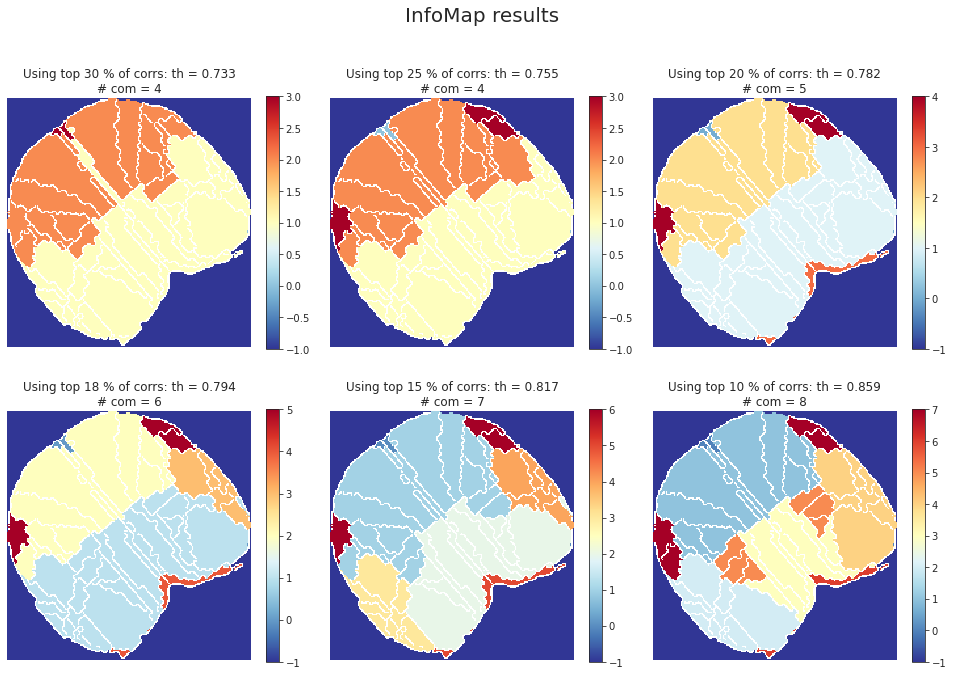

In [48]:
sns.set_style('white')
nrows, ncols = 2, len(graphs)//2
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 9.5))

for idx, (perc, g) in enumerate(graphs.items()):
    infomap_coms = cdlib_algorithms.infomap(g)
    infomap_community = infomap_coms.communities
    infomap_partition = convert('community', 'partition', community=infomap_community)
    output = filter_islands(infomap_partition, load['atlas'], node_labels, min_com_size=0)
    msg = 'Using top {:d} {:s} of corrs: th = {:.3f}\n# com = {:d}'
    msg = msg.format(
        perc, '%', np.min(corrs['spearman'][perc][corrs['spearman'][perc] > 0]),
        len(np.unique(output['comm_mat'][output['comm_mat']>-1])),
    )
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(
        np.ma.masked_where(atls_org['contour'], output['comm_mat']), cmap='RdYlBu_r', interpolation='none')
    axes[i, j].set_title(msg, fontsize=12)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], shrink=0.8)

sup = fig.suptitle('InfoMap results', fontsize=20, y=1.02)
fig.tight_layout()    
plt.show()

In [49]:
results_louvain = run_louvain(graphs[20], res=np.logspace(-1, 1, 10001))

  0%|          | 0/10001 [00:00<?, ?it/s]

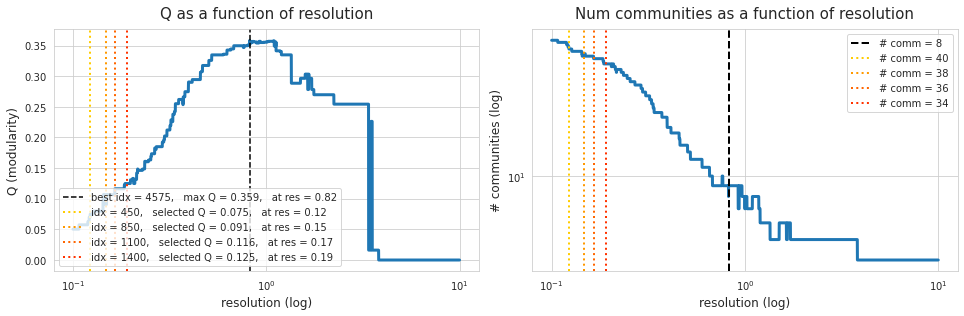

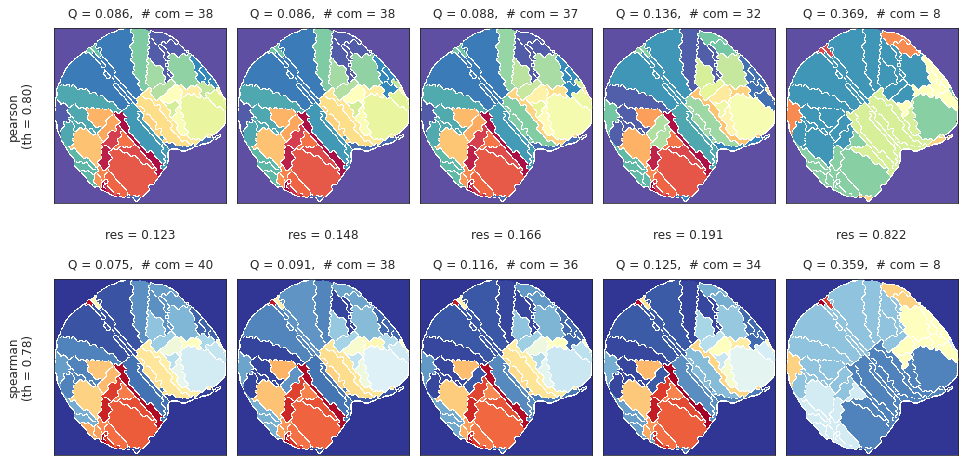

In [50]:
selected_idxs = [450, 850, 1100, 1400]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

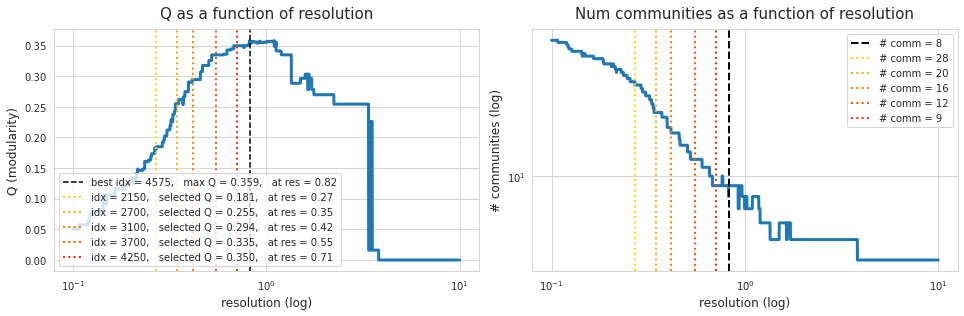

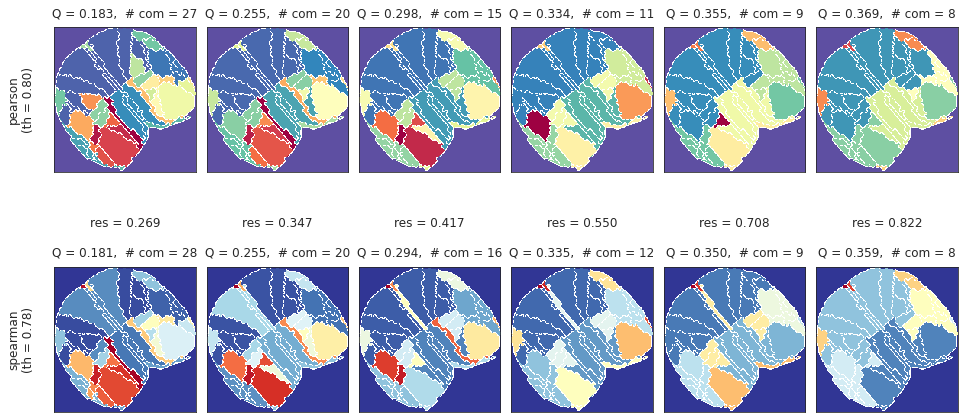

In [51]:
selected_idxs = [2150, 2700, 3100, 3700, 4250]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

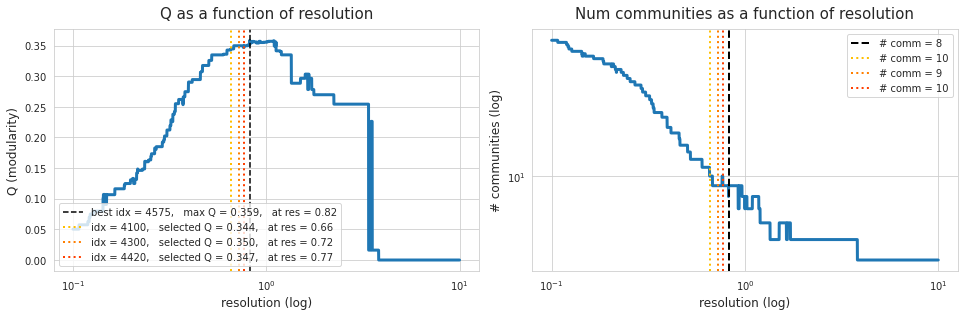

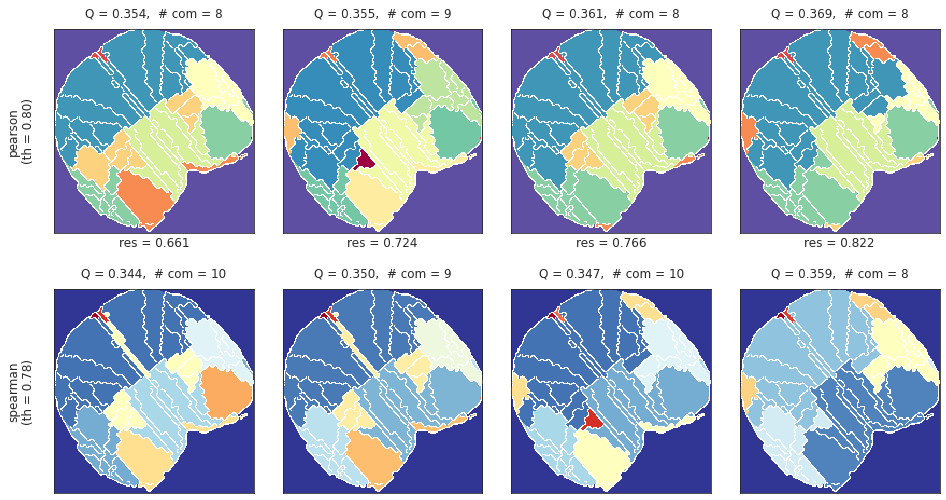

In [52]:
selected_idxs = [4100, 4300, 4420]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

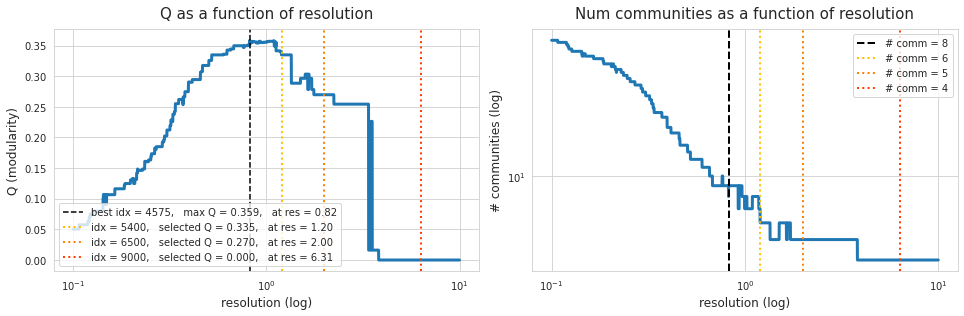

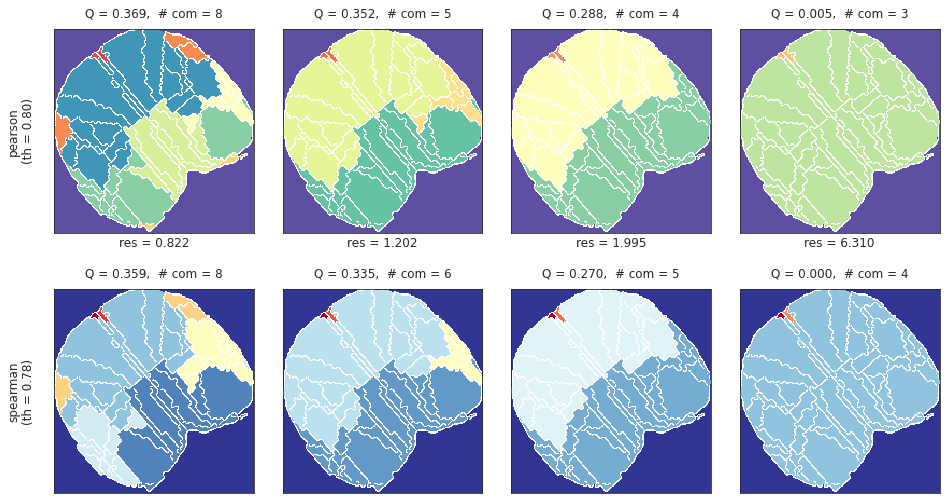

In [53]:
selected_idxs = [5400, 6500, 9000]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

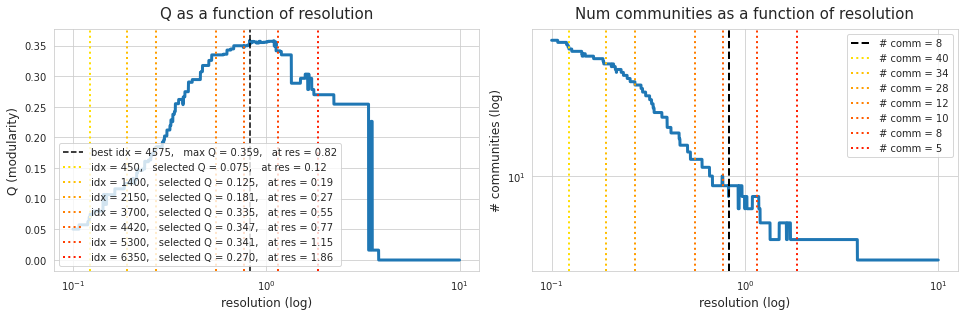

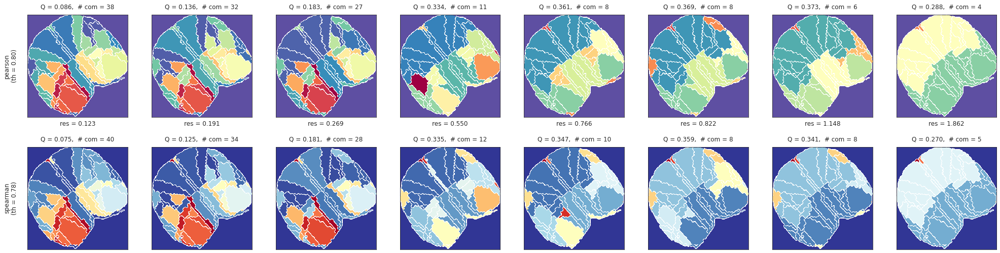

In [54]:
selected_idxs = [450, 1400, 2150, 3700, 4420, 5300, 6350]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(28, 7),
    colorbar=False, )

#### Leiden

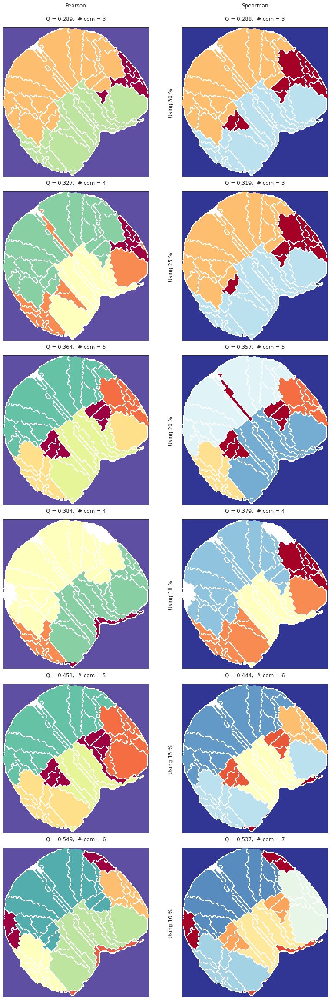

In [55]:
_ = plot_leiden_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    figsize=(12, 32),
    colorbar=False,
)

## Effect of bandpassing on weight distribution

In [284]:
num_regions = len(atls_org['regions'])
order = 2

n = 40
lowcut = np.linspace(0.0, 4, n+1)
lowcut = [item + 1e-3 for item in lowcut]
highcut = [item + 4/n for item in lowcut]

dict_list = []

for (l, h) in tqdm(zip(lowcut, highcut), total=n+1):
    df = pd.DataFrame()
    for run in [1, 3, 5, 7]:
        _load = load_organized_data(
            folder='atlas-allen_unfiltered_unnormalized',
            config=config,
            subject=subject,
            session=session,
            run=run,
        )

        # bandpass
        ca_bp = {
            k: apply_bandpass(
                x=v,
                fs=config.ca_fs,
                lowcut=l,
                highcut=h,
                order=order,
            ) for k, v in _load['ca'].items()
        }

        # normalize
        mean = np.mean([item.mean() for item in ca_bp.values()])
        sd = np.mean([item.std() for item in ca_bp.values()])
        ca_bp_n = {k: (v - mean) / sd for k, v in ca_bp.items()}
        df = pd.concat([df, pd.DataFrame.from_dict(ca_bp_n)])

    corrs = get_corrs(df, thresholds=[])
    w = np.concatenate((corrs['pearson_corr'].flatten(), corrs['spearman_corr'].flatten()))
    data_dict = {
        'tag': ['bp'] * 2 * num_regions ** 2,
        'l': [np.round(l, decimals=3)] * 2 * num_regions ** 2,
        'h': [np.round(h, decimals=3)] * 2 * num_regions ** 2,
        'lbl': ['pearson'] * num_regions ** 2 + ['spearman'] * num_regions ** 2,
        'w': w,
    }
    dict_list.append(data_dict)

results = pd.DataFrame.from_dict(merge_dicts(dict_list))
results.w = results.w.replace({0.0 :np.nan})

  0%|          | 0/41 [00:00<?, ?it/s]

...merging dicts: 0it [00:00, ?it/s]

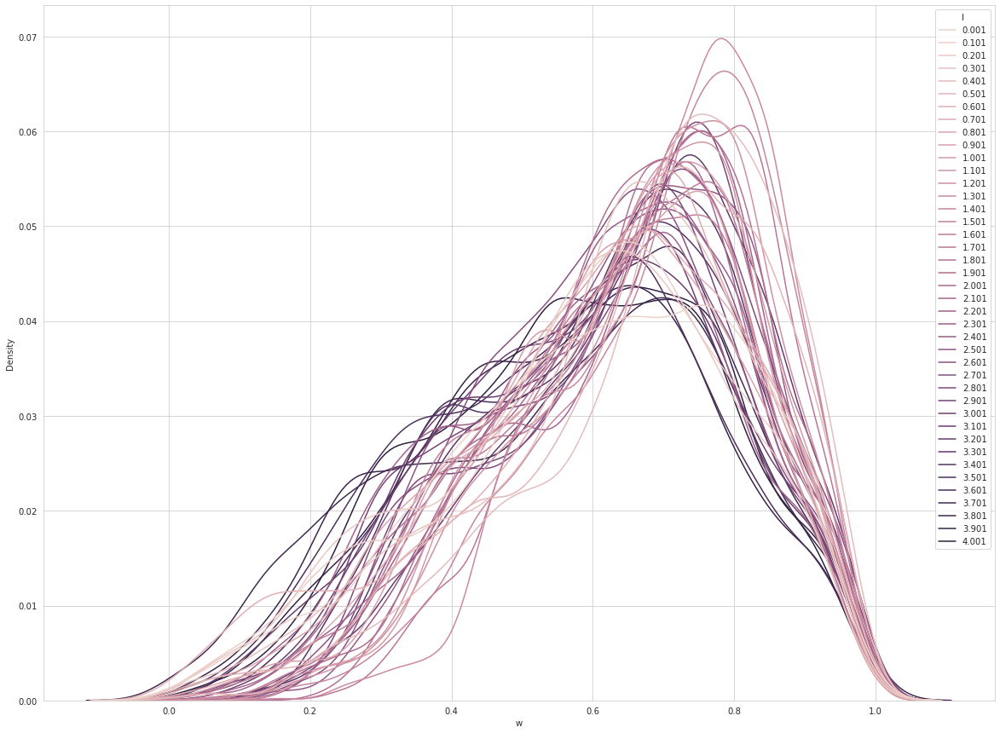

In [285]:
sns.set_style('whitegrid')
plt.figure(figsize=(20, 15))

selected_df = results.loc[results.lbl == 'spearman']
sns.kdeplot(data=results, x='w', hue='l', alpha=0.7)
plt.show()

In [303]:
# HIDE CODE


num_regions = len(atls_org['regions'])
order = 2

n = 8
lowcut = np.linspace(0.0, 4, n+1)
highcut = [item + 4/n for item in lowcut]
lowcut = [item + 1e-3 for item in lowcut]

dict_list = []

for (l, h) in tqdm(zip(lowcut, highcut), total=n+1):
    df = pd.DataFrame()
    for run in [1, 3, 5, 7]:
        _load = load_organized_data(
            folder='atlas-allen_unfiltered_unnormalized',
            config=config,
            subject=subject,
            session=session,
            run=run,
        )

        # bandpass
        ca_bp = {
            k: apply_bandpass(
                x=v,
                fs=config.ca_fs,
                lowcut=l,
                highcut=h,
                order=order,
            ) for k, v in _load['ca'].items()
        }

        # normalize
        mean = np.mean([item.mean() for item in ca_bp.values()])
        sd = np.mean([item.std() for item in ca_bp.values()])
        ca_bp_n = {k: (v - mean) / sd for k, v in ca_bp.items()}
        df = pd.concat([df, pd.DataFrame.from_dict(ca_bp_n)])

    corrs = get_corrs(df, thresholds=[])
    w = np.concatenate((corrs['pearson_corr'].flatten(), corrs['spearman_corr'].flatten()))
    data_dict = {
        'tag': ['bp'] * 2 * num_regions ** 2,
        'l': [np.round(l, decimals=3)] * 2 * num_regions ** 2,
        'h': [np.round(h, decimals=3)] * 2 * num_regions ** 2,
        'lbl': ['pearson'] * num_regions ** 2 + ['spearman'] * num_regions ** 2,
        'w': w,
    }
    dict_list.append(data_dict)

results = pd.DataFrame.from_dict(merge_dicts(dict_list))
results.w = results.w.replace({0.0 :np.nan})

  0%|          | 0/9 [00:00<?, ?it/s]

...merging dicts: 0it [00:00, ?it/s]

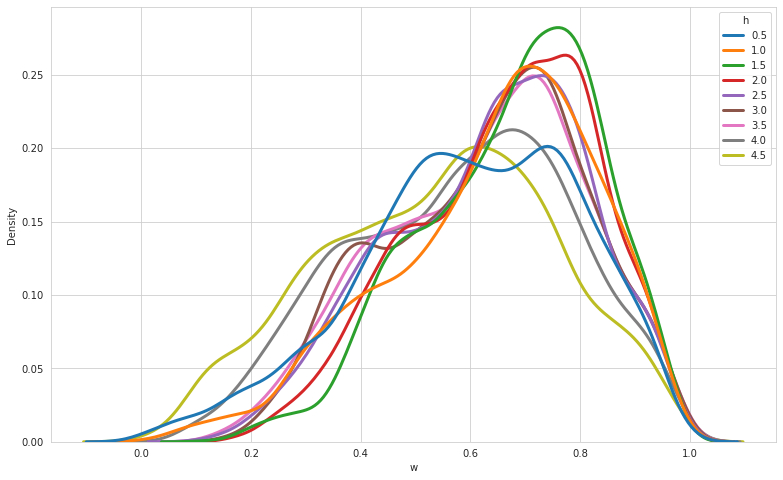

In [307]:
sns.set_style('whitegrid')
plt.figure(figsize=(13, 8))

palette = sns.color_palette('tab10', n_colors=n+1)
selected_df = results.loc[results.lbl == 'spearman']
sns.kdeplot(data=results, x='w', hue='h', palette=palette, lw=3, alpha=0.6)
plt.show()

### Combine data across sessions (subject = 6)

In [22]:
subject = 6
run = 1
regions = {}
tot_num_regions = {}
for session in range(1, config.num_sessions+1):
    _load = load_organized_data(
        folder='atlas-allen_unfiltered_unnormalized',
        config=config,
        subject=subject,
        session=session,
        run=run,
    )
    if _load is None:
        continue
    _atlsorg = organize_atlas(_load)
    key = 'sub-SLC{:02d}_ses-{:d}'.format(subject, session)
    regions[key] = _atlsorg['regions']
    tot_num_regions[key] = len(_atlsorg['regions'])

common_regions = list(set.intersection(*[set(reg_dict.keys()) for reg_dict in regions.values()]))
len(common_regions)

59

In [23]:
tot_num_regions

{'sub-SLC06_ses-1': 61, 'sub-SLC06_ses-2': 62, 'sub-SLC06_ses-3': 60}

In [24]:
# HIDE CODE


num_regions = len(common_regions)
order = 2

bands = [
    (0.001, 1.), (0.001, 2.), (0.001, 3.), (0.001, 4.),
    (0.01, 1.), (0.01, 2.), (0.01, 3.), (0.01, 4.),
    (0.1, 1.), (0.1, 2.), (0.1, 3.), (0.1, 4.),
    (None, None),
]

dict_list = []

for (l, h) in tqdm(bands):
    df = pd.DataFrame()
    for session in range(1, config.num_sessions+1):
        for run in [1, 3, 5, 7]:
            cond_1 = subject == 3 and session == 2 and run in [2, 6]
            cond_2 = subject == 7 and session == 2 and run in [2, 7]
            if cond_1 or cond_2:
                continue

            _load = load_organized_data(
                folder='atlas-allen_unfiltered_unnormalized',
                config=config,
                subject=subject,
                session=session,
                run=run,
            )
            if _load is None:
                continue

            for k, v in _load['ca'].items():
                if np.isnan(v).sum():
                    print(session, run, k)

            # bandpass
            if l is None or h is None:
                ca_bp = {k: v for k, v in _load['ca'].items()}
            else:
                ca_bp = {
                    k: apply_bandpass(
                        x=v,
                        fs=config.ca_fs,
                        lowcut=l,
                        highcut=h,
                        order=order, )
                    for k, v in _load['ca'].items()
                }

            # normalize
            mean = np.mean([item.mean() for item in ca_bp.values()])
            sd = np.mean([item.std() for item in ca_bp.values()])
            ca_bp_n = {k: (v - mean) / sd for k, v in ca_bp.items()}
            df = pd.concat([df, pd.DataFrame.from_dict(ca_bp_n)])

    corrs = get_corrs(df.loc[:, common_regions], thresholds=[])
    w = np.concatenate((corrs['pearson_corr'].flatten(), corrs['spearman_corr'].flatten()))
    if l is not None and h is not None:
        data_dict = {
            'tag': ['bp'] * 2 * num_regions ** 2,
            'band': ['{:.3f}-{:.3f}'.format(l, h)] * 2 * num_regions ** 2,
            'lbl': ['pearson'] * num_regions ** 2 + ['spearman'] * num_regions ** 2,
            'w': w,
        }
    else:
        data_dict = {
            'tag': ['raw'] * 2 * num_regions ** 2,
            'band': ['no-bp'] * 2 * num_regions ** 2,
            'lbl': ['pearson'] * num_regions ** 2 + ['spearman'] * num_regions ** 2,
            'w': w,
        }
    dict_list.append(data_dict)

results = pd.DataFrame.from_dict(merge_dicts(dict_list))
results.w = results.w.replace({0.0 :np.nan})

  0%|          | 0/13 [00:00<?, ?it/s]

...merging dicts: 0it [00:00, ?it/s]

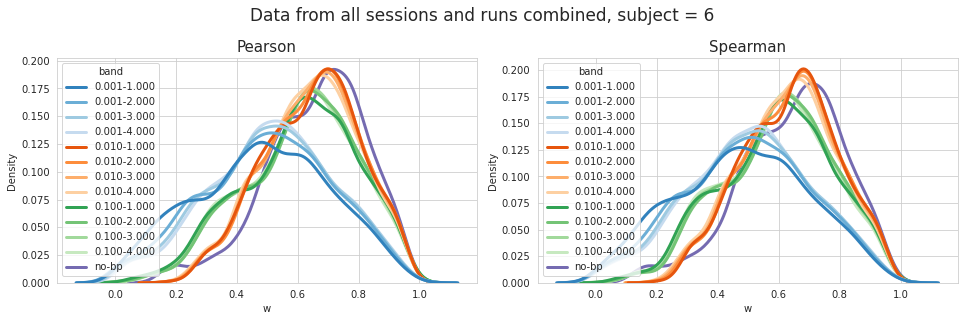

In [26]:
sns.set_style('whitegrid')
palette = sns.color_palette('tab20c', n_colors=len(bands))

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(13.5, 4.5))

selected_df = results.loc[results.lbl == 'pearson']
sns.kdeplot(data=selected_df, x='w', hue='band', palette=palette, lw=3, alpha=0.6, ax=ax0)
ax0.set_title('Pearson', fontsize=15)

selected_df = results.loc[results.lbl == 'spearman']
sns.kdeplot(data=selected_df, x='w', hue='band', palette=palette, lw=3, alpha=0.6, ax=ax1)
ax1.set_title('Spearman', fontsize=15)

fig.suptitle('Data from all sessions and runs combined, subject = {:d}'.format(subject), fontsize=17)
fig.tight_layout()
plt.show()

### Combine all data

In [28]:
run = 1
regions = {}
tot_num_regions = {}
for subject in range(1, config.num_subjects+1):
    for session in range(1, config.num_sessions+1):
        _load = load_organized_data(
            folder='atlas-allen_unfiltered_unnormalized',
            config=config,
            subject=subject,
            session=session,
            run=run,
        )
        if _load is None:
            continue
        _atlsorg = organize_atlas(_load)
        key = 'sub-SLC{:02d}_ses-{:d}'.format(subject, session)
        regions[key] = _atlsorg['regions']
        tot_num_regions[key] = len(_atlsorg['regions'])

common_regions = list(set.intersection(*[set(reg_dict.keys()) for reg_dict in regions.values()]))
len(common_regions)

46

In [29]:
tot_num_regions

{'sub-SLC01_ses-1': 66,
 'sub-SLC01_ses-2': 64,
 'sub-SLC01_ses-3': 59,
 'sub-SLC02_ses-1': 57,
 'sub-SLC02_ses-2': 69,
 'sub-SLC02_ses-3': 61,
 'sub-SLC03_ses-2': 66,
 'sub-SLC03_ses-3': 61,
 'sub-SLC04_ses-1': 60,
 'sub-SLC04_ses-2': 55,
 'sub-SLC04_ses-3': 55,
 'sub-SLC05_ses-1': 57,
 'sub-SLC05_ses-2': 63,
 'sub-SLC05_ses-3': 59,
 'sub-SLC06_ses-1': 61,
 'sub-SLC06_ses-2': 62,
 'sub-SLC06_ses-3': 60,
 'sub-SLC07_ses-1': 65,
 'sub-SLC07_ses-2': 66,
 'sub-SLC07_ses-3': 59,
 'sub-SLC08_ses-1': 63,
 'sub-SLC08_ses-2': 61,
 'sub-SLC08_ses-3': 53,
 'sub-SLC09_ses-1': 56,
 'sub-SLC09_ses-2': 53,
 'sub-SLC09_ses-3': 64,
 'sub-SLC10_ses-1': 61,
 'sub-SLC10_ses-2': 60}

In [30]:
np.argmax(list(tot_num_regions.values()))

4

In [31]:
list(tot_num_regions.items())[4]

('sub-SLC02_ses-2', 69)

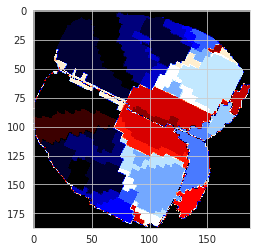

In [32]:
plt.imshow(
    load_organized_data(
            folder='atlas-allen_unfiltered_unnormalized',
            config=config,
            subject=2,
            session=2,
            run=1,
    )['atlas'], cmap='flag_r',
)

In [33]:
np.argmin(list(tot_num_regions.values()))

22

In [34]:
list(tot_num_regions.items())[22]

('sub-SLC08_ses-3', 53)

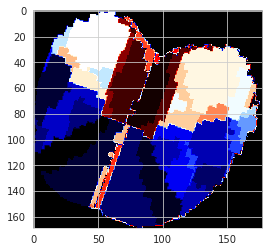

In [35]:
plt.imshow(
    load_organized_data(
            folder='atlas-allen_unfiltered_unnormalized',
            config=config,
            subject=8,
            session=3,
            run=1,
    )['atlas'], cmap='flag_r',
)

In [36]:
# HIDE CODE


num_regions = len(common_regions)
order = 2

bands = [
    (0.001, 1.), (0.001, 2.), (0.001, 3.), (0.001, 4.),
    (0.01, 1.), (0.01, 2.), (0.01, 3.), (0.01, 4.),
    (0.1, 1.), (0.1, 2.), (0.1, 3.), (0.1, 4.),
    (None, None),
]

dict_list = []

for (l, h) in tqdm(bands):
    df = pd.DataFrame()
    df_n = pd.DataFrame()
    for subject in range(1, config.num_subjects+1):
        for session in range(1, config.num_sessions+1):
            for run in [1, 3, 5, 7]:
                cond_1 = subject == 3 and session == 2 and run in [2, 6]
                cond_2 = subject == 7 and session == 2 and run in [2, 7]
                if cond_1 or cond_2:
                    continue
    
                _load = load_organized_data(
                    folder='atlas-allen_unfiltered_unnormalized',
                    config=config,
                    subject=subject,
                    session=session,
                    run=run,
                )
                if _load is None:
                    continue

                for k, v in _load['ca'].items():
                    if np.isnan(v).sum():
                        print(session, run, k)

                # bandpass
                if l is None or h is None:
                    ca_bp = {k: v for k, v in _load['ca'].items()}
                else:
                    ca_bp = {
                        k: apply_bandpass(
                            x=v,
                            fs=config.ca_fs,
                            lowcut=l,
                            highcut=h,
                            order=order, )
                        for k, v in _load['ca'].items()
                    }

                # normalize
                mean = np.mean([item.mean() for item in ca_bp.values()])
                sd = np.mean([item.std() for item in ca_bp.values()])
                ca_bp_n = {k: (v - mean) / sd for k, v in ca_bp.items()}
                
                # put in df
                df = pd.concat([df, pd.DataFrame.from_dict(ca_bp)])
                df_n = pd.concat([df_n, pd.DataFrame.from_dict(ca_bp_n)])

    corrs = get_corrs(df.loc[:, common_regions], thresholds=[])
    corrs_n = get_corrs(df_n.loc[:, common_regions], thresholds=[])
    w = np.concatenate((corrs['pearson_corr'].flatten(), corrs['spearman_corr'].flatten()))
    w_n = np.concatenate((corrs_n['pearson_corr'].flatten(), corrs_n['spearman_corr'].flatten()))
    if l is None and h is None:
        tag = 'raw'
        band_str = 'no-bp'
    else:
        tag = 'bp'
        band_str = '{:.3f}-{:.3f}'.format(l, h)

    data_dict = {
        'tag': [tag] * 2 * num_regions ** 2,
        'band': [band_str] * 2 * num_regions ** 2,
        'normalized': ['False'] * 2 * num_regions ** 2,
        'lbl': ['pearson'] * num_regions ** 2 + ['spearman'] * num_regions ** 2,
        'w': w,
    }
    dict_list.append(data_dict)

    data_dict = {
        'tag': [tag] * 2 * num_regions ** 2,
        'band': [band_str] * 2 * num_regions ** 2,
        'normalized': ['True'] * 2 * num_regions ** 2,
        'lbl': ['pearson'] * num_regions ** 2 + ['spearman'] * num_regions ** 2,
        'w': w_n,
    }
    dict_list.append(data_dict)

results = pd.DataFrame.from_dict(merge_dicts(dict_list))
results.w = results.w.replace({0.0 :np.nan})

  0%|          | 0/13 [00:00<?, ?it/s]

...merging dicts: 0it [00:00, ?it/s]

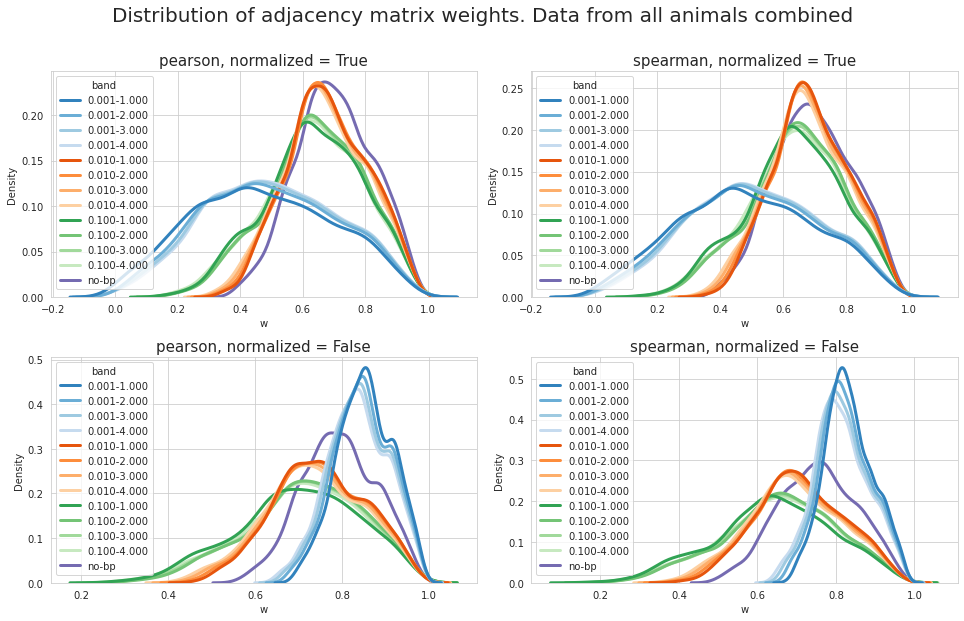

In [70]:
sns.set_style('whitegrid')
palette = sns.color_palette('tab20c', n_colors=len(bands))
fig, axes = plt.subplots(2, 2, figsize=(13.5, 8.5))

for i in range(2):
    for j in range(2):
        normalized = True if i == 0 else False
        corr_type = 'pearson' if j == 0 else 'spearman'

        selected_df = results.loc[(results.lbl == corr_type) & (results.normalized == str(normalized))]
        sns.kdeplot(data=selected_df, x='w', hue='band', palette=palette, lw=3, alpha=0.5, ax=axes[i, j])
        axes[i, j].set_title('{:s}, normalized = {}'.format(corr_type, normalized), fontsize=15)

fig.suptitle('Distribution of adjacency matrix weights. Data from all animals combined', fontsize=20, y=1.01)
fig.tight_layout()
plt.show()

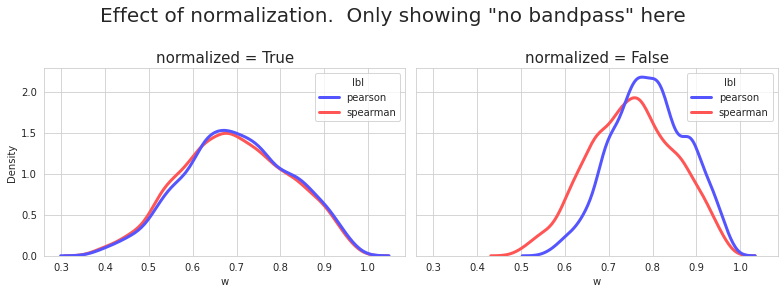

In [87]:
sns.set_style('whitegrid')
palette = sns.color_palette('seismic', n_colors=2)
fig, axes = plt.subplots(1, 2, figsize=(11, 4), sharex='all', sharey='all')

for i in range(2):
    normalized = True if i == 0 else False
    selected_df = results.loc[(results.band == 'no-bp') & (results.normalized == str(normalized))]
    sns.kdeplot(data=selected_df, x='w', palette=palette, hue='lbl', lw=3, alpha=0.5, ax=axes[i])
    axes[i].set_title('normalized = {}'.format(normalized), fontsize=15)

fig.suptitle('Effect of normalization.  Only showing "no bandpass" here', fontsize=20, y=1.01)
fig.tight_layout()
plt.show()

## Community structure (using all data combined)

### No bandpass

In [57]:
# HIDE CODE


lowcut = None
highcut = None

df = pd.DataFrame()
df_n = pd.DataFrame()

for subject in tqdm(range(1, config.num_subjects+1)):
    for session in range(1, config.num_sessions+1):
        for run in [1, 3, 5, 7]:
            cond_1 = subject == 3 and session == 2 and run in [2, 6]
            cond_2 = subject == 7 and session == 2 and run in [2, 7]
            if cond_1 or cond_2:
                continue

            _load = load_organized_data(
                folder='atlas-allen_unfiltered_unnormalized',
                config=config,
                subject=subject,
                session=session,
                run=run,
            )
            if _load is None:
                continue

            for k, v in _load['ca'].items():
                if np.isnan(v).sum():
                    print(session, run, k)

            # bandpass
            if lowcut is None or highcut is None:
                ca_bp = {k: v for k, v in _load['ca'].items()}
            else:
                ca_bp = {
                    k: apply_bandpass(
                        x=v,
                        fs=config.ca_fs,
                        lowcut=lowcut,
                        highcut=highcut,
                        order=order, )
                    for k, v in _load['ca'].items()
                }

            # normalize
            mean = np.mean([item.mean() for item in ca_bp.values()])
            sd = np.mean([item.std() for item in ca_bp.values()])
            ca_bp_n = {k: (v - mean) / sd for k, v in ca_bp.items()}

            # put in df
            df = pd.concat([df, pd.DataFrame.from_dict(ca_bp)])
            df_n = pd.concat([df_n, pd.DataFrame.from_dict(ca_bp_n)])

  0%|          | 0/10 [00:00<?, ?it/s]

In [59]:
run = 1
regions = {}
tot_num_regions = {}
for subject in range(1, config.num_subjects+1):
    for session in range(1, config.num_sessions+1):
        _load = load_organized_data(
            folder='atlas-allen_unfiltered_unnormalized',
            config=config,
            subject=subject,
            session=session,
            run=run,
        )
        if _load is None:
            continue
        _atlsorg = organize_atlas(_load)
        key = 'sub-SLC{:02d}_ses-{:d}'.format(subject, session)
        regions[key] = _atlsorg['regions']
        tot_num_regions[key] = len(_atlsorg['regions'])

common_regions = list(set.intersection(*[set(reg_dict.keys()) for reg_dict in regions.values()]))
len(common_regions)

46

In [60]:
df = df.loc[:, common_regions]
df_n = df_n.loc[:, common_regions]

node_labels = df.columns.values.tolist()
node_labels = {i: lbl for i, lbl in enumerate(node_labels)}

In [62]:
percentiles = [30, 25, 20, 18, 15, 10]

corrs = get_corrs(df, percentiles=percentiles)
corrs_n = get_corrs(df_n, percentiles=percentiles)

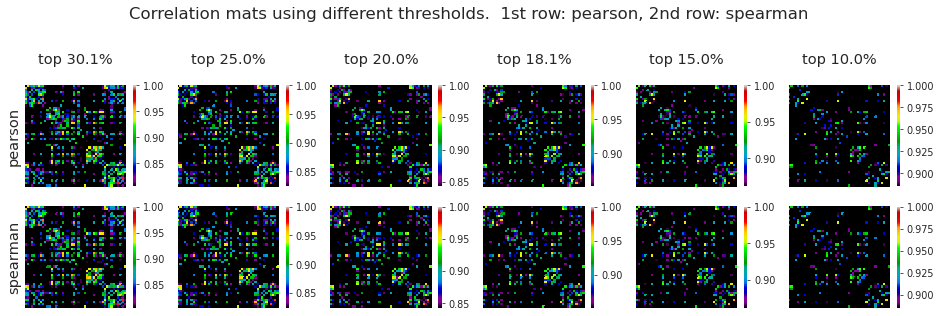

In [63]:
_ = plot_corrs(corrs['pearson'], corrs['spearman'])

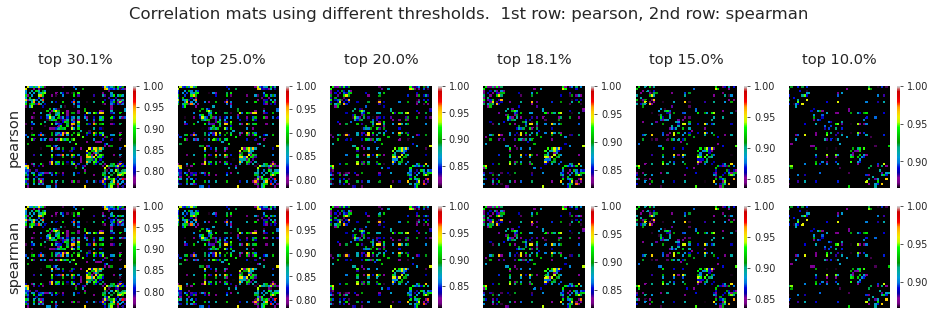

In [64]:
_ = plot_corrs(corrs_n['pearson'], corrs_n['spearman'])

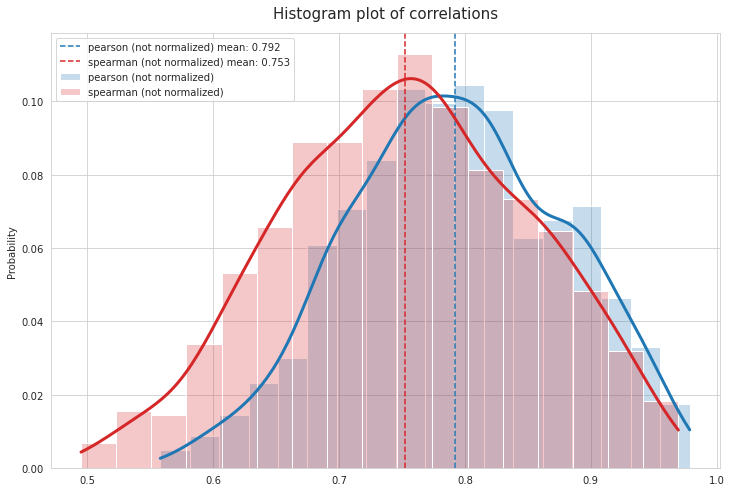

In [65]:
_ = plot_corr_hist(
    corr_list=[corrs['pearson_corr'], corrs['spearman_corr']],
    labels=['pearson (not normalized)', 'spearman (not normalized)'],
    colors=['C0', 'C3'],
)

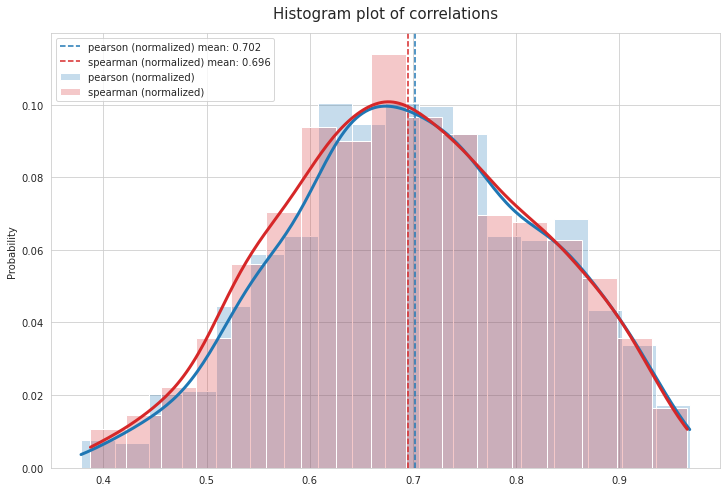

In [66]:
_ = plot_corr_hist(
    corr_list=[corrs_n['pearson_corr'], corrs_n['spearman_corr']],
    labels=['pearson (normalized)', 'spearman (normalized)'],
    colors=['C0', 'C3'],
)

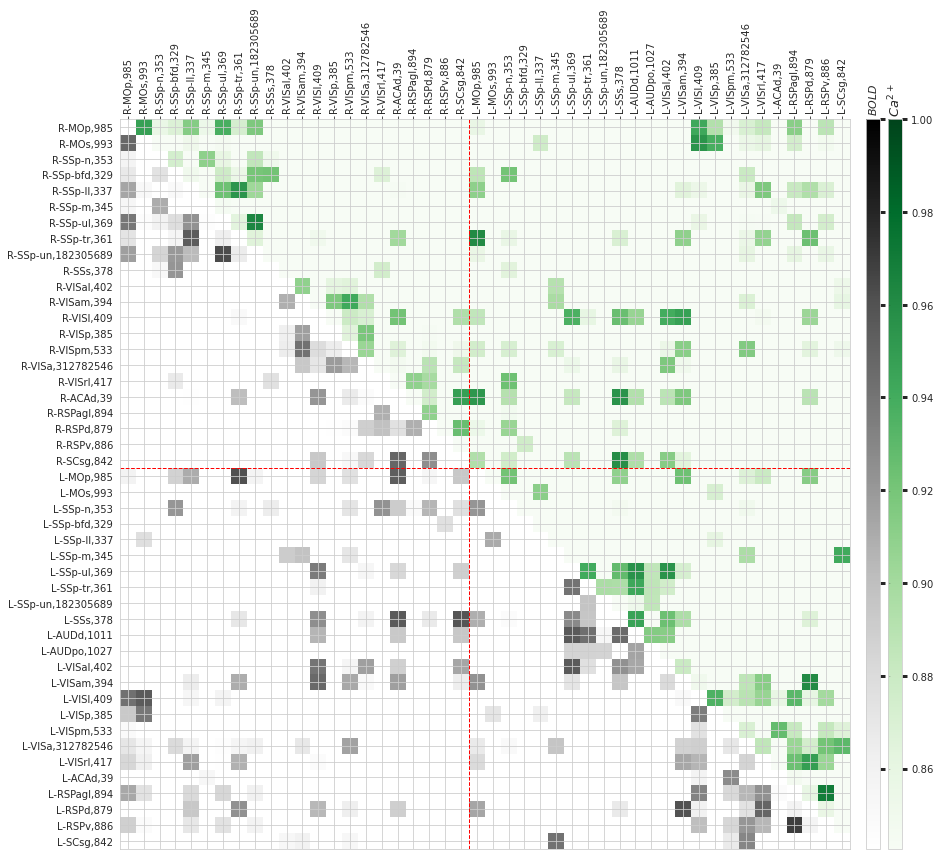

In [67]:
perc = 20
data1 = corrs['spearman'][perc].copy()
data2 = corrs['spearman'][perc].copy()

regions_filtered = {k: v for k, v in atls_org['regions'].items() if k in common_regions}

lower = np.tril_indices(len(regions_filtered))
upper = np.triu_indices(len(regions_filtered))

data1[lower] = np.nan
data2[upper] = np.nan

ticks = []
for i, (region_id, label) in enumerate(regions_filtered.items()):
    prefix = label[:2]
    label_short = label.split('(')[1].split(')')[0].strip()
    tick = ''.join([prefix, label_short])
    ticks.append((i, tick))
ticks, tick_labels = zip(*ticks)
boundary_idx = [i[0] != j[0] for i, j in zip(tick_labels, tick_labels[1:])].index(True)

sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(16, 12))

im1 = ax.imshow(data1, cmap='Greens', vmin=np.min(data1[data1 > 0]), vmax=1)
im2 = ax.imshow(data2, cmap='Greys', vmin=np.min(data2[data2 > 0]), vmax=1)

ax.xaxis.tick_top()
ax.set_xticks(ticks)
ax.set_xticklabels(tick_labels, fontsize=10, rotation=90)
ax.set_yticks(ticks)
ax.set_yticklabels(tick_labels, fontsize=10, rotation=0)
ax.xaxis.set_label_position('top')

cax1 = fig.colorbar(im1, aspect=50, ax=ax, pad=-0.126)
cax2 = fig.colorbar(im2, aspect=50, pad=0.015)
cax1.ax.tick_params(labelsize=10, length=5, width=3)
cax2.ax.tick_params(labelsize=0, length=5, width=3)
# cax1.ax.set_xlabel('$Ca^{2+}$', fontsize=18, rotation=-90)
# cax2.ax.set_xlabel('$BOLD$', fontsize=16, rotation=-90)
cax1.ax.set_title('$Ca^{2+}$', fontsize=13, rotation=90)
cax2.ax.set_title('$BOLD$', fontsize=11, rotation=90)

ax.axhline(boundary_idx + 0.5, color='r', ls='--', lw=1)
ax.axvline(boundary_idx + 0.5, color='r', ls='--', lw=1)

fig.tight_layout()
# fig.savefig('rsFC_perc{:d}.pdf'.format(perc), dpi=600)
plt.show()

In [74]:
graphs = {perc: nx.from_numpy_matrix(a) for perc, a in corrs['pearson'].items()}
graphs_n = {perc: nx.from_numpy_matrix(a) for perc, a in corrs_n['pearson'].items()}

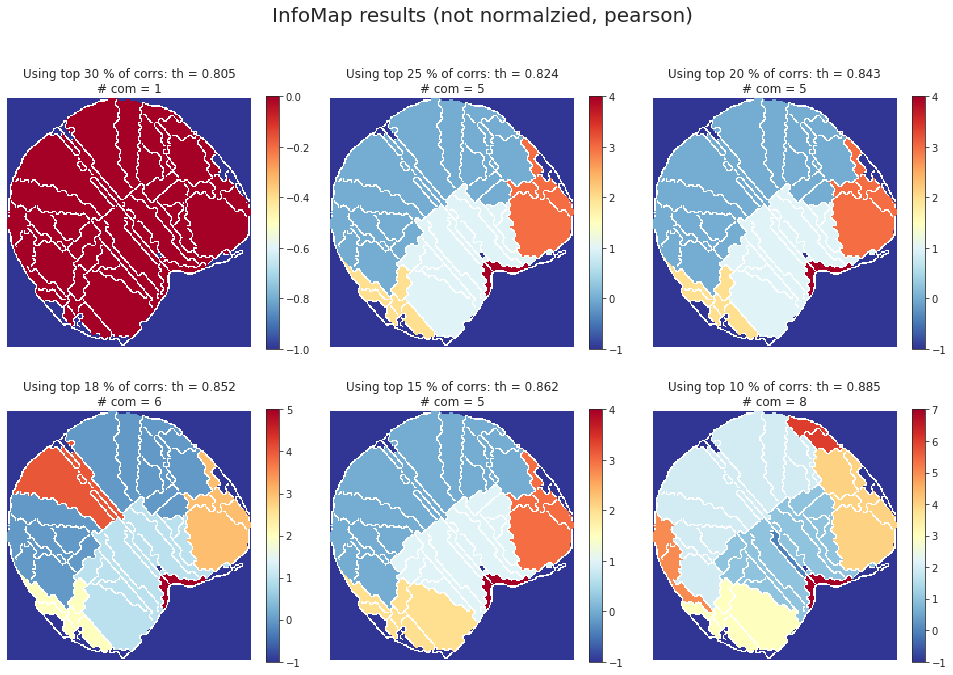

In [75]:
sns.set_style('white')
nrows, ncols = 2, len(graphs)//2
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 9.5))

for idx, (perc, g) in enumerate(graphs.items()):
    infomap_coms = cdlib_algorithms.infomap(g)
    infomap_community = infomap_coms.communities
    infomap_partition = convert('community', 'partition', community=infomap_community)
    output = filter_islands(infomap_partition, load['atlas'], node_labels, min_com_size=0)
    msg = 'Using top {:d} {:s} of corrs: th = {:.3f}\n# com = {:d}'
    msg = msg.format(
        perc, '%', np.min(corrs['spearman'][perc][corrs['spearman'][perc] > 0]),
        len(np.unique(output['comm_mat'][output['comm_mat']>-1])),
    )
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(
        np.ma.masked_where(atls_org['contour'], output['comm_mat']), cmap='RdYlBu_r', interpolation='none')
    axes[i, j].set_title(msg, fontsize=12)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], shrink=0.8)

sup = fig.suptitle('InfoMap results (not normalzied, pearson)', fontsize=20, y=1.02)
fig.tight_layout()    
plt.show()

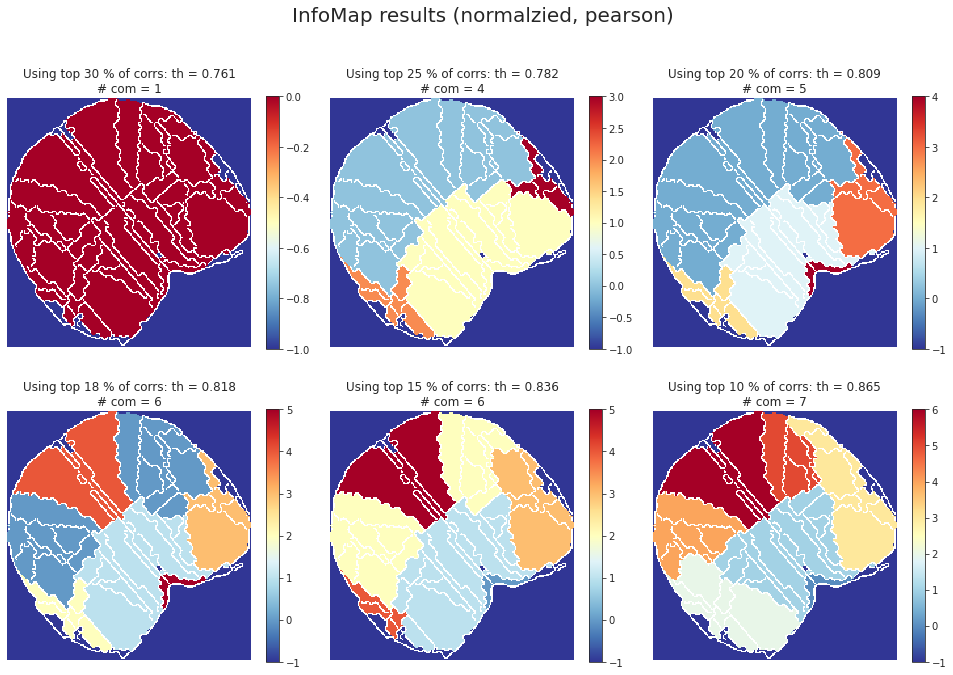

In [76]:
sns.set_style('white')
nrows, ncols = 2, len(graphs)//2
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 9.5))

for idx, (perc, g) in enumerate(graphs_n.items()):
    infomap_coms = cdlib_algorithms.infomap(g)
    infomap_community = infomap_coms.communities
    infomap_partition = convert('community', 'partition', community=infomap_community)
    output = filter_islands(infomap_partition, load['atlas'], node_labels, min_com_size=0)
    msg = 'Using top {:d} {:s} of corrs: th = {:.3f}\n# com = {:d}'
    msg = msg.format(
        perc, '%', np.min(corrs_n['spearman'][perc][corrs_n['spearman'][perc] > 0]),
        len(np.unique(output['comm_mat'][output['comm_mat']>-1])),
    )
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(
        np.ma.masked_where(atls_org['contour'], output['comm_mat']), cmap='RdYlBu_r', interpolation='none')
    axes[i, j].set_title(msg, fontsize=12)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], shrink=0.8)

sup = fig.suptitle('InfoMap results (normalzied, pearson)', fontsize=20, y=1.02)
fig.tight_layout()    
plt.show()

In [77]:
graphs = {perc: nx.from_numpy_matrix(a) for perc, a in corrs['spearman'].items()}
graphs_n = {perc: nx.from_numpy_matrix(a) for perc, a in corrs_n['spearman'].items()}

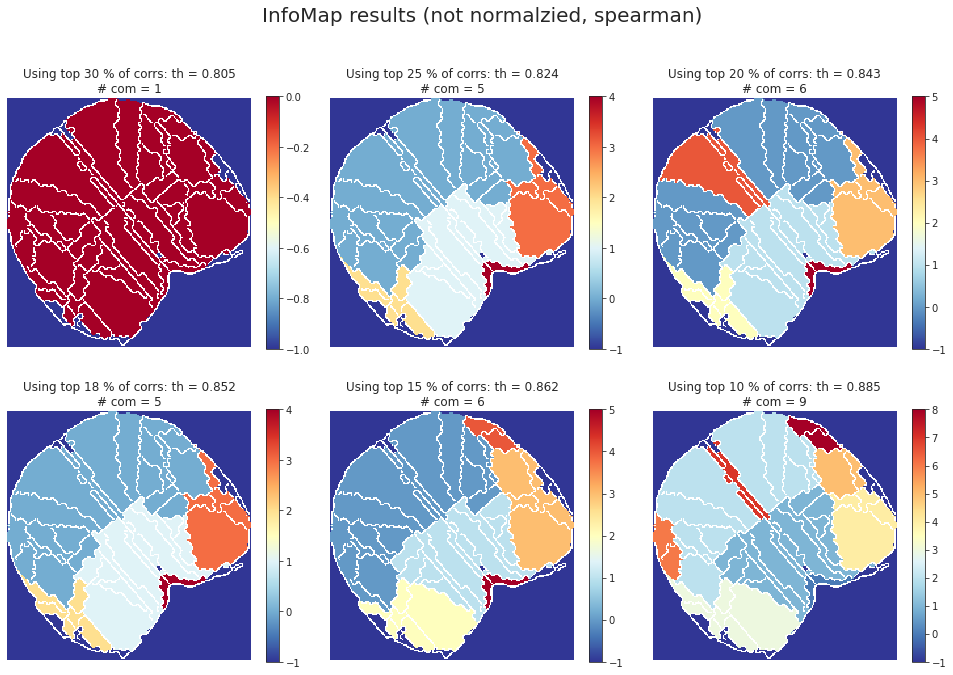

In [78]:
sns.set_style('white')
nrows, ncols = 2, len(graphs)//2
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 9.5))

for idx, (perc, g) in enumerate(graphs.items()):
    infomap_coms = cdlib_algorithms.infomap(g)
    infomap_community = infomap_coms.communities
    infomap_partition = convert('community', 'partition', community=infomap_community)
    output = filter_islands(infomap_partition, load['atlas'], node_labels, min_com_size=0)
    msg = 'Using top {:d} {:s} of corrs: th = {:.3f}\n# com = {:d}'
    msg = msg.format(
        perc, '%', np.min(corrs['spearman'][perc][corrs['spearman'][perc] > 0]),
        len(np.unique(output['comm_mat'][output['comm_mat']>-1])),
    )
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(
        np.ma.masked_where(atls_org['contour'], output['comm_mat']), cmap='RdYlBu_r', interpolation='none')
    axes[i, j].set_title(msg, fontsize=12)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], shrink=0.8)

sup = fig.suptitle('InfoMap results (not normalzied, spearman)', fontsize=20, y=1.02)
fig.tight_layout()    
plt.show()

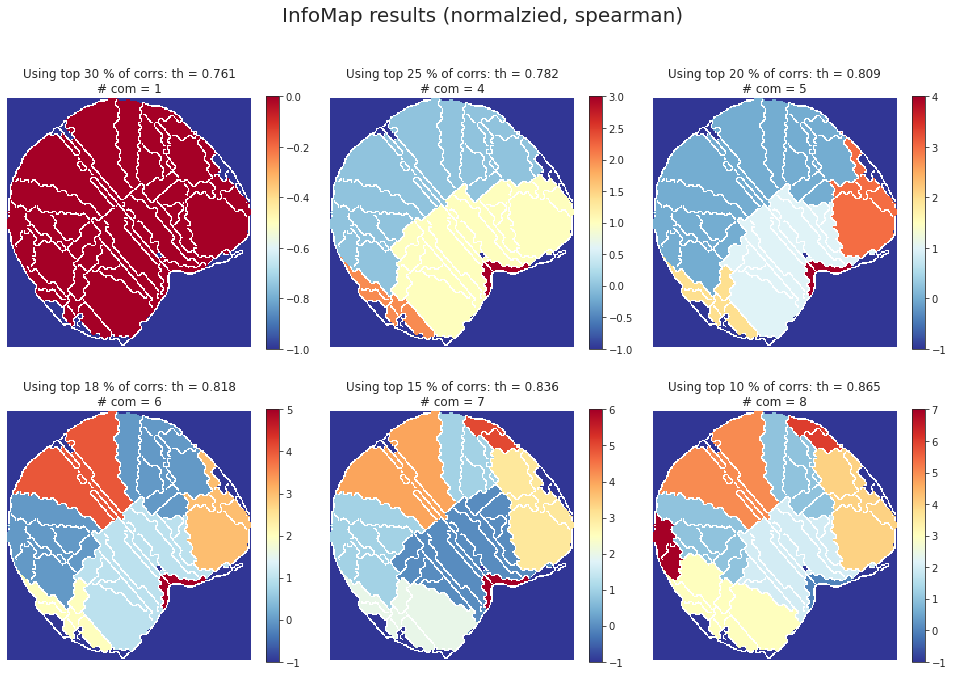

In [79]:
sns.set_style('white')
nrows, ncols = 2, len(graphs)//2
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 9.5))

for idx, (perc, g) in enumerate(graphs_n.items()):
    infomap_coms = cdlib_algorithms.infomap(g)
    infomap_community = infomap_coms.communities
    infomap_partition = convert('community', 'partition', community=infomap_community)
    output = filter_islands(infomap_partition, load['atlas'], node_labels, min_com_size=0)
    msg = 'Using top {:d} {:s} of corrs: th = {:.3f}\n# com = {:d}'
    msg = msg.format(
        perc, '%', np.min(corrs_n['spearman'][perc][corrs_n['spearman'][perc] > 0]),
        len(np.unique(output['comm_mat'][output['comm_mat']>-1])),
    )
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(
        np.ma.masked_where(atls_org['contour'], output['comm_mat']), cmap='RdYlBu_r', interpolation='none')
    axes[i, j].set_title(msg, fontsize=12)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], shrink=0.8)

sup = fig.suptitle('InfoMap results (normalzied, spearman)', fontsize=20, y=1.02)
fig.tight_layout()    
plt.show()

In [80]:
results_louvain = run_louvain(graphs_n[20], res=np.logspace(-1, 1, 10001))

  0%|          | 0/10001 [00:00<?, ?it/s]

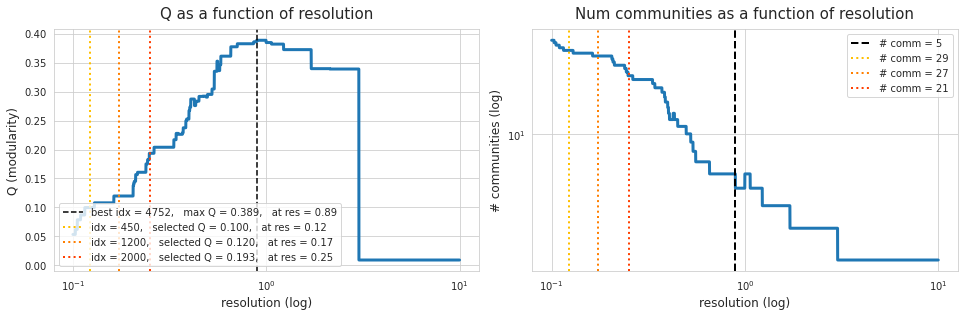

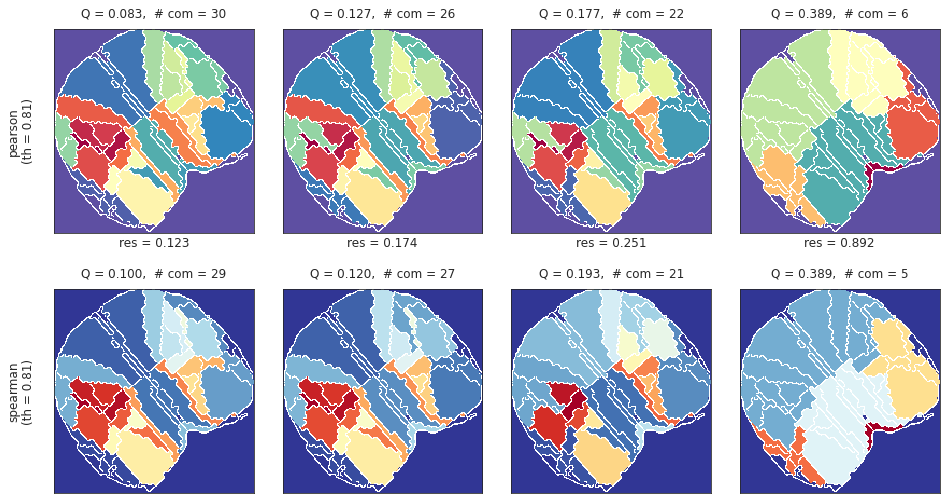

In [85]:
selected_idxs = [450, 1200, 2000]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs_n['pearson'],
    spearman=corrs_n['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

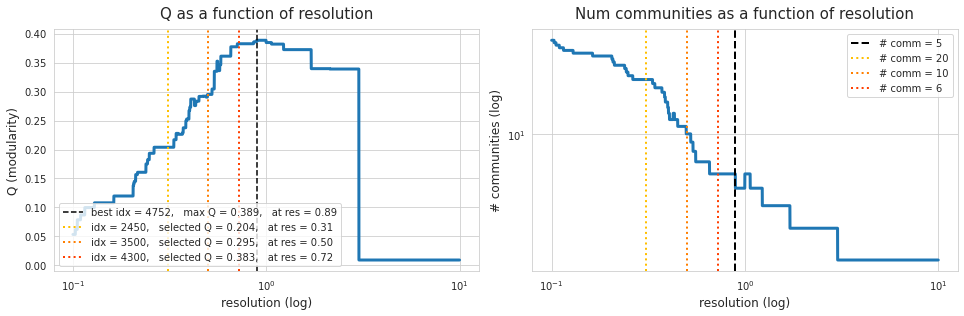

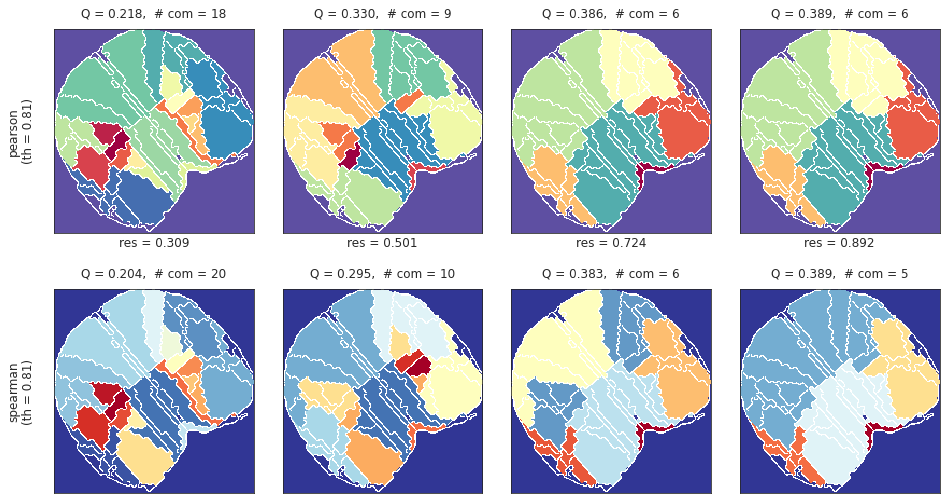

In [86]:
selected_idxs = [2450, 3500, 4300]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs_n['pearson'],
    spearman=corrs_n['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

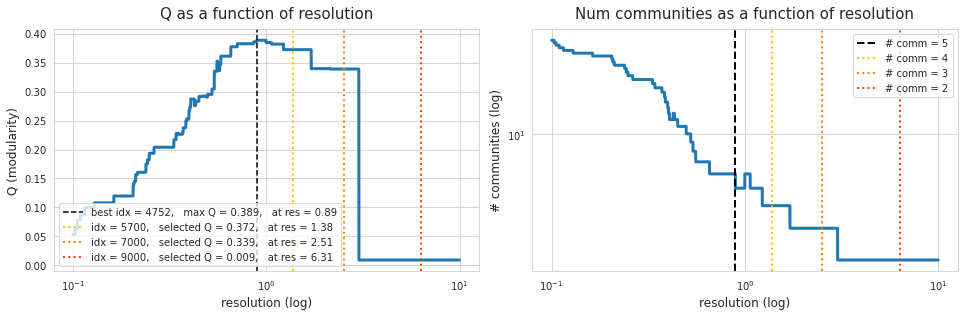

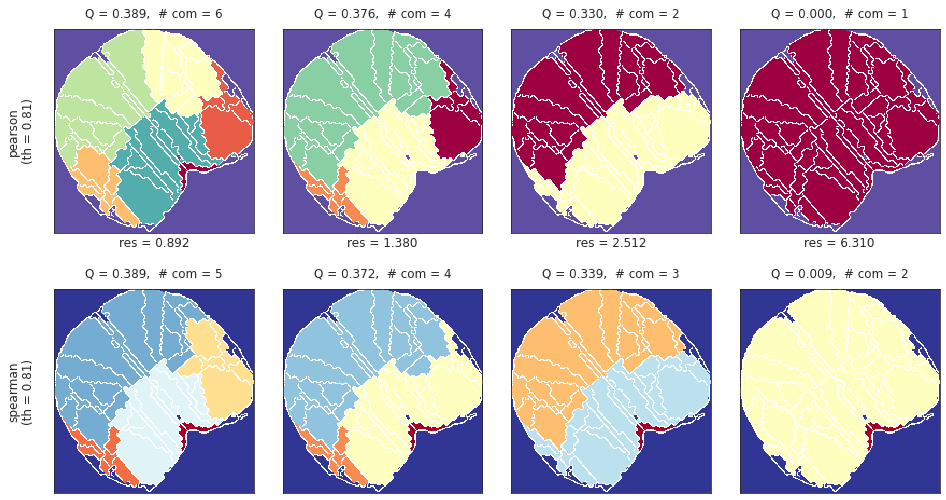

In [87]:
selected_idxs = [5700, 7000, 9000]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs_n['pearson'],
    spearman=corrs_n['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

#### Leiden

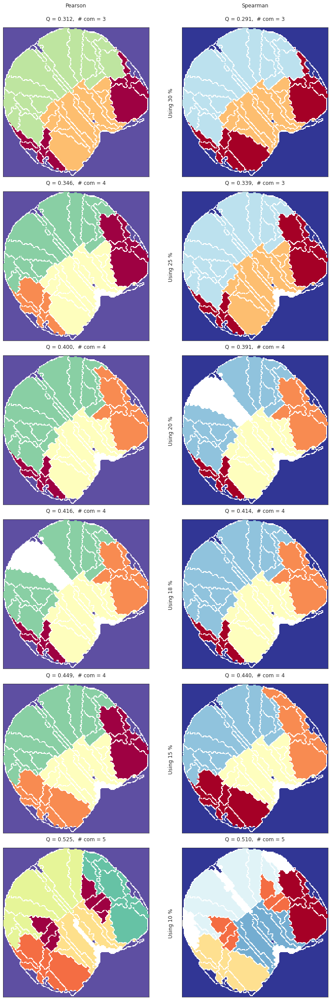

In [88]:
_ = plot_leiden_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    figsize=(12, 32),
    colorbar=False,
)

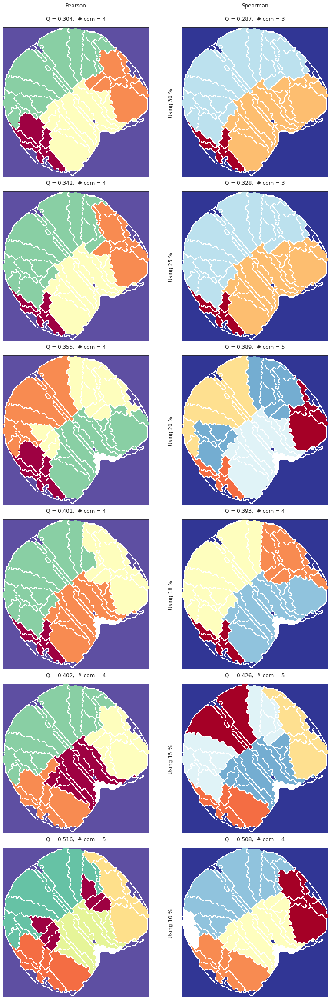

In [89]:
_ = plot_leiden_communities(
    pearson=corrs_n['pearson'],
    spearman=corrs_n['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    figsize=(12, 32),
    colorbar=False,
)

### Same, but with bandpass

In [134]:
# HIDE CODE


lowcut = 0.001
highcut = 4.000

df = pd.DataFrame()
df_n = pd.DataFrame()

for subject in tqdm(range(1, config.num_subjects+1)):
    for session in range(1, config.num_sessions+1):
        for run in [1, 3, 5, 7]:
            cond_1 = subject == 3 and session == 2 and run in [2, 6]
            cond_2 = subject == 7 and session == 2 and run in [2, 7]
            if cond_1 or cond_2:
                continue

            _load = load_organized_data(
                folder='atlas-allen_unfiltered_unnormalized',
                config=config,
                subject=subject,
                session=session,
                run=run,
            )
            if _load is None:
                continue

            for k, v in _load['ca'].items():
                if np.isnan(v).sum():
                    print(session, run, k)

            # bandpass
            if lowcut is None or highcut is None:
                ca_bp = {k: v for k, v in _load['ca'].items()}
            else:
                ca_bp = {
                    k: apply_bandpass(
                        x=v,
                        fs=config.ca_fs,
                        lowcut=lowcut,
                        highcut=highcut,
                        order=order, )
                    for k, v in _load['ca'].items()
                }

            # normalize
            mean = np.mean([item.mean() for item in ca_bp.values()])
            sd = np.mean([item.std() for item in ca_bp.values()])
            ca_bp_n = {k: (v - mean) / sd for k, v in ca_bp.items()}

            # put in df
            df = pd.concat([df, pd.DataFrame.from_dict(ca_bp)])
            df_n = pd.concat([df_n, pd.DataFrame.from_dict(ca_bp_n)])

  0%|          | 0/10 [00:00<?, ?it/s]

In [135]:
run = 1
regions = {}
tot_num_regions = {}
for subject in range(1, config.num_subjects+1):
    for session in range(1, config.num_sessions+1):
        _load = load_organized_data(
            folder='atlas-allen_unfiltered_unnormalized',
            config=config,
            subject=subject,
            session=session,
            run=run,
        )
        if _load is None:
            continue
        _atlsorg = organize_atlas(_load)
        key = 'sub-SLC{:02d}_ses-{:d}'.format(subject, session)
        regions[key] = _atlsorg['regions']
        tot_num_regions[key] = len(_atlsorg['regions'])

common_regions = list(set.intersection(*[set(reg_dict.keys()) for reg_dict in regions.values()]))
len(common_regions)

46

In [136]:
df = df.loc[:, common_regions]
df_n = df_n.loc[:, common_regions]

node_labels = df.columns.values.tolist()
node_labels = {i: lbl for i, lbl in enumerate(node_labels)}

In [137]:
percentiles = [30, 25, 20, 18, 15, 10]

corrs = get_corrs(df, percentiles=percentiles)
corrs_n = get_corrs(df_n, percentiles=percentiles)

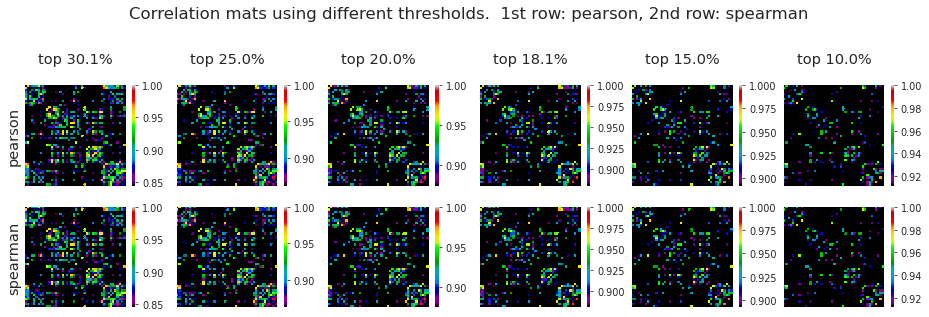

In [138]:
_ = plot_corrs(corrs['pearson'], corrs['spearman'])

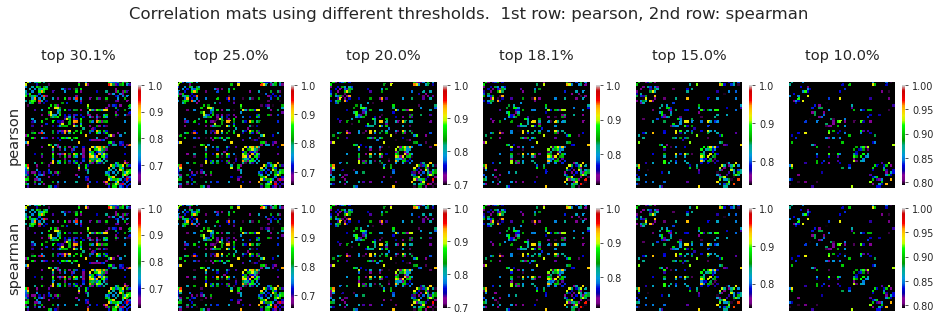

In [139]:
_ = plot_corrs(corrs_n['pearson'], corrs_n['spearman'])

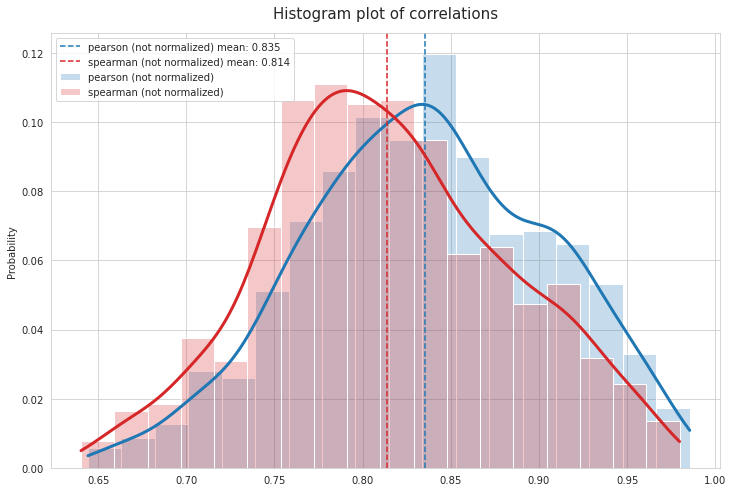

In [140]:
_ = plot_corr_hist(
    corr_list=[corrs['pearson_corr'], corrs['spearman_corr']],
    labels=['pearson (not normalized)', 'spearman (not normalized)'],
    colors=['C0', 'C3'],
)

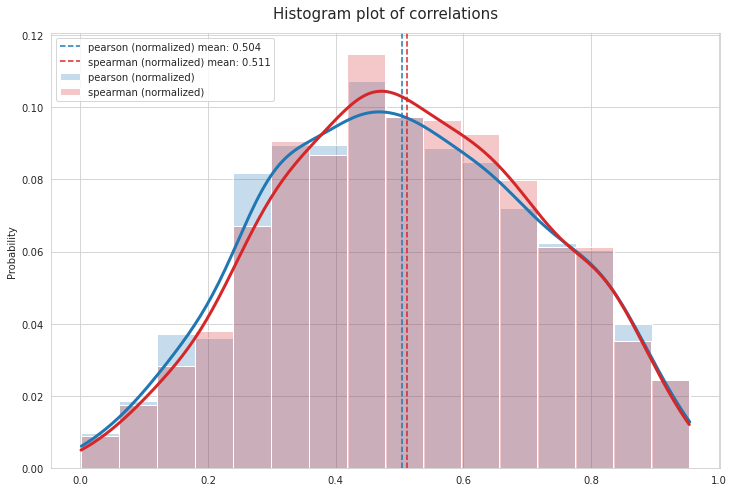

In [141]:
_ = plot_corr_hist(
    corr_list=[corrs_n['pearson_corr'], corrs_n['spearman_corr']],
    labels=['pearson (normalized)', 'spearman (normalized)'],
    colors=['C0', 'C3'],
)

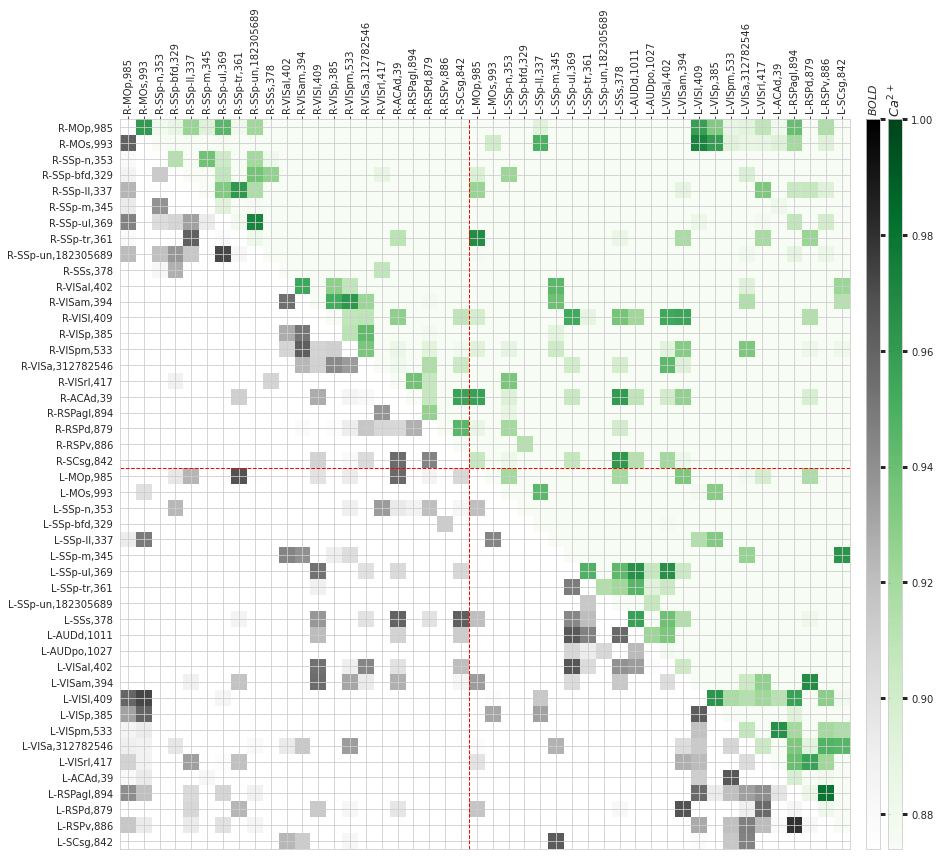

In [142]:
perc = 20
data1 = corrs['spearman'][perc].copy()
data2 = corrs['spearman'][perc].copy()

regions_filtered = {k: v for k, v in atls_org['regions'].items() if k in common_regions}

lower = np.tril_indices(len(regions_filtered))
upper = np.triu_indices(len(regions_filtered))

data1[lower] = np.nan
data2[upper] = np.nan

ticks = []
for i, (region_id, label) in enumerate(regions_filtered.items()):
    prefix = label[:2]
    label_short = label.split('(')[1].split(')')[0].strip()
    tick = ''.join([prefix, label_short])
    ticks.append((i, tick))
ticks, tick_labels = zip(*ticks)
boundary_idx = [i[0] != j[0] for i, j in zip(tick_labels, tick_labels[1:])].index(True)

sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(16, 12))

im1 = ax.imshow(data1, cmap='Greens', vmin=np.min(data1[data1 > 0]), vmax=1)
im2 = ax.imshow(data2, cmap='Greys', vmin=np.min(data2[data2 > 0]), vmax=1)

ax.xaxis.tick_top()
ax.set_xticks(ticks)
ax.set_xticklabels(tick_labels, fontsize=10, rotation=90)
ax.set_yticks(ticks)
ax.set_yticklabels(tick_labels, fontsize=10, rotation=0)
ax.xaxis.set_label_position('top')

cax1 = fig.colorbar(im1, aspect=50, ax=ax, pad=-0.126)
cax2 = fig.colorbar(im2, aspect=50, pad=0.015)
cax1.ax.tick_params(labelsize=10, length=5, width=3)
cax2.ax.tick_params(labelsize=0, length=5, width=3)
# cax1.ax.set_xlabel('$Ca^{2+}$', fontsize=18, rotation=-90)
# cax2.ax.set_xlabel('$BOLD$', fontsize=16, rotation=-90)
cax1.ax.set_title('$Ca^{2+}$', fontsize=13, rotation=90)
cax2.ax.set_title('$BOLD$', fontsize=11, rotation=90)

ax.axhline(boundary_idx + 0.5, color='r', ls='--', lw=1)
ax.axvline(boundary_idx + 0.5, color='r', ls='--', lw=1)

fig.tight_layout()
# fig.savefig('rsFC_perc{:d}.pdf'.format(perc), dpi=600)
plt.show()

In [143]:
graphs = {perc: nx.from_numpy_matrix(a) for perc, a in corrs['pearson'].items()}
graphs_n = {perc: nx.from_numpy_matrix(a) for perc, a in corrs_n['pearson'].items()}

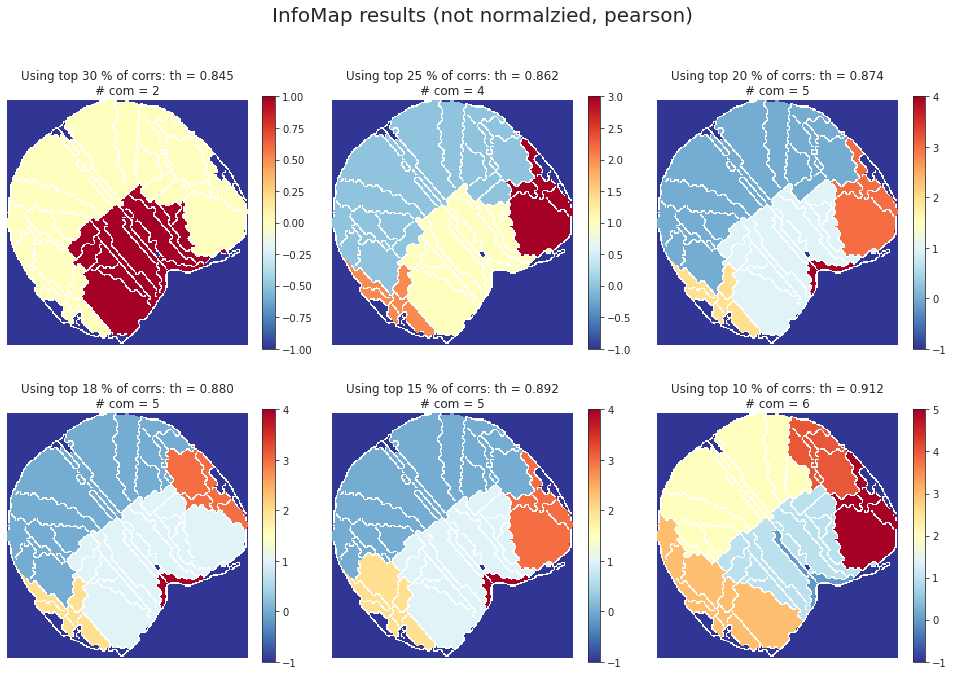

In [144]:
sns.set_style('white')
nrows, ncols = 2, len(graphs)//2
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 9.5))

for idx, (perc, g) in enumerate(graphs.items()):
    infomap_coms = cdlib_algorithms.infomap(g)
    infomap_community = infomap_coms.communities
    infomap_partition = convert('community', 'partition', community=infomap_community)
    output = filter_islands(infomap_partition, load['atlas'], node_labels, min_com_size=0)
    msg = 'Using top {:d} {:s} of corrs: th = {:.3f}\n# com = {:d}'
    msg = msg.format(
        perc, '%', np.min(corrs['spearman'][perc][corrs['spearman'][perc] > 0]),
        len(np.unique(output['comm_mat'][output['comm_mat']>-1])),
    )
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(
        np.ma.masked_where(atls_org['contour'], output['comm_mat']), cmap='RdYlBu_r', interpolation='none')
    axes[i, j].set_title(msg, fontsize=12)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], shrink=0.8)

sup = fig.suptitle('InfoMap results (not normalzied, pearson)', fontsize=20, y=1.02)
fig.tight_layout()    
plt.show()

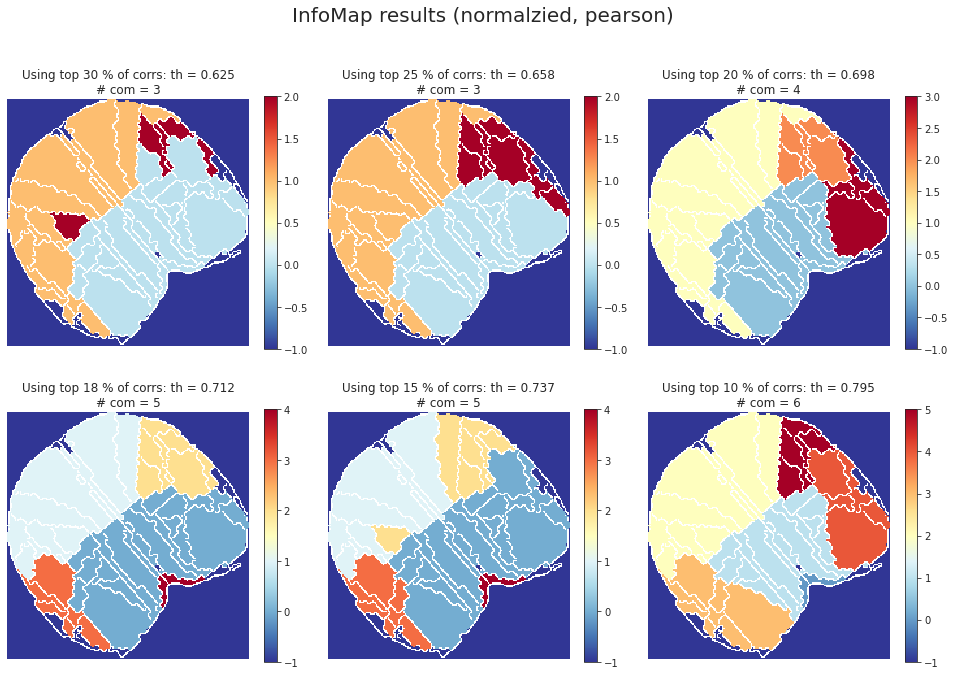

In [145]:
sns.set_style('white')
nrows, ncols = 2, len(graphs)//2
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 9.5))

for idx, (perc, g) in enumerate(graphs_n.items()):
    infomap_coms = cdlib_algorithms.infomap(g)
    infomap_community = infomap_coms.communities
    infomap_partition = convert('community', 'partition', community=infomap_community)
    output = filter_islands(infomap_partition, load['atlas'], node_labels, min_com_size=0)
    msg = 'Using top {:d} {:s} of corrs: th = {:.3f}\n# com = {:d}'
    msg = msg.format(
        perc, '%', np.min(corrs_n['spearman'][perc][corrs_n['spearman'][perc] > 0]),
        len(np.unique(output['comm_mat'][output['comm_mat']>-1])),
    )
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(
        np.ma.masked_where(atls_org['contour'], output['comm_mat']), cmap='RdYlBu_r', interpolation='none')
    axes[i, j].set_title(msg, fontsize=12)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], shrink=0.8)

sup = fig.suptitle('InfoMap results (normalzied, pearson)', fontsize=20, y=1.02)
fig.tight_layout()    
plt.show()

In [146]:
graphs = {perc: nx.from_numpy_matrix(a) for perc, a in corrs['spearman'].items()}
graphs_n = {perc: nx.from_numpy_matrix(a) for perc, a in corrs_n['spearman'].items()}

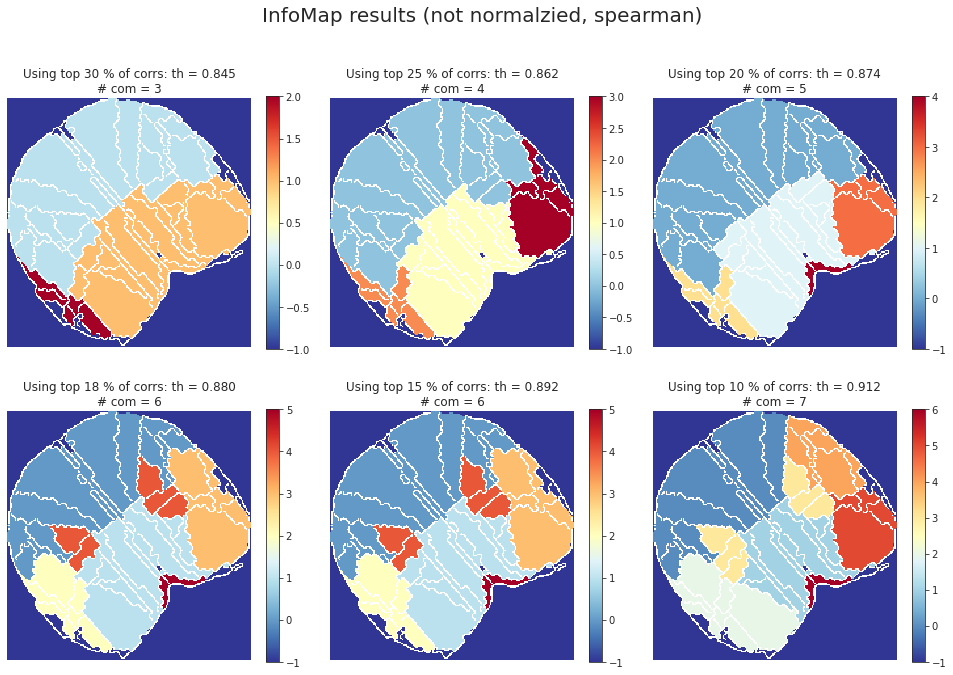

In [147]:
sns.set_style('white')
nrows, ncols = 2, len(graphs)//2
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 9.5))

for idx, (perc, g) in enumerate(graphs.items()):
    infomap_coms = cdlib_algorithms.infomap(g)
    infomap_community = infomap_coms.communities
    infomap_partition = convert('community', 'partition', community=infomap_community)
    output = filter_islands(infomap_partition, load['atlas'], node_labels, min_com_size=0)
    msg = 'Using top {:d} {:s} of corrs: th = {:.3f}\n# com = {:d}'
    msg = msg.format(
        perc, '%', np.min(corrs['spearman'][perc][corrs['spearman'][perc] > 0]),
        len(np.unique(output['comm_mat'][output['comm_mat']>-1])),
    )
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(
        np.ma.masked_where(atls_org['contour'], output['comm_mat']), cmap='RdYlBu_r', interpolation='none')
    axes[i, j].set_title(msg, fontsize=12)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], shrink=0.8)

sup = fig.suptitle('InfoMap results (not normalzied, spearman)', fontsize=20, y=1.02)
fig.tight_layout()    
plt.show()

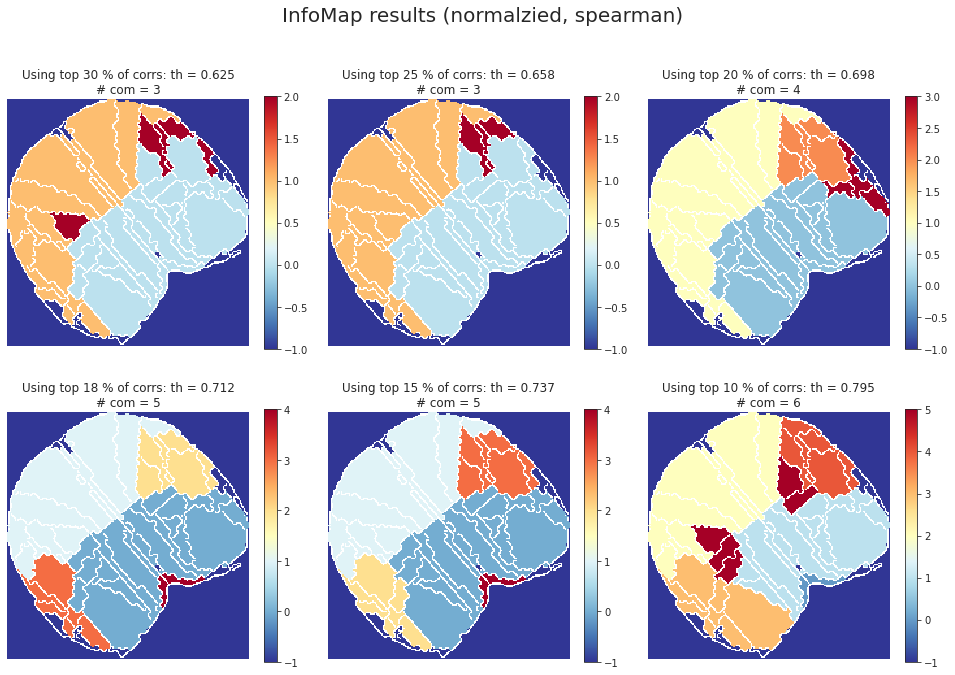

In [148]:
sns.set_style('white')
nrows, ncols = 2, len(graphs)//2
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 9.5))

for idx, (perc, g) in enumerate(graphs_n.items()):
    infomap_coms = cdlib_algorithms.infomap(g)
    infomap_community = infomap_coms.communities
    infomap_partition = convert('community', 'partition', community=infomap_community)
    output = filter_islands(infomap_partition, load['atlas'], node_labels, min_com_size=0)
    msg = 'Using top {:d} {:s} of corrs: th = {:.3f}\n# com = {:d}'
    msg = msg.format(
        perc, '%', np.min(corrs_n['spearman'][perc][corrs_n['spearman'][perc] > 0]),
        len(np.unique(output['comm_mat'][output['comm_mat']>-1])),
    )
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(
        np.ma.masked_where(atls_org['contour'], output['comm_mat']), cmap='RdYlBu_r', interpolation='none')
    axes[i, j].set_title(msg, fontsize=12)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], shrink=0.8)

sup = fig.suptitle('InfoMap results (normalzied, spearman)', fontsize=20, y=1.02)
fig.tight_layout()    
plt.show()

In [149]:
results_louvain = run_louvain(graphs_n[20], res=np.logspace(-1, 1, 10001))

  0%|          | 0/10001 [00:00<?, ?it/s]

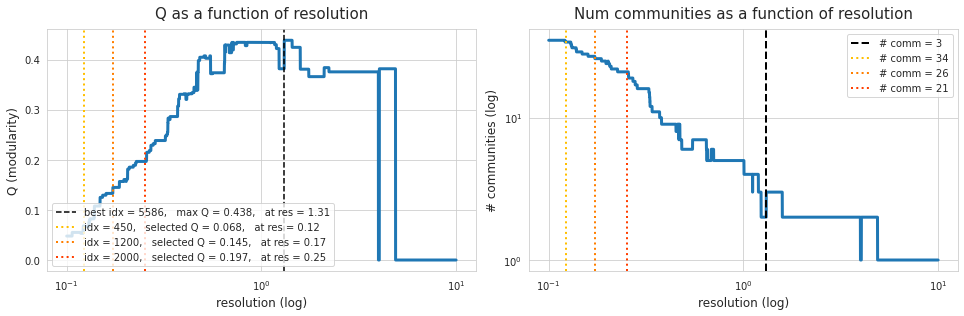

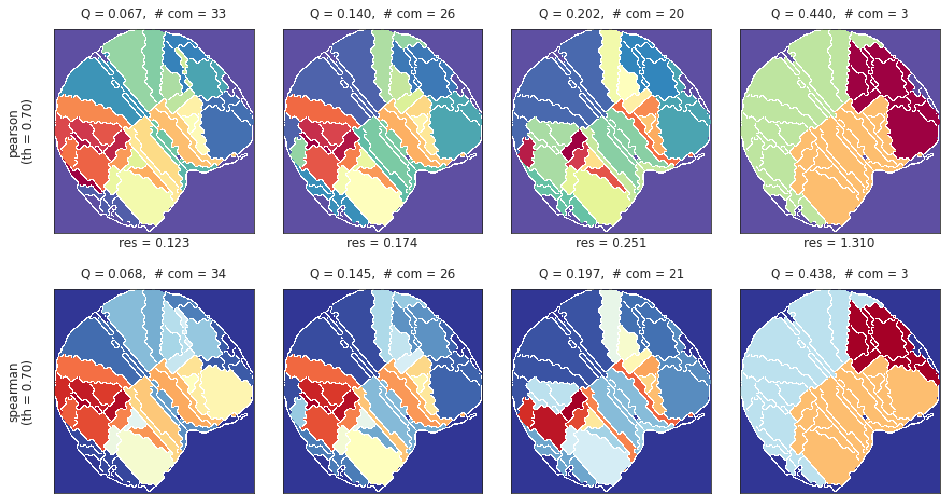

In [150]:
selected_idxs = [450, 1200, 2000]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs_n['pearson'],
    spearman=corrs_n['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

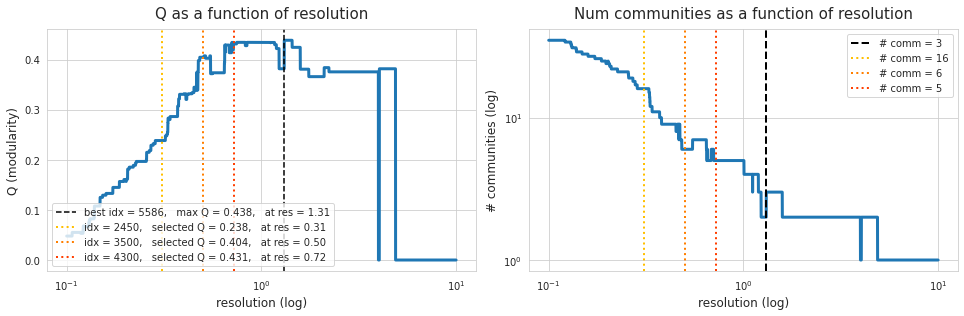

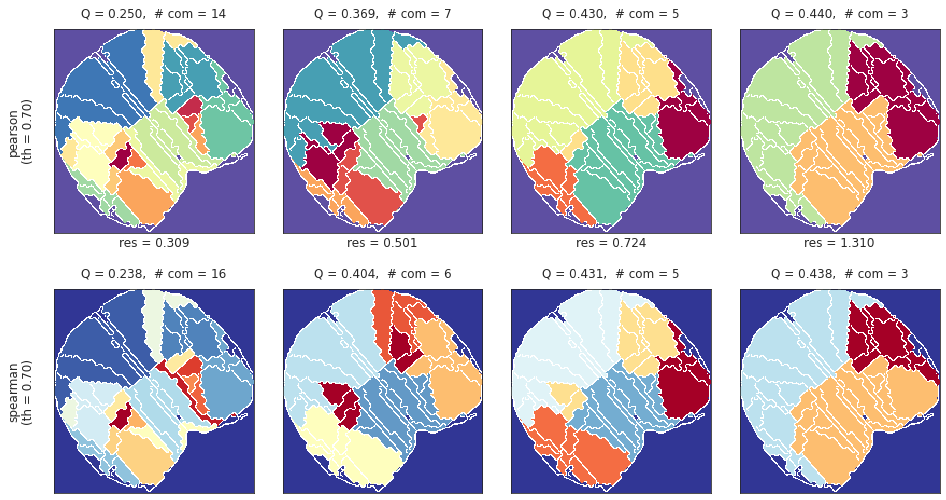

In [151]:
selected_idxs = [2450, 3500, 4300]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs_n['pearson'],
    spearman=corrs_n['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

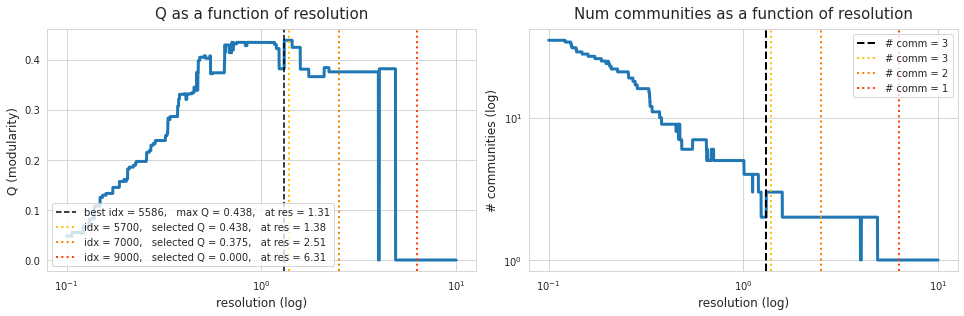

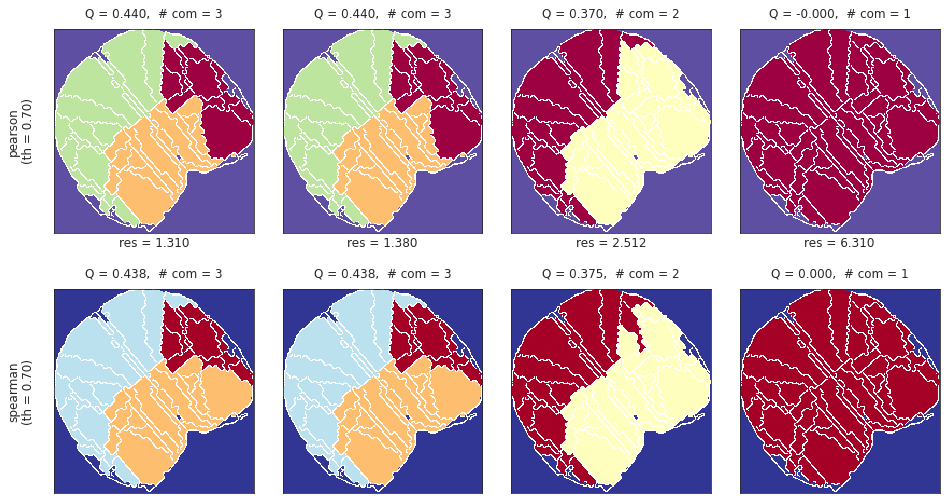

In [152]:
selected_idxs = [5700, 7000, 9000]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs_n['pearson'],
    spearman=corrs_n['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

#### Leiden

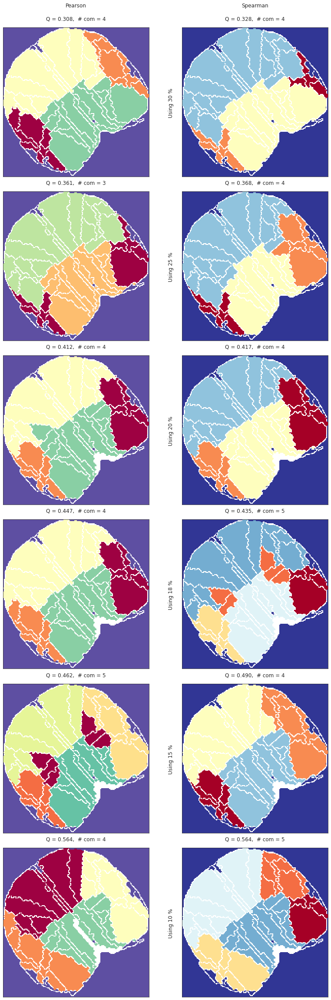

In [153]:
_ = plot_leiden_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    figsize=(12, 32),
    colorbar=False,
)

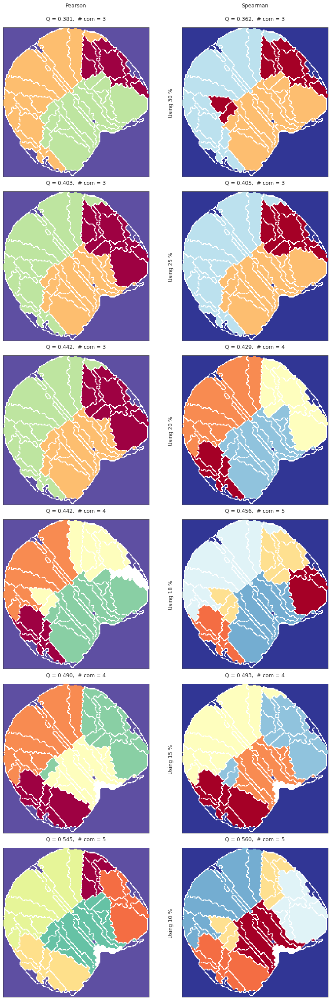

In [154]:
_ = plot_leiden_communities(
    pearson=corrs_n['pearson'],
    spearman=corrs_n['spearman'],
    atlas=load['atlas'],
    contour=atls_org['contour'],
    figsize=(12, 32),
    colorbar=False,
)

## Network measures

In [6]:
run = 1
regions = {}
tot_num_regions = {}
for subject in range(1, config.num_subjects+1):
    for session in range(1, config.num_sessions+1):
        _load = load_organized_data(
            folder='atlas-allen_unfiltered_unnormalized',
            config=config,
            subject=subject,
            session=session,
            run=run,
        )
        if _load is None:
            continue
        _atlsorg = organize_atlas(_load)
        key = 'sub-SLC{:02d}_ses-{:d}'.format(subject, session)
        regions[key] = _atlsorg['regions']
        tot_num_regions[key] = len(_atlsorg['regions'])

common_regions = list(set.intersection(*[set(reg_dict.keys()) for reg_dict in regions.values()]))
common_regions = {k: config.region_labels[k] for k in sorted(common_regions)}
common_r = [item[2:] for item in common_regions.values() if item[:2] == 'R-']
common_l = [item[2:] for item in common_regions.values() if item[:2] == 'L-']
common_global = set(common_r).intersection(common_l)
common_regions = {k: v for k, v in common_regions.items() if v[2:] in common_global}
len(common_regions)

44

In [7]:
common_regions

{2: 'R-Primary motor area (MOp,985)',
 3: 'R-Secondary motor area (MOs,993)',
 4: 'R-Primary somatosensory area, nose (SSp-n,353)',
 5: 'R-Primary somatosensory area, barrel field (SSp-bfd,329)',
 6: 'R-Primary somatosensory area, lower limb (SSp-ll,337)',
 7: 'R-Primary somatosensory area, mouth (SSp-m,345)',
 8: 'R-Primary somatosensory area, upper limb (SSp-ul,369)',
 9: 'R-Primary somatosensory area, trunk (SSp-tr,361)',
 10: 'R-Primary somatosensory area, unassigned (SSp-un,182305689)',
 11: 'R-Supplemental somatosensory area (SSs,378)',
 18: 'R-Anterolateral visual area (VISal,402)',
 19: 'R-Anteromedial visual area (VISam,394)',
 20: 'R-Lateral visual area (VISl,409)',
 21: 'R-Primary visual area (VISp,385)',
 23: 'R-posteromedial visual area (VISpm,533)',
 24: 'R-Anterior area (VISa,312782546)',
 26: 'R-Rostrolateral visual area (VISrl,417)',
 28: 'R-Anterior cingulate area, dorsal part (ACAd,39)',
 38: 'R-Retrosplenial area, lateral agranular part (RSPagl,894)',
 39: 'R-Retros

In [8]:
field_names = ('subject', 'session', 'percentile', 'node_labels', 'adjacency', 'graph', 'cfg')
GraphData = collections.namedtuple(typename='GraphData', field_names=field_names)

In [9]:
# HIDE CODE


lowcut = None
highcut = None

percentiles = [25, 20, 15, 10]

df_global = pd.DataFrame()
df_global_n = pd.DataFrame()

data_all = {}
data_all_n = {}

for subject in tqdm(range(1, config.num_subjects+1)):
    for session in range(1, config.num_sessions+1):
        df = pd.DataFrame()
        df_n = pd.DataFrame()
        for run in [1, 3, 5, 7]:
            cond_1 = subject == 3 and session == 2 and run in [2, 6]
            cond_2 = subject == 7 and session == 2 and run in [2, 7]
            if cond_1 or cond_2:
                continue

            _load = load_organized_data(
                folder='atlas-allen_unfiltered_unnormalized',
                config=config,
                subject=subject,
                session=session,
                run=run,
            )
            if _load is None:
                continue

            for k, v in _load['ca'].items():
                if np.isnan(v).sum():
                    print(session, run, k)

            # bandpass
            if lowcut is None or highcut is None:
                ca_bp = {k: v for k, v in _load['ca'].items()}
            else:
                ca_bp = {
                    k: apply_bandpass(
                        x=v,
                        fs=config.ca_fs,
                        lowcut=lowcut,
                        highcut=highcut,
                        order=order, )
                    for k, v in _load['ca'].items()
                }

            # normalize
            mean = np.mean([item.mean() for item in ca_bp.values()])
            sd = np.mean([item.std() for item in ca_bp.values()])
            ca_bp_n = {k: (v - mean) / sd for k, v in ca_bp.items()}

            # put in df
            df = pd.concat([df, pd.DataFrame.from_dict(ca_bp)])
            df_n = pd.concat([df_n, pd.DataFrame.from_dict(ca_bp_n)])
            
        # do stuff
        df = df.loc[:, common_regions.keys()]
        df_n = df_n.loc[:, common_regions.keys()]

        node_labels = df.columns.values.tolist()
        node_labels = {i: lbl for i, lbl in enumerate(node_labels)}

        corrs = get_corrs(df, percentiles=percentiles)
        corrs_n = get_corrs(df_n, percentiles=percentiles)

        key = 'sub-SLC{:02d}'.format(subject)
        key += '_ses-{:d}'.format(session)
         
        for perc in percentiles:
            a = corrs['pearson'][perc]
            g = nx.from_numpy_matrix(a)
            
            data_all['{:s}_perc-{:d}'.format(key, perc)] = GraphData(
                subject=subject,
                session=session,
                percentile=perc,
                node_labels=node_labels,
                adjacency=a,
                graph=g,
                cfg=mk_config_model(g, weighted=True),
            )
            
            a = corrs_n['pearson'][perc]
            g = nx.from_numpy_matrix(a)
            
            data_all_n['{:s}_perc-{:d}'.format(key, perc)] = GraphData(
                subject=subject,
                session=session,
                percentile=perc,
                node_labels=node_labels,
                adjacency=a,
                graph=g,
                cfg=mk_config_model(g, weighted=True),
            )

        df_global = pd.concat([df_global, df])
        df_global_n = pd.concat([df_global_n, df_n])

# fix global

corrs_global = get_corrs(df_global, percentiles=percentiles)
corrs_global_n = get_corrs(df_global_n, percentiles=percentiles)

data_global = {}
data_global_n = {}

for perc in percentiles:
    a = corrs_global['pearson'][perc]
    g = nx.from_numpy_matrix(a)

    data_global[perc] = GraphData(
        subject=-1,
        session=-1,
        percentile=perc,
        node_labels=node_labels,
        adjacency=a,
        graph=g,
        cfg=mk_config_model(g, weighted=True),
    )

    a = corrs_global_n['pearson'][perc]
    g = nx.from_numpy_matrix(a)

    data_global_n[perc] = GraphData(
        subject=-1,
        session=-1,
        percentile=perc,
        node_labels=node_labels,
        adjacency=a,
        graph=g,
        cfg=mk_config_model(g, weighted=True),
    )

  0%|          | 0/10 [00:00<?, ?it/s]

In [10]:
# network measures
from networkx.algorithms.cluster import transitivity, average_clustering
from networkx.algorithms.assortativity import degree_pearson_correlation_coefficient
from networkx.algorithms.efficiency_measures import global_efficiency, local_efficiency
from networkx.algorithms.approximation.clique import large_clique_size
from networkx.algorithms.shortest_paths.generic import average_shortest_path_length

In [11]:
measures_df = pd.DataFrame()

dict_list = []
for k in tqdm(data_all.keys()):
    for normalized in [True, False]:
        data = data_all_n[k] if normalized else data_all[k]
    
        # the real graph
        real_avg_clustering = average_clustering(data.graph, weight='weight')
        real_local_efficiency = local_efficiency(data.graph)
        real_large_clique_ratio = large_clique_size(data.graph) / len(common_regions)
        try:
            real_avg_shortest_path_len = average_shortest_path_length(data.graph, weight='weight')
        except:
            real_avg_shortest_path_len = np.nan
        real_global_efficiency = global_efficiency(data.graph)
        real_degree_corr_coef = degree_pearson_correlation_coefficient(data.graph, weight='weight')

        data_dict = {
            'tag': ['-'.join(['real', 'n' if normalized else ''])] * 6,
            'subject': [data.subject] * 6,
            'session': [data.session] * 6,
            'percentile': [data.percentile] * 6,
            'lbl': [
                'avg_clustering',
                'local_efficiency',
                'large_clique_ratio',
                'avg_shortest_path_len',
                'global_efficiency',
                'degree_corr_coef',
            ],
            'val': [
                real_avg_clustering,
                real_local_efficiency,
                real_large_clique_ratio,
                real_avg_shortest_path_len,
                real_global_efficiency,
                real_degree_corr_coef,
            ],
        }
        dict_list.append(data_dict)

        # configuration model
        cfg_avg_clustering = average_clustering(data.cfg, weight='weight')
        cfg_local_efficiency = local_efficiency(data.cfg)
        cfg_large_clique_ratio = large_clique_size(data.cfg) / len(common_regions)
        try:
            cfg_avg_shortest_path_len = average_shortest_path_length(data.cfg, weight='weight')
        except:
            cfg_avg_shortest_path_len = np.nan
        cfg_global_efficiency = global_efficiency(data.cfg)
        cfg_degree_corr_coef = degree_pearson_correlation_coefficient(data.cfg, weight='weight')

        data_dict = {
            'tag': ['-'.join(['cfg', 'n' if normalized else ''])] * 6,
            'subject': [data.subject] * 6,
            'session': [data.session] * 6,
            'percentile': [data.percentile] * 6,
            'lbl': [
                'avg_clustering',
                'local_efficiency',
                'large_clique_ratio',
                'avg_shortest_path_len',
                'global_efficiency',
                'degree_corr_coef',
            ],
            'val': [
                cfg_avg_clustering,
                cfg_local_efficiency,
                cfg_large_clique_ratio,
                cfg_avg_shortest_path_len,
                cfg_global_efficiency,
                cfg_degree_corr_coef,
            ],
        }
        dict_list.append(data_dict)
        
        data_dict = {
            'tag': ['-'.join(['ratio', 'n' if normalized else ''])] * 6,
            'subject': [data.subject] * 6,
            'session': [data.session] * 6,
            'percentile': [data.percentile] * 6,
            'lbl': [
                'avg_clustering',
                'local_efficiency',
                'large_clique_ratio',
                'avg_shortest_path_len',
                'global_efficiency',
                'degree_corr_coef',
            ],
            'val': [
                real_avg_clustering / cfg_avg_clustering,
                real_local_efficiency / cfg_local_efficiency,
                real_large_clique_ratio / cfg_large_clique_ratio,
                real_avg_shortest_path_len / cfg_avg_shortest_path_len,
                real_global_efficiency / cfg_global_efficiency,
                real_degree_corr_coef / cfg_degree_corr_coef,
            ],
        }
        dict_list.append(data_dict)

measures_df = pd.DataFrame.from_dict(merge_dicts(dict_list))

  0%|          | 0/120 [00:00<?, ?it/s]

...merging dicts: 0it [00:00, ?it/s]

In [12]:
measures_df

,tag,subject,session,percentile,lbl,val
0,real-n,1,1,25,avg_clustering,0.644256
1,real-n,1,1,25,local_efficiency,0.846707
2,real-n,1,1,25,large_clique_ratio,0.227273
3,real-n,1,1,25,avg_shortest_path_len,1.928298
4,real-n,1,1,25,global_efficiency,0.563020
...,...,...,...,...,...,...
4315,ratio-,10,3,10,local_efficiency,3.708654
4316,ratio-,10,3,10,large_clique_ratio,2.333333
4317,ratio-,10,3,10,avg_shortest_path_len,NaN
4318,ratio-,10,3,10,global_efficiency,0.723041


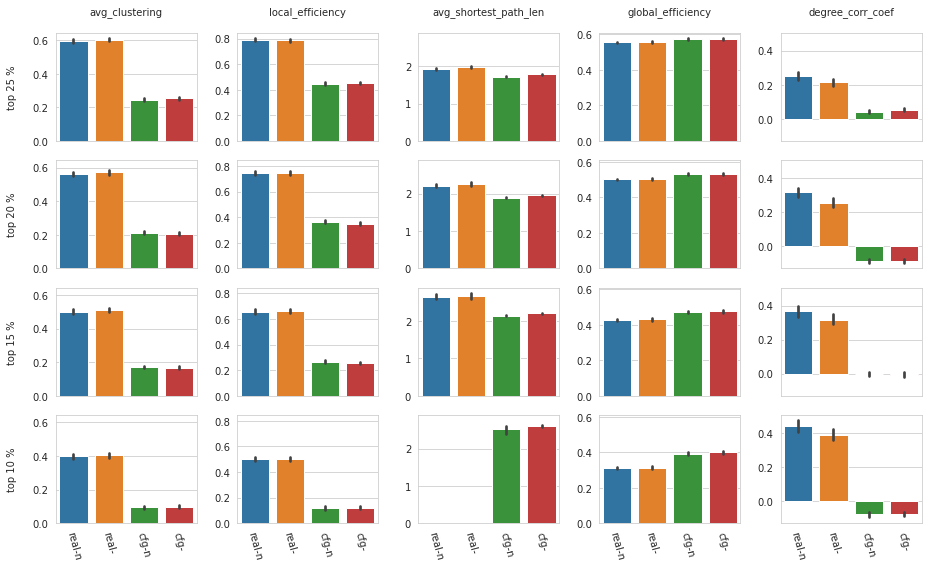

In [13]:
_perc = measures_df.percentile.unique().tolist()
_lbls = measures_df.lbl.unique().tolist()
_lbls = [item for item in _lbls if item != 'large_clique_ratio']
_tags = ['real-n', 'real-', 'cfg-n', 'cfg-']

sns.set_style('whitegrid')
fig, axes = plt.subplots(nrows=len(_perc), ncols=len(_lbls), figsize=(13, 8), sharey='col', sharex='all')

for i, perc in enumerate(_perc):
    for j, lbl in enumerate(_lbls):
        selected_df = measures_df.loc[
            (measures_df.tag.isin(_tags)) &
            (measures_df.percentile == perc) &
            (measures_df.lbl == lbl)
        ]
        sns.barplot(
            data=selected_df,
            y='val',
            x='tag',
            hue='tag',
            order=_tags,
            hue_order=_tags,
            dodge=False,
            ax=axes[i, j],
        )
        axes[i, j].legend().set_visible(False)
        axes[i, j].set_xlabel('')
        
        if i == 0:
            axes[i, j].set_title('{:s}\n'.format(lbl), fontsize=10)
            
        if j == 0:
            axes[i, j].set_ylabel('top {:d} {:s}\n'.format(perc, '%'), fontsize=10)
        else:
            axes[i, j].set_ylabel('')
            
        axes[i, j].tick_params(axis='x', rotation=-75)

fig.tight_layout()
fig.savefig('net_measures.pdf', dpi=300)
plt.show()

In [14]:
normalized = True
perc = 25
data = data_global_n[perc] if normalized else data_global[k]

# the real graph
global_avg_clustering = average_clustering(data.graph, weight='weight')
global_local_efficiency = local_efficiency(data.graph)
global_large_clique_ratio = large_clique_size(data.graph) / len(common_regions)
try:
    global_avg_shortest_path_len = average_shortest_path_length(data.graph, weight='weight')
except:
    global_avg_shortest_path_len = np.nan
global_global_efficiency = global_efficiency(data.graph)
global_degree_corr_coef = degree_pearson_correlation_coefficient(data.graph, weight='weight')

print(global_avg_clustering, global_local_efficiency, global_avg_shortest_path_len, global_degree_corr_coef)

# configuration model
global_cfg_avg_clustering = average_clustering(data.cfg, weight='weight')
global_cfg_local_efficiency = local_efficiency(data.cfg)
global_cfg_large_clique_ratio = large_clique_size(data.cfg) / len(common_regions)
try:
    global_cfg_avg_shortest_path_len = average_shortest_path_length(data.cfg, weight='weight')
except:
    global_cfg_avg_shortest_path_len = np.nan
global_cfg_global_efficiency = global_efficiency(data.cfg)
global_cfg_degree_corr_coef = degree_pearson_correlation_coefficient(data.cfg, weight='weight')

print(global_cfg_avg_clustering, global_cfg_local_efficiency, global_cfg_avg_shortest_path_len, global_cfg_degree_corr_coef)

0.5898890357886829 0.8062715870431183 1.8074813926478634 0.2637708998060512
0.25587019629498436 0.4625099733772861 1.6679558945481336 0.0246764094027035


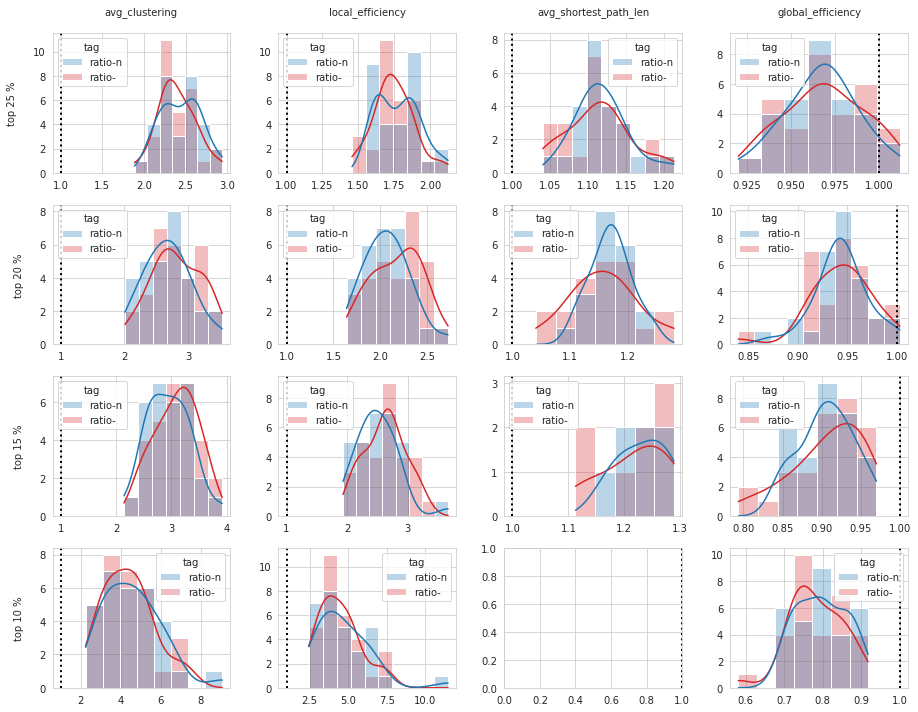

In [15]:
_perc = measures_df.percentile.unique().tolist()
_lbls = measures_df.lbl.unique().tolist()
_lbls = [item for item in _lbls if item not in ['large_clique_ratio', 'degree_corr_coef']]
_tags = ['ratio-n', 'ratio-']

sns.set_style('whitegrid')
fig, axes = plt.subplots(nrows=len(_perc), ncols=len(_lbls), figsize=(13, 10))

for i, perc in enumerate(_perc):
    for j, lbl in enumerate(_lbls):
        selected_df = measures_df.loc[
            (measures_df.tag.isin(_tags)) &
            (measures_df.percentile == perc) &
            (measures_df.lbl == lbl)
        ]
        sns.histplot(
            data=selected_df,
            x='val',
            hue='tag',
            hue_order=_tags,
            palette=['C0', 'C3'],
            legend=True,
            kde=True,
            alpha=0.3,
            ax=axes[i, j],
        )
        axes[i, j].axvline(1, ls=':', lw=2, color='k')
        # axes[i, j].legend().set_visible(False)
        axes[i, j].set_xlabel('')
        
        if i == 0:
            axes[i, j].set_title('{:s}\n'.format(lbl), fontsize=10)
            
        if j == 0:
            axes[i, j].set_ylabel('top {:d} {:s}\n'.format(perc, '%'), fontsize=10)
        else:
            axes[i, j].set_ylabel('')
            
        axes[i, j].tick_params(axis='x', rotation=0)

fig.tight_layout()
fig.savefig('net_measures_ratio.pdf', dpi=300)
plt.show()

### Degree centrality

In [32]:
centralities = {}
centralities_cfg = {}

for perc, data in data_global_n.items():
    # real
    g = data.graph
    degree = nx.degree_centrality(g)
    closeness = nx.closeness_centrality(g, distance='weight')
    harmonic = nx.harmonic_centrality(g, distance='weight')
    betweenness = nx.betweenness_centrality(g, weight='weight')
    try:
        information = nx.information_centrality(g, weight='weight')
    except:
        information = {}
    eigenvector = nx.eigenvector_centrality(g, weight='weight')
    katz = nx.katz_centrality_numpy(g, weight='weight')
    centralities[perc] = {
        'degree': {k: v/max(list(degree.values())) for k, v in degree.items()},
        'closeness': {k: v/max(list(closeness.values())) for k, v in closeness.items()},
        'harmonic': {k: v/max(list(harmonic.values())) for k, v in harmonic.items()},
        'betweenness': {k: v/max(list(betweenness.values())) for k, v in betweenness.items()},
        # 'information': information,
        'eigenvector': {k: v/max(list(eigenvector.values())) for k, v in eigenvector.items()},
        'katz': katz,
    }

    # cfg
    g = data.cfg
    degree = nx.degree_centrality(g)
    closeness = nx.closeness_centrality(g, distance='weight')
    harmonic = nx.harmonic_centrality(g, distance='weight')
    betweenness = nx.betweenness_centrality(g, weight='weight')
    try:
        information = nx.information_centrality(g, weight='weight')
    except:
        information = {}
    eigenvector = nx.eigenvector_centrality(g, weight='weight')
    katz = nx.katz_centrality_numpy(g, weight='weight')
    centralities_cfg[perc] = {
        'degree': {k: v/max(list(degree.values())) for k, v in degree.items()},
        'closeness': {k: v/max(list(closeness.values())) for k, v in closeness.items()},
        'harmonic': {k: v/max(list(harmonic.values())) for k, v in harmonic.items()},
        'betweenness': {k: v/max(list(betweenness.values())) for k, v in betweenness.items()},
        # 'information': information,
        'eigenvector': {k: v/max(list(eigenvector.values())) for k, v in eigenvector.items()},
        'katz': katz,
    }

In [33]:
percentile = 15

centralities_cortex = {}
for lbl, centrality_d in centralities[percentile].items():
    x = np.ones(load['atlas'].shape, dtype=float) * np.nan
    for node, value in centrality_d.items():
        region_id = node_labels[node]
        x[load['atlas'] == region_id] = value
    centralities_cortex[lbl] = x

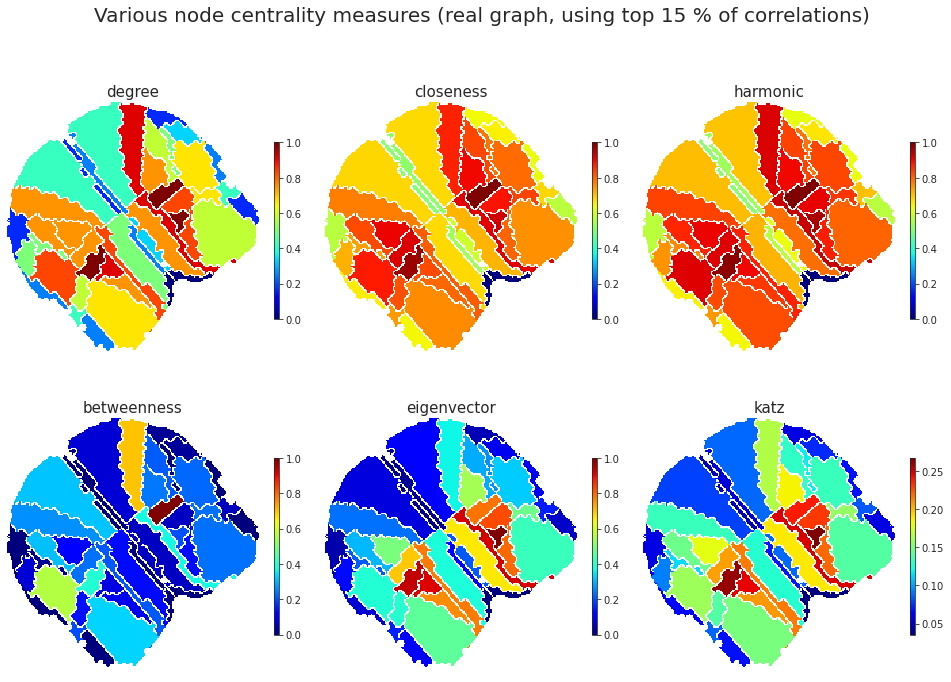

In [34]:
sns.set_style('white')
nrows, ncols = 2, 3
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 10))

for idx, (lbl, x) in enumerate(centralities_cortex.items()):
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(np.ma.masked_where(atls_org['contour'], x), cmap='jet', interpolation='none')
    axes[i, j].set_title(lbl, fontsize=15)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], aspect=40, shrink=0.5)

msg = 'Various node centrality measures (real graph, using top {:d} {:s} of correlations)'
fig.suptitle(msg.format(percentile, '%'), fontsize=20, y=1.01)
fig.tight_layout()
plt.show()

In [35]:
percentile = 15

centralities_cortex = {}
for lbl, centrality_d in centralities_cfg[percentile].items():
    x = np.ones(load['atlas'].shape, dtype=float) * np.nan
    for node, value in centrality_d.items():
        region_id = node_labels[node]
        x[load['atlas'] == region_id] = value
    centralities_cortex[lbl] = x

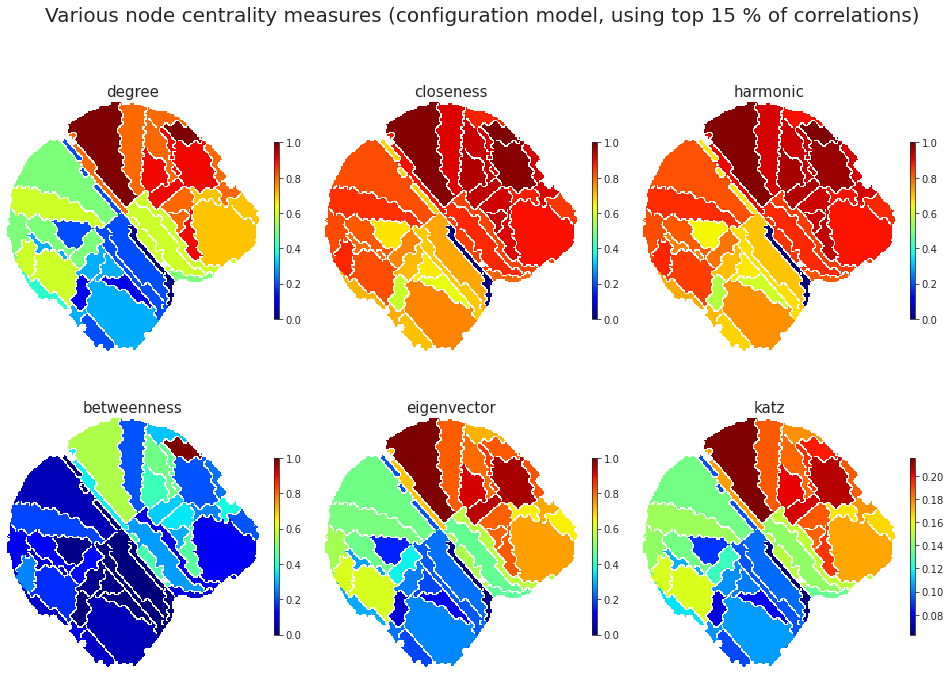

In [36]:
sns.set_style('white')
nrows, ncols = 2, 3
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 10))

for idx, (lbl, x) in enumerate(centralities_cortex.items()):
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(np.ma.masked_where(atls_org['contour'], x), cmap='jet', interpolation='none')
    axes[i, j].set_title(lbl, fontsize=15)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], aspect=40, shrink=0.5)

msg = 'Various node centrality measures (configuration model, using top {:d} {:s} of correlations)'
fig.suptitle(msg.format(percentile, '%'), fontsize=20, y=1.01)
fig.tight_layout()
plt.show()

## k-means parcellation

In [37]:
subject = 6
session = 1
num_kmeans_regions = 256

data_all = {}
df = pd.DataFrame()

for run in [1, 3, 5, 7]:
    _load = load_organized_data(
        folder='atlas-{:d}_unfiltered_unnormalized'.format(num_kmeans_regions),
        config=config,
        subject=subject,
        session=session,
        run=run,
    )
    data_all[run] = _load
    
    # normalize
    mean = np.mean([item.mean() for item in _load['ca'].values()])
    sd = np.mean([item.std() for item in _load['ca'].values()])
    _ca = {k: (v - mean) / sd for k, v in _load['ca'].items()}
    _df = pd.DataFrame.from_dict(_ca)
    df = pd.concat([df, _df])

node_labels = df.columns.values.tolist()
node_labels = {i: lbl for i, lbl in enumerate(node_labels)}

df.describe()

,1,2,3,4,5,6,7,8,9,10,...,247,248,249,250,251,252,253,254,255,256
count,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,...,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000,22000.000000
mean,-0.018567,-0.019268,-0.018573,-0.019975,-0.012233,-0.019579,-0.013274,-0.017254,-0.019225,-0.021240,...,-0.047454,-0.038794,-0.033164,-0.021091,-0.032738,-0.032049,-0.033366,-0.021179,-0.025392,-0.011155
std,0.300022,0.356432,0.327446,0.258883,0.324477,0.219455,0.402799,0.436301,0.402445,0.474195,...,0.920687,0.696547,0.636424,0.516440,0.467836,0.527120,0.565671,0.453883,0.461031,0.360292
min,-1.029204,-1.167565,-1.201996,-1.056114,-1.314063,-0.833822,-1.454804,-1.525023,-1.447802,-1.656101,...,-3.307437,-2.339551,-2.198961,-1.838139,-1.674815,-1.869581,-2.148521,-1.642093,-1.831903,-1.268252
25%,-0.216048,-0.259642,-0.233899,-0.185013,-0.227129,-0.159971,-0.285777,-0.317266,-0.278159,-0.331987,...,-0.652003,-0.500764,-0.447824,-0.359018,-0.340461,-0.382036,-0.409294,-0.319254,-0.333764,-0.251294
50%,-0.020831,-0.021058,-0.018897,-0.023031,-0.016689,-0.027243,-0.019785,-0.031258,-0.014661,-0.006576,...,-0.033552,-0.032187,-0.032476,-0.027565,-0.026000,-0.030728,-0.028511,-0.031004,-0.031090,-0.021981
75%,0.172461,0.209950,0.196467,0.137881,0.196039,0.110576,0.250332,0.263158,0.240053,0.290073,...,0.551793,0.411178,0.365958,0.295209,0.274132,0.304013,0.324155,0.259512,0.265411,0.209070
max,1.347141,1.504027,1.543090,1.300926,1.433223,1.093910,1.907842,2.077952,2.087863,2.202855,...,5.481783,5.063040,4.234665,4.673918,2.418522,3.231462,3.528874,3.124887,2.864861,2.397520


In [38]:
percentiles = [30, 25, 20, 18, 15, 10]
corrs = get_corrs(df, percentiles=percentiles)

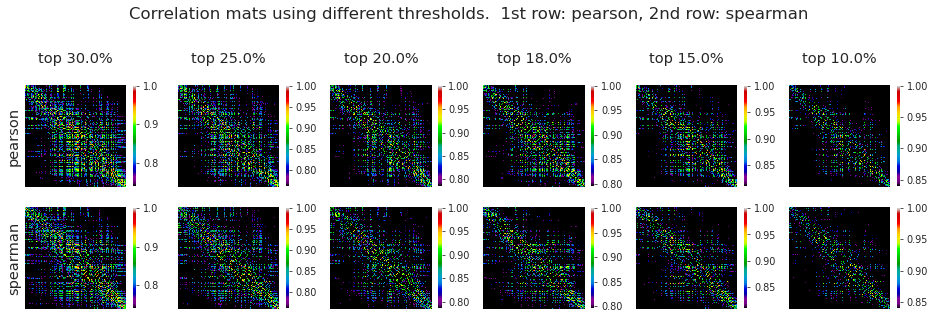

In [39]:
_ = plot_corrs(corrs['pearson'], corrs['spearman'])

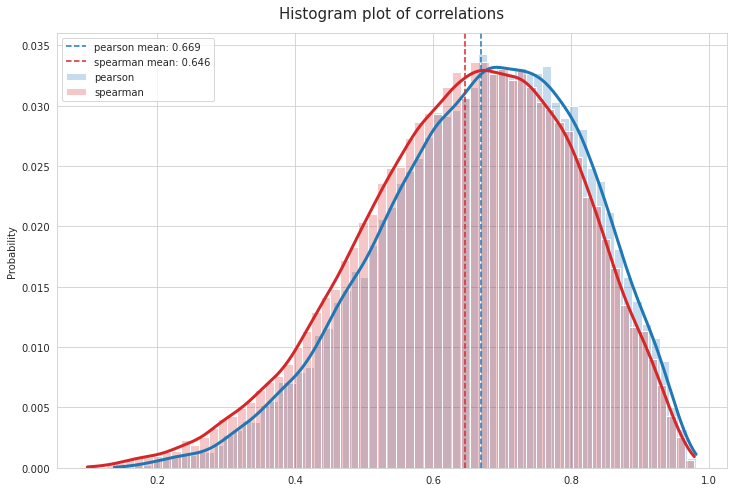

In [40]:
_ = plot_corr_hist(
    corr_list=[corrs['pearson_corr'], corrs['spearman_corr']],
    labels=['pearson', 'spearman'],
    colors=['C0', 'C3'],
)

In [41]:
graphs = {perc: nx.from_numpy_matrix(a) for perc, a in corrs['spearman'].items()}

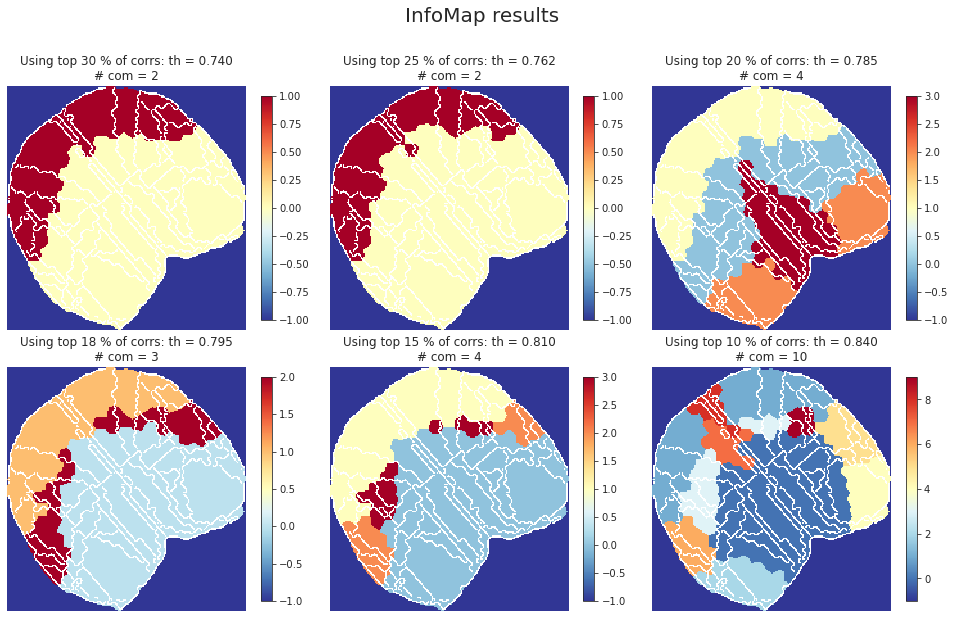

In [42]:
sns.set_style('white')
nrows, ncols = 2, len(graphs)//2
fig, axes = plt.subplots(nrows, ncols, figsize=(13.5, 8.5))

for idx, (perc, g) in enumerate(graphs.items()):
    infomap_coms = cdlib_algorithms.infomap(g)
    infomap_community = infomap_coms.communities
    infomap_partition = convert('community', 'partition', community=infomap_community)
    output = filter_islands(infomap_partition, load['atlas_kmeans'], node_labels, min_com_size=0)
    msg = 'Using top {:d} {:s} of corrs: th = {:.3f}\n# com = {:d}'
    msg = msg.format(
        perc, '%', np.min(corrs['spearman'][perc][corrs['spearman'][perc] > 0]),
        len(np.unique(output['comm_mat'][output['comm_mat']>-1])),
    )
    i, j = idx//ncols, idx%ncols
    im = axes[i, j].imshow(
        np.ma.masked_where(atls_org['contour'], output['comm_mat']), cmap='RdYlBu_r', interpolation='none')
    axes[i, j].set_title(msg, fontsize=12)
    axes[i, j].axis('off')
    plt.colorbar(mappable=im, ax=axes[i, j], shrink=0.85)

sup = fig.suptitle('InfoMap results', fontsize=20, y=1.02)
fig.tight_layout()    
plt.show()

In [43]:
results_louvain = run_louvain(graphs[20], res=np.logspace(-1, 1, 10001))

  0%|          | 0/10001 [00:00<?, ?it/s]

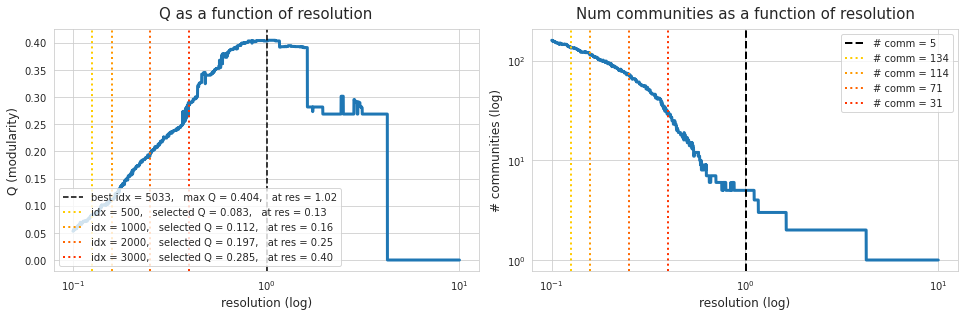

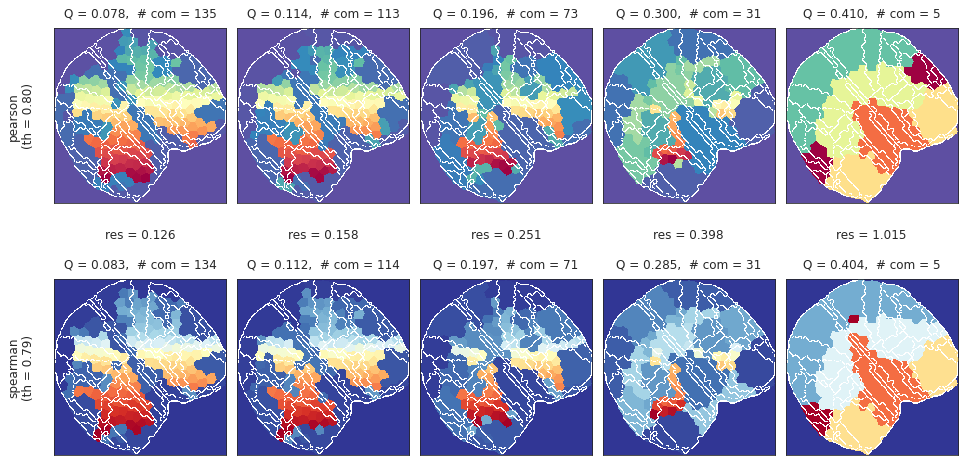

In [45]:
selected_idxs = [500, 1000, 2000, 3000]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas_kmeans'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

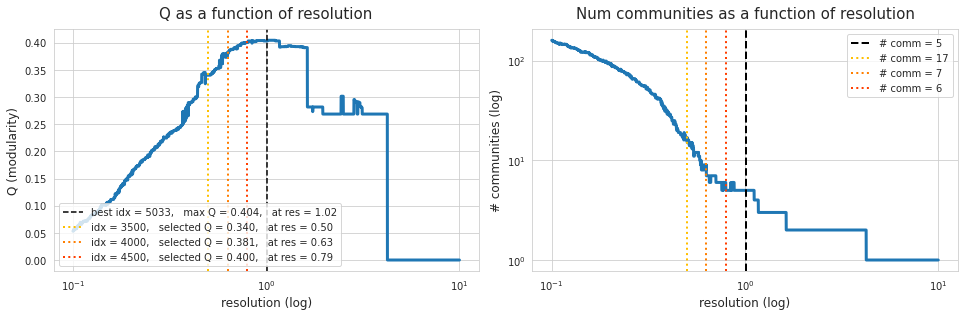

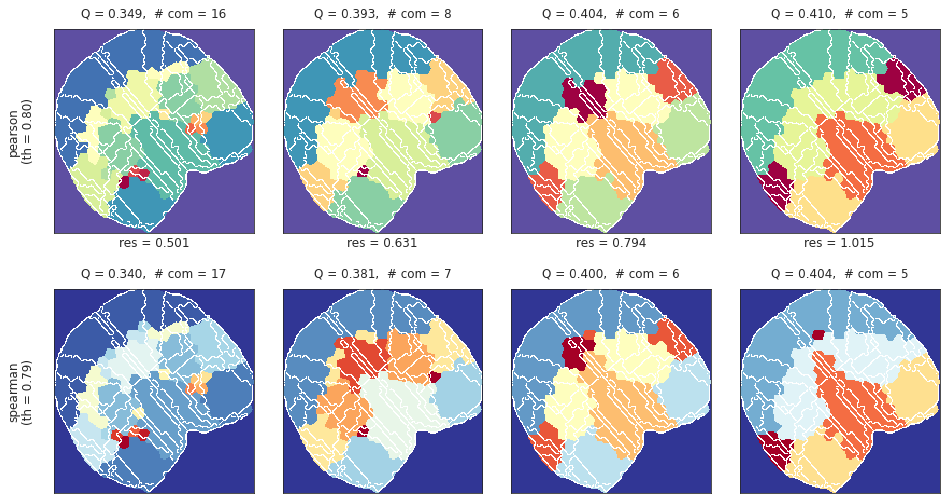

In [49]:
selected_idxs = [3500, 4000, 4500]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas_kmeans'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

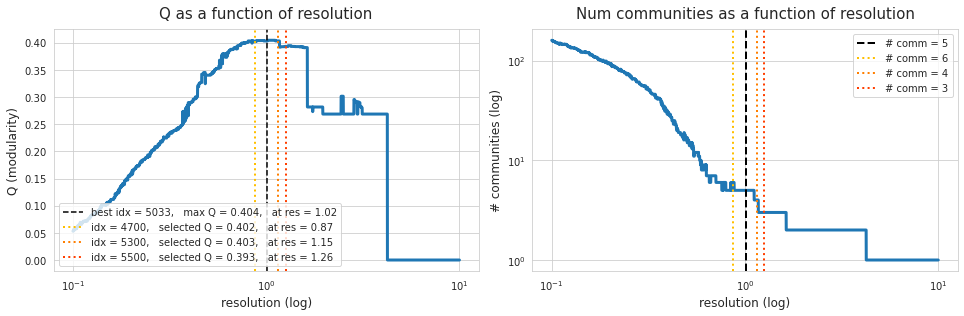

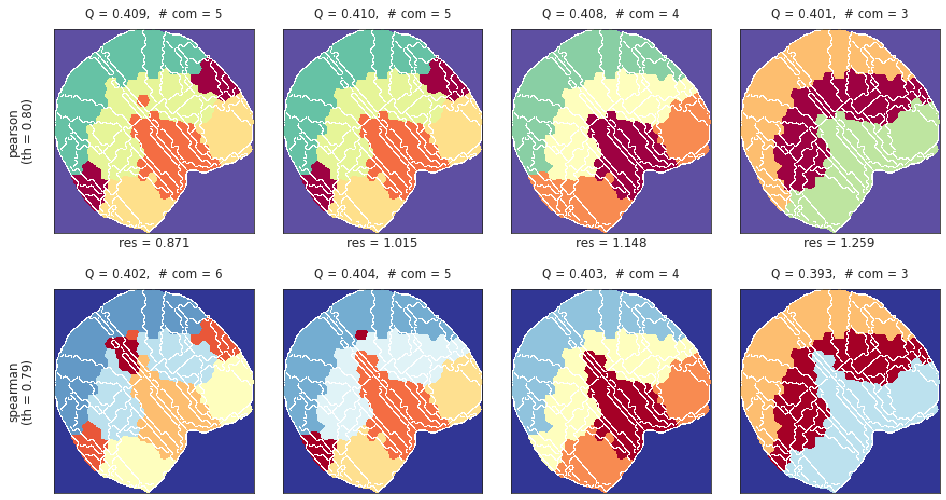

In [55]:
selected_idxs = [4700, 5300, 5500]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas_kmeans'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

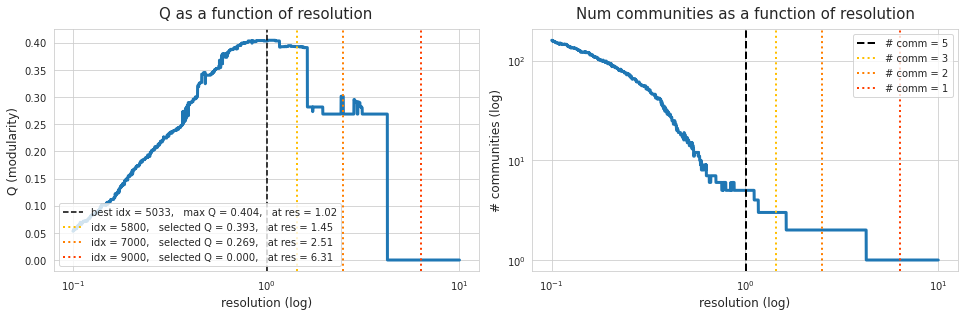

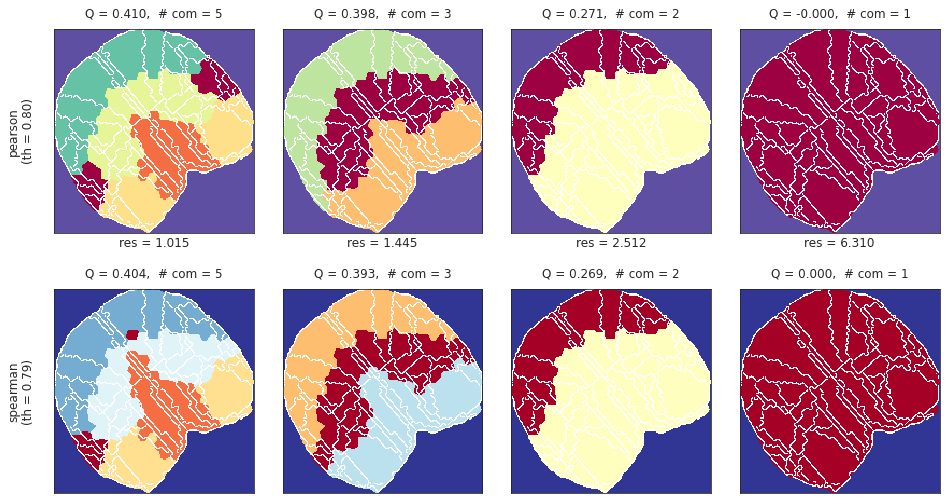

In [59]:
selected_idxs = [5800, 7000, 9000]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas_kmeans'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 7),
    colorbar=False, )

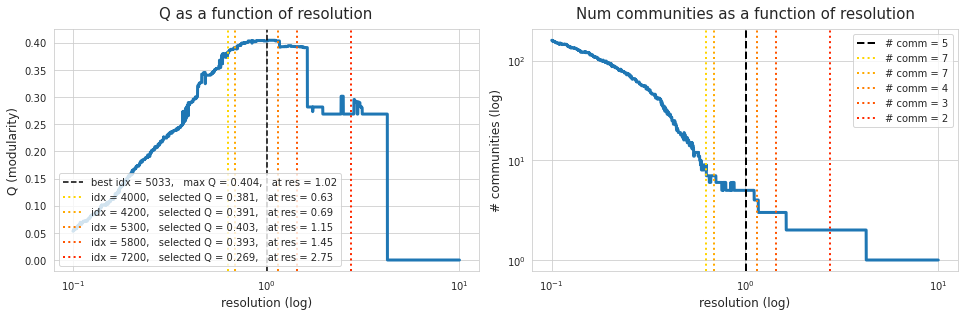

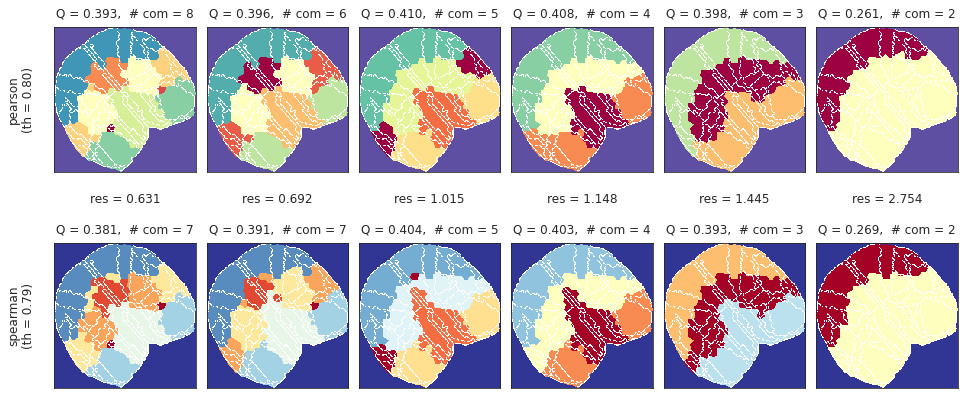

In [71]:
selected_idxs = [4000, 4200, 5300, 5800, 7200,]
_ = plot_louvain_results(results_louvain, selected_idxs=selected_idxs)

print('\n')

fig, axes = plot_louvain_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas_kmeans'],
    contour=atls_org['contour'],
    modularities=results_louvain['modularities'],
    selected_idxs=selected_idxs,
    percentile=20,
    min_com_size=0,
    figsize=(13.5, 6),
    colorbar=False, )

#### Leiden

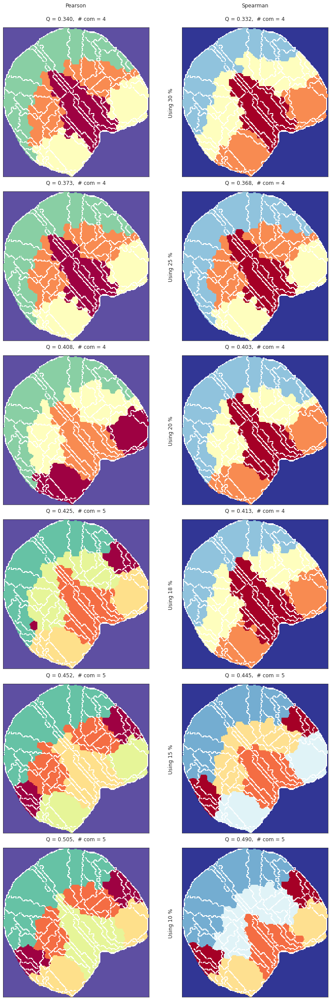

In [73]:
_ = plot_leiden_communities(
    pearson=corrs['pearson'],
    spearman=corrs['spearman'],
    atlas=load['atlas_kmeans'],
    contour=atls_org['contour'],
    figsize=(12, 32),
    colorbar=False,
)